In [2]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
#### upload the modify CSV file to your drive (add features name)
os.chdir('/content/gdrive/MyDrive') # change path if needed 
## Data
wine_df = pd.read_csv('White_wine Quality.csv')

In [28]:
## Seperate data to X (data for different features) and Y(the quality label)
X_wine = wine_df[['Alcohol','Malic acid', 'Ash', 'Alkalinity of ash', 'Magnesium', 'Total phenols', 'Flavanoids', 'Nonflavanoid phenols', 'Proanthocyanins', 'Hue']].to_numpy()
y_wine = wine_df['quality label'].to_numpy()

Visualizing Data

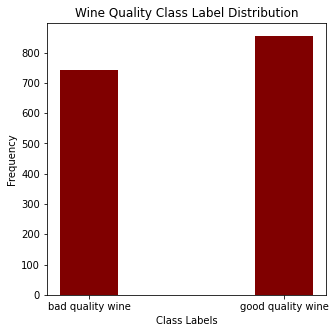

In [ ]:
## Visualizing the data
# Distribution of bad quality wine vs good quality wine
# We are assuming class label 0 = bad quality wine and class label 1 = good quality wine
goodCount = np.count_nonzero(y_wine)
badCount = X_wine.shape[0] - goodCount
classLabel = ["bad quality wine", "good quality wine"]
classLabelCount = [badCount, goodCount]
plt.figure(figsize=(5,5))
plt.bar(classLabel, classLabelCount, color='maroon', width=0.3)
plt.xlabel("Class Labels")
plt.ylabel("Frequency")
plt.title("Wine Quality Class Label Distribution")
plt.show()

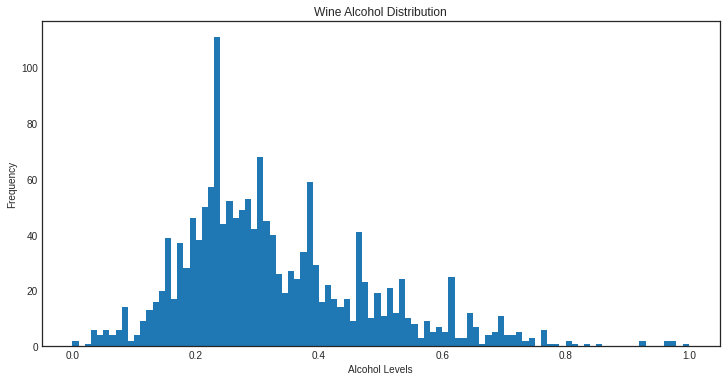

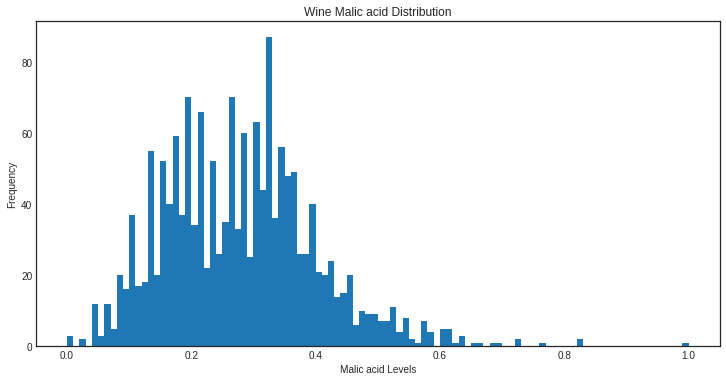

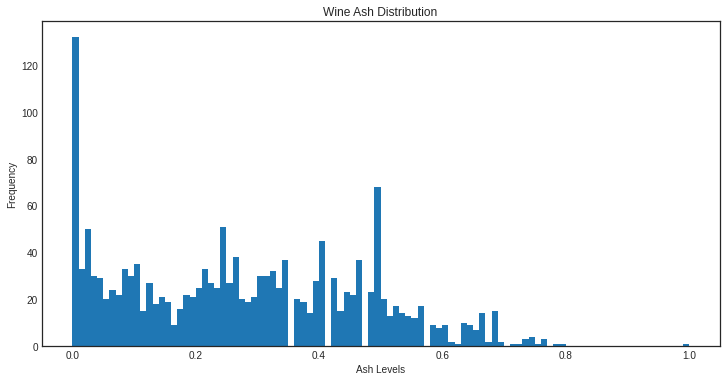

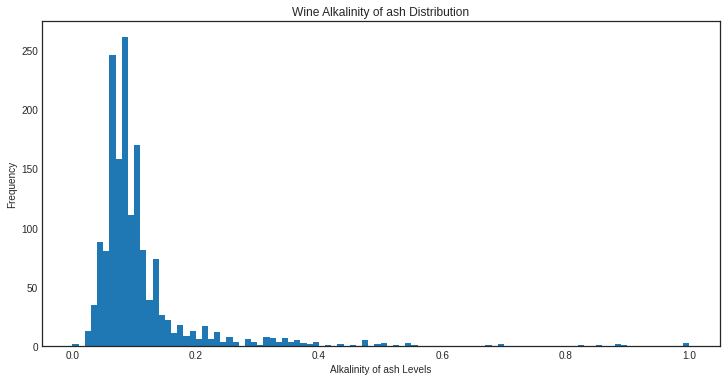

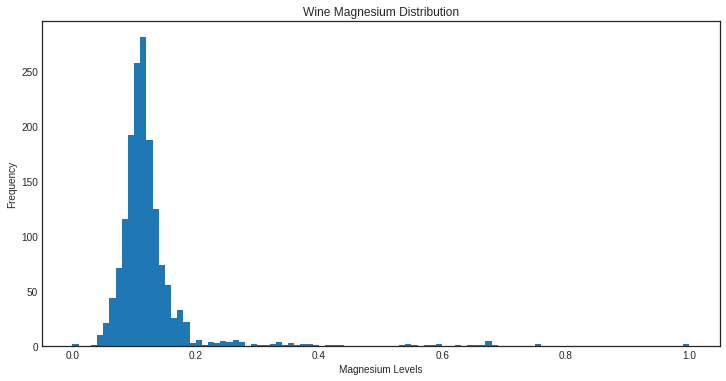

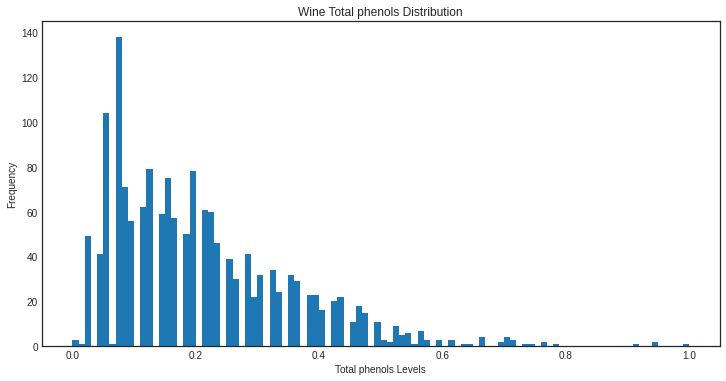

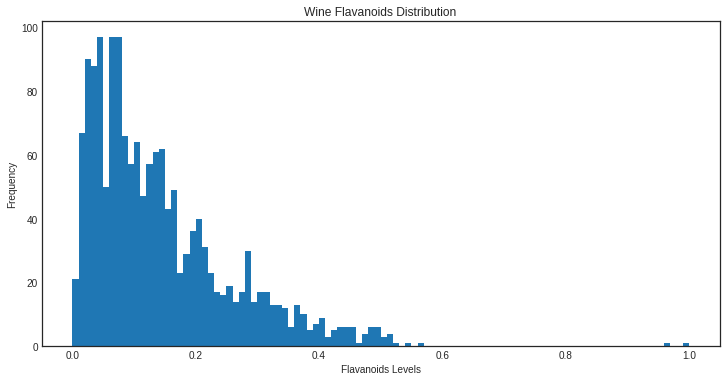

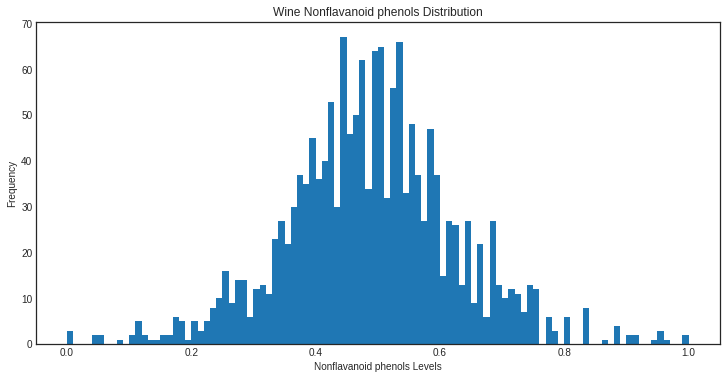

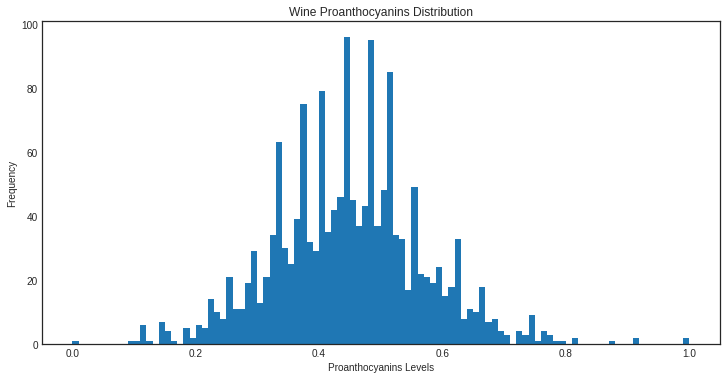

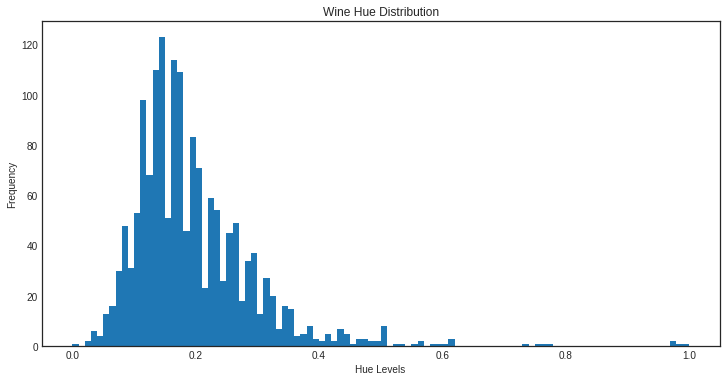

In [ ]:
## Visualizing the data
## Checking distribution
nBins = 100
# getting the feature names
featureNames = wine_df.columns

# Distribution of other features of Hepatitis
plt.style.use('seaborn-white')
for curFeature in range(0, X_wine.shape[1]):
  plt.figure(figsize=(10,5))
  plt.hist(X_wine[:, curFeature], nBins)
  plt.tight_layout()
  plt.xlabel(featureNames[curFeature].capitalize() + " Levels")
  plt.ylabel("Frequency")
  plt.title("Wine " + str(featureNames[curFeature].capitalize()) + " Distribution")
  plt.show()

<ipython-input-34-c4e2a612b5fe>:4: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  temp.hist(bins=100, ax=ax, grid=False)


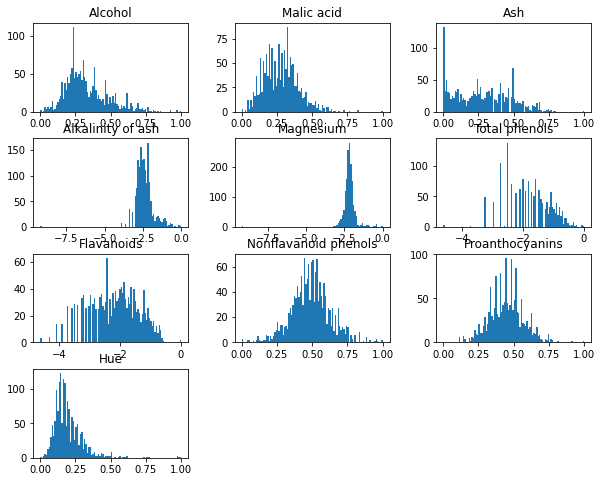

In [34]:
## Visualizing the data together
fig, ax = plt.subplots(figsize=(10, 8))
temp = wine_df.drop('quality label', axis=1)
temp.hist(bins=100, ax=ax, grid=False)
fig.show()


Cross correlations between features and label

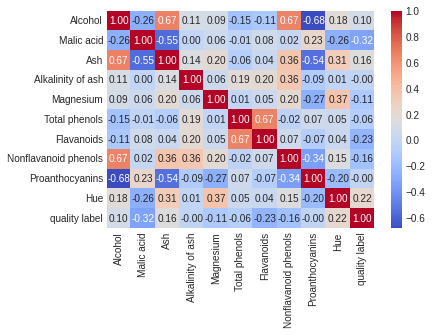

In [ ]:
## Visualizing the data
## Checking correlation
corr_matrix = wine_df.corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm',fmt='.2f')
plt.show()

Function

In [5]:
## feature Standardization
def featureStandardization(X): 
    mean = np.mean(X[:,1:],axis=0)
    std = np.std(X[:, 1:],axis=0)
    for i in range(0, X.shape[0]):
        X[i, 1:] = (X[i, 1:] - mean)/std
    return X

In [6]:
## function of finding outlier in data (Z score >3)
def detect_outliers(data, columns):
    outliers = []
    for column in columns:
        mean = np.mean(data[column])
        std = np.std(data[column])
        for i in data.index:
            z_score = (data.loc[i, column] - mean) / std
            if np.abs(z_score) > 3:
                outliers.append(i)
    return outliers

In [7]:
## function of shuffling the data
def shuffle(X,y):
  indices = np.random.permutation(X.shape[0])
  X = X[indices]
  y = y[indices]
  return X, y

In [8]:
## function of Logistic function
def sigmoid(z):
    #clip the values of the input to the sigmoid function to prevent overflow or underflow.
    z = np.clip(z, -10000, 10000)
    return 1.0/(1 + np.exp(-z))
## Loss/Cost function
def loss(y, y_hat):
    #add a small epsilon value to the predicted probabilities to ensure they are not exactly 0 or 1
    y_hat = np.clip(y_hat, 1e-8, 1-1e-8)
    loss = -np.mean(y*(np.log(y_hat)) + (1-y)*np.log(1-y_hat))
    return loss
## Gradient Descent
def gradients(X, y, y_hat):
    
    # X --> Input data.
    # y --> true/target value.
    # y_hat --> hypothesis/predictions.
    # dw --> weights (parameter).
    # db --> bias (parameter).
    
    # m-> number of training examples.
    m = X.shape[0]
    
    # Gradient of loss w.r.t weights.
    dw = (1/m)*np.dot(X.T, (y_hat - y))
    
    # Gradient of loss w.r.t bias.
    db = (1/m)*np.sum((y_hat - y)) 
    
    return dw, db

def train(X, y, stop, lr, decay):
    
    # X --> Input.
    # y --> true/target value.
    # stop --> Stop threshold of the L2 distance between the current and previous parameter estimates.
    # lr --> Learning rate.
    # decay --> Decaying rate.
        
    # m-> number of training examples
    # n-> number of features 
    m, n = X.shape
    
    # Initializing weights and bias to zeros.
    w = np.zeros((n,1))
    b=0
    
    # Reshaping y.
    y = y.reshape(m,1)
    
    
    # Empty list to store losses and L2 distance(error).
    losses = []
    err=[]
    error = 888 ## giving a very large error to start the for loop
    interations=0
    # Training loop.
    for epoch in range(1000000000): ##maximum 10^9 interations
        if error >= stop:
            
            # Calculating hypothesis/prediction.
            y_hat = sigmoid(np.dot(X, w) + b)
            
            # Getting the gradients of loss w.r.t parameters.
            dw, db = gradients(X, y, y_hat)
            
            # Updating the parameters.
            alpha = lr/(interations*decay + 1)
            w_new = w - alpha*dw
        # Calculating error and appending it in the list.
            error =  np.linalg.norm(w_new - w, 2)
            b_new = b - alpha*db
            err.append(error)
            w = w_new
            b = b_new
        # Calculating loss and appending it in the list.
            l = loss(y, sigmoid(np.dot(X, w) + b))
            interations +=1
            losses.append(l)
        else:
            break
        
        
    # returning weights, bias, losses(List), error(List), interations.
    return w, b, losses, err, interations

# Predict label from test data
def predict(X,w,b):
    
    # X --> Input.
    
    # Calculating presictions/y_hat.
    preds = sigmoid(np.dot(X, w) + b)
    
    # Empty List to store predictions.
    pred_class = []
    # if y_hat >= 0.5 --> round up to 1
    # if y_hat < 0.5 --> round up to 1
    pred_class = [1 if i > 0.5 else 0 for i in preds]
    
    return np.array(pred_class)

# Calculating Accuracy
def accuracy(y, y_hat):
    accuracy = np.sum(y == y_hat) / len(y)
    return accuracy

def changeModelOrder(model_order, X):
  # If model order is greater than one do something about the matrix
  Xtmp = X
  if model_order > 1:
    for k in range(2,model_order+1):
      temp = Xtmp[:,0:Xtmp.shape[1]]**k
      Xtmp =  np.concatenate((Xtmp,temp),axis=1)
    print(f"The order of the linear model is now: {model_order}")
    m, n = Xtmp.shape
    print("The shape of X ---> " + str(m) + "x" + str(n))
    return Xtmp   
  # If model order = 1 or less we set model to original model
  else:
    print(f"The order of the linear model didn't change: {model_order}")
    m, n = Xtmp.shape
    print("The shape of X ---> " + str(m) + "x" + str(n))
    return Xtmp

  

In [9]:
## function of k-folds validation

def validation(k, X, y, stop_threshold, learning_rate, decay_rate):
  ## k --> how many folds?
  fold_size = y.size//k
  folds = [np.arange(i*fold_size, (i+1)*fold_size) for i in range(k-1)]
  folds.append(np.arange((k-1)*fold_size, y.size))

  # Empty list to store all accuracy, losses, interation time and L2 distance(error)
  all_acu =[]
  all_err = []
  all_losses=[]
  all_interation = []
  for i in range(k):
    print('No.'+ str(i+1) + ' fold start')
    # Get the test fold indices

    test_indices = folds[i]
    
    # Get the training fold indices
    train_indices = np.concatenate([folds[j] for j in range(k) if j != i])
    
    # Split the data into train and test sets
    X_train, X_test = X[train_indices], X[test_indices]
    y_train, y_test = y[train_indices], y[test_indices]
    w, b, losses, err, interation = train(X_train, y_train, stop=stop_threshold, lr=learning_rate, decay= decay_rate)
    print('interations  ' + str(interation))
    all_acu.append(accuracy(y_test, y_hat=predict(X_test,w,b)))
    all_err.append(err)
    all_losses.append(losses)
    all_interation.append(interation)
  return all_acu, all_err, all_losses, all_interation 



In [10]:
## function of plotting results
def plot_results(all_acu, all_err, all_losses, all_interation):
  print('Average Accuracy --> ' + str(sum(all_acu)/10))
  ## plot Accuracy Distribution 10-Fold of Current Model
  plt.figure(figsize=(7,7))
  labels = ['1st', '2nd', '3rd', '4th', '5th', '6th', '7th', '8th', '9th', '10th']
  plt.bar(range(1,11), all_acu, 0.5, color='b')
  plt.xticks(range(1, 11), labels, rotation=45)
  plt.xlabel('Fold Number', fontsize=14)  
  plt.ylabel('Accuracy', fontsize=14)
  plt.yticks(fontsize=14)
  plt.xticks(fontsize=14)
  plt.title("Accuracy Distribution 10-Fold of Current Model", fontsize=16)
  plt.grid()
  plt.show()
  ## plot loss function with interations
  plt.figure(figsize=(7,7))
  y = all_losses
  x = all_interation
  colors = ['red', 'blue', 'green', 'purple', 'orange', 'yellow', 'brown', 'pink', 'gray', 'black']
  fig, ax = plt.subplots()
  for i in range(10):
    ax.plot(range(1,x[i]+1), y[i], c=colors[i], label=f'Fold {i+1}')
  ax.set_xscale('log')
  #ax.set_yscale('log')
  ax.set_xlabel('Interation of Gradient decent', fontsize=14)
  ax.set_ylabel('Loss', fontsize=14)
  ax.legend()
  plt.show()
  ## plot relatively error with interations
  plt.figure(figsize=(7,7))
  y = all_err
  x = all_interation
  colors = ['red', 'blue', 'green', 'purple', 'orange', 'yellow', 'brown', 'pink', 'gray', 'black']
  fig, ax = plt.subplots()
  for i in range(10):
    ax.plot(range(1,x[i]+1), y[i], c=colors[i], label=f'Fold {i+1}')
  ax.set_xscale('log')
  #ax.set_yscale('log')
  ax.set_xlabel('Interation of Gradient decent', fontsize=14)
  ax.set_ylabel('Relative Error Between Parameters (w)', fontsize=14)
  ax.legend()
  plt.show()




-------- Model 1 (polynomial order 1)-------

Testing 1. Raw data (Try learning rate 10)

-------- Raw Data Test Start --------
The order of the linear model didn't change: 1
The shape of X ---> 1599x10
-------- Now testing learing rate is 10--------
No.1 fold start
interations  681461
No.2 fold start
interations  688356
No.3 fold start
interations  650849
No.4 fold start
interations  699904
No.5 fold start
interations  700681
No.6 fold start
interations  668975
No.7 fold start
interations  642987
No.8 fold start
interations  663869
No.9 fold start
interations  688575
No.10 fold start
interations  666267
Average Accuracy --> 0.727403414195867


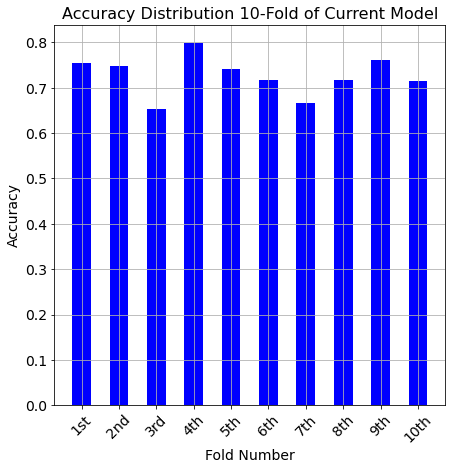

<Figure size 504x504 with 0 Axes>

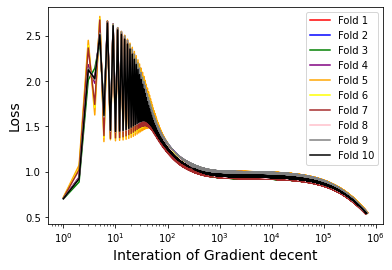

<Figure size 504x504 with 0 Axes>

/usr/local/lib/python3.8/dist-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


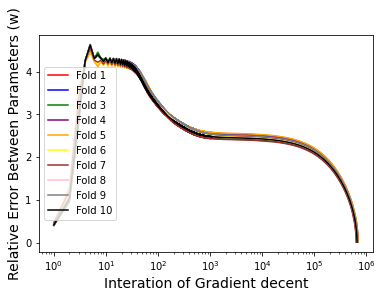

In [22]:
## Running for the raw data
print('-------- Raw Data Test Start --------')
# create list to save data
raw_order1_accur=[]
raw_order1_iteration=[]
# Load data again
wine_df = pd.read_csv('White_wine Quality.csv')
X_wine = wine_df[['Alcohol','Malic acid', 'Ash', 'Alkalinity of ash', 'Magnesium', 'Total phenols', 'Flavanoids', 'Nonflavanoid phenols', 'Proanthocyanins', 'Hue']].to_numpy()
y_wine = wine_df['quality label'].to_numpy()
# shuffling data
X_wine, y_wine = shuffle(X_wine,y_wine)
# Test in linear order 1
X_wine = changeModelOrder(1, X_wine)
## testing 7 different learning rates
learn_test = [10]
#--- setting decay rate 0.000001 ---
#--- when iterations up to 10^6, the learning rate will be 1/2*learning rate, and up to 10^7 for ~1/10*learning rate --- 
for learn in learn_test:
  print('-------- Now testing learing rate is ' + str(learn) + '--------')
  all_acu, all_err, all_losses, all_interation = validation(k = 10,X = X_wine,y = y_wine, stop_threshold = 0.01, learning_rate=learn, decay_rate = 0.000001)
  plot_results(all_acu, all_err, all_losses, all_interation)
  raw_order1_accur.append(sum(all_acu)/10)
  raw_order1_iteration.append(sum(all_interation)/10)

Testing 1. Raw data (Try other learning rates)

In [ ]:
learn_para = [4, 1, 0.5, 0.1, 0.05, 0.01, 0.005]

-------- Raw Data Test Start --------
The order of the linear model didn't change: 1
The shape of X ---> 1599x10
-------- Now testing learing rate is 4--------
No.1 fold start
interations  4004
No.2 fold start
interations  4169
No.3 fold start
interations  4004
No.4 fold start
interations  3987
No.5 fold start
interations  4056
No.6 fold start
interations  4027
No.7 fold start
interations  3942
No.8 fold start
interations  4079
No.9 fold start
interations  3880
No.10 fold start
interations  4242
Average Accuracy --> 0.7299528301886792


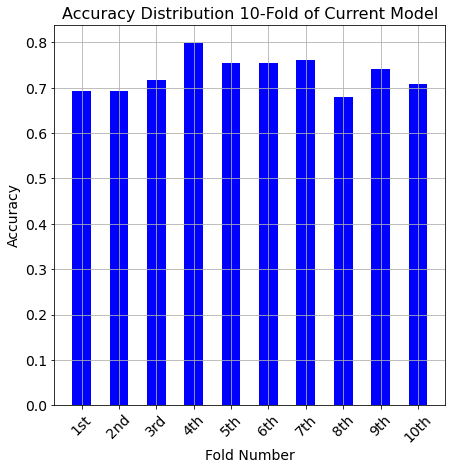

<Figure size 504x504 with 0 Axes>

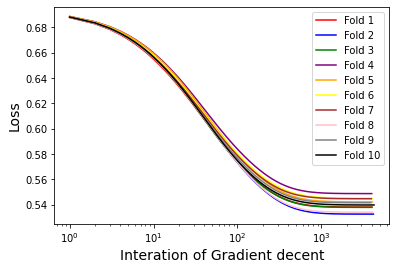

<Figure size 504x504 with 0 Axes>

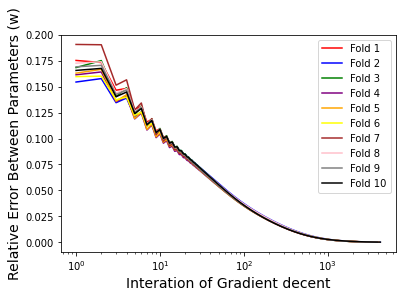

-------- Now testing learing rate is 1--------
No.1 fold start
interations  11529
No.2 fold start
interations  12029
No.3 fold start
interations  11387
No.4 fold start
interations  11478
No.5 fold start
interations  11758
No.6 fold start
interations  11622
No.7 fold start
interations  11412
No.8 fold start
interations  11656
No.9 fold start
interations  11153
No.10 fold start
interations  12256
Average Accuracy --> 0.7311769991015273


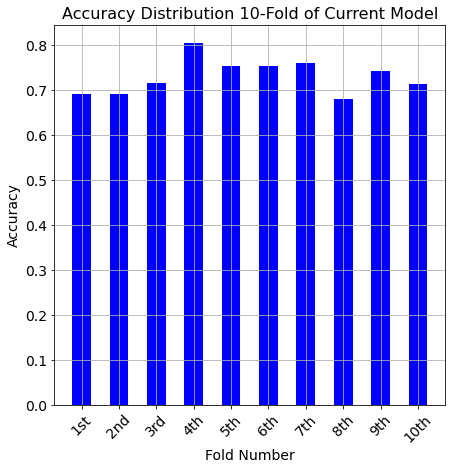

<Figure size 504x504 with 0 Axes>

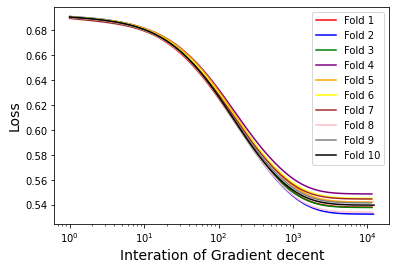

<Figure size 504x504 with 0 Axes>

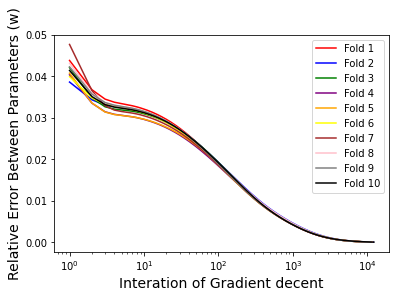

-------- Now testing learing rate is 0.5--------
No.1 fold start
interations  18585
No.2 fold start
interations  19434
No.3 fold start
interations  18195
No.4 fold start
interations  18501
No.5 fold start
interations  19056
No.6 fold start
interations  18774
No.7 fold start
interations  18476
No.8 fold start
interations  18688
No.9 fold start
interations  17980
No.10 fold start
interations  19797
Average Accuracy --> 0.7305817610062892


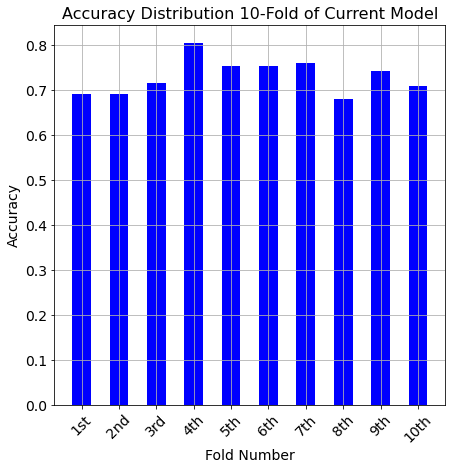

<Figure size 504x504 with 0 Axes>

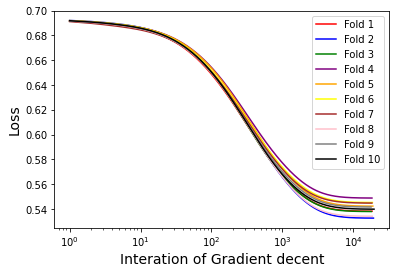

<Figure size 504x504 with 0 Axes>

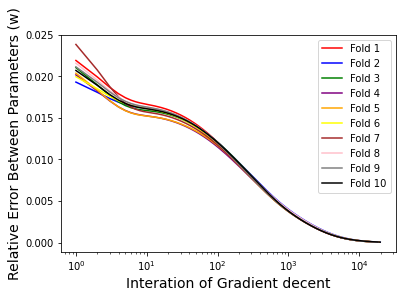

-------- Now testing learing rate is 0.1--------
No.1 fold start
interations  45425
No.2 fold start
interations  48259
No.3 fold start
interations  44744
No.4 fold start
interations  45412
No.5 fold start
interations  47000
No.6 fold start
interations  46218
No.7 fold start
interations  45323
No.8 fold start
interations  45990
No.9 fold start
interations  45037
No.10 fold start
interations  47139
Average Accuracy --> 0.7305480682839173


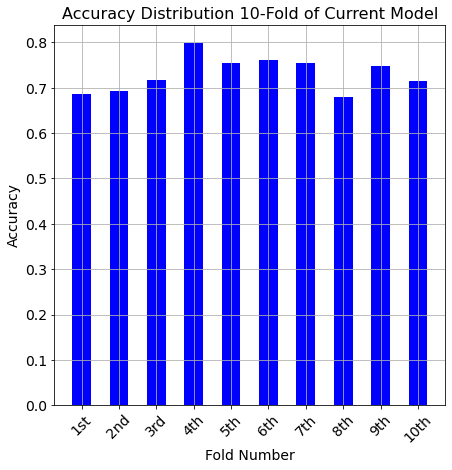

<Figure size 504x504 with 0 Axes>

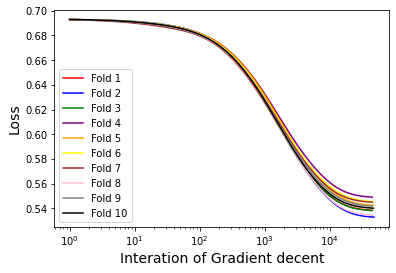

<Figure size 504x504 with 0 Axes>

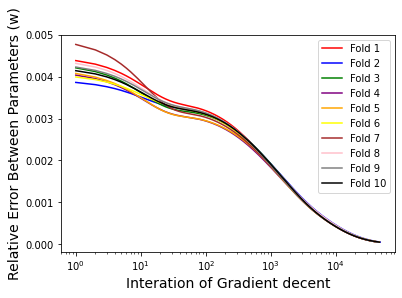

-------- Now testing learing rate is 0.05--------
No.1 fold start
interations  61106
No.2 fold start
interations  65408
No.3 fold start
interations  61076
No.4 fold start
interations  61348
No.5 fold start
interations  62983
No.6 fold start
interations  62128
No.7 fold start
interations  60416
No.8 fold start
interations  62956
No.9 fold start
interations  61387
No.10 fold start
interations  61626
Average Accuracy --> 0.7306154537286613


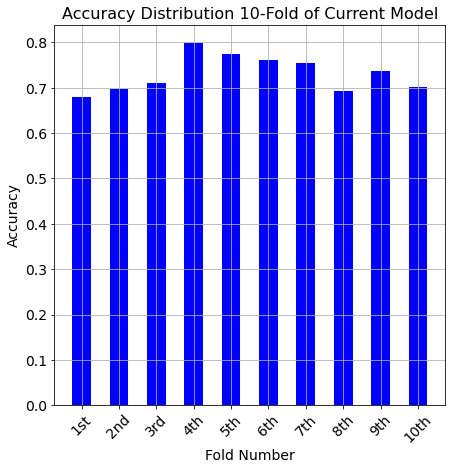

<Figure size 504x504 with 0 Axes>

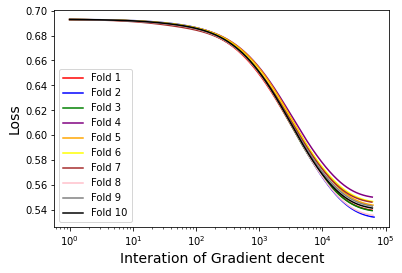

<Figure size 504x504 with 0 Axes>

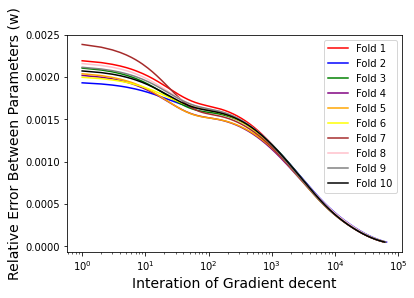

-------- Now testing learing rate is 0.01--------
No.1 fold start
interations  80978
No.2 fold start
interations  86611
No.3 fold start
interations  80788
No.4 fold start
interations  80014
No.5 fold start
interations  82904
No.6 fold start
interations  79553
No.7 fold start
interations  78705
No.8 fold start
interations  85428
No.9 fold start
interations  79977
No.10 fold start
interations  79481
Average Accuracy --> 0.7080750224618149


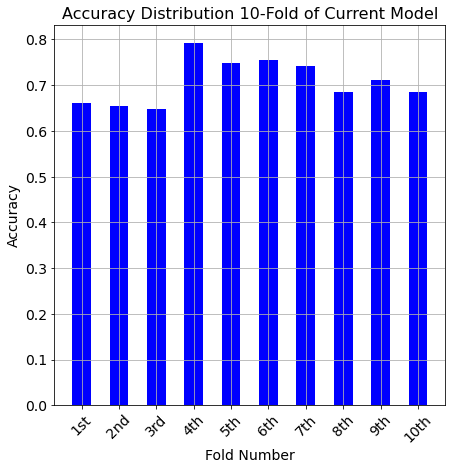

<Figure size 504x504 with 0 Axes>

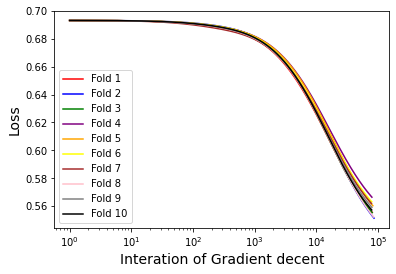

<Figure size 504x504 with 0 Axes>

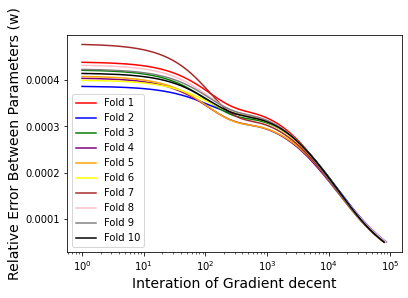

-------- Now testing learing rate is 0.005--------
No.1 fold start
interations  63471
No.2 fold start
interations  66606
No.3 fold start
interations  63626
No.4 fold start
interations  61056
No.5 fold start
interations  64055
No.6 fold start
interations  60928
No.7 fold start
interations  61269
No.8 fold start
interations  65481
No.9 fold start
interations  61882
No.10 fold start
interations  63522
Average Accuracy --> 0.6849730458221023


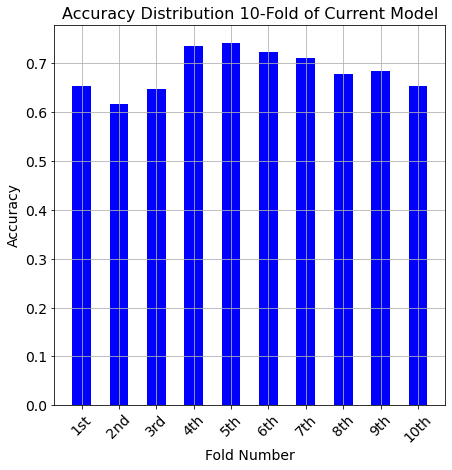

<Figure size 504x504 with 0 Axes>

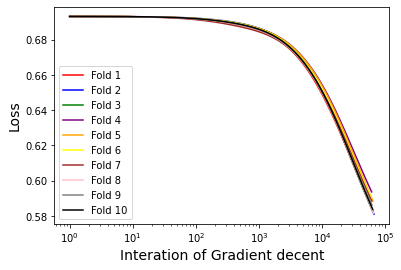

<Figure size 504x504 with 0 Axes>

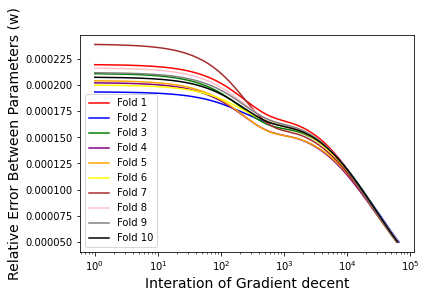

In [ ]:
## Running for the raw data
print('-------- Raw Data Test Start --------')
# create list to save data
raw_order1_accur=[]
raw_order1_iteration=[]
# Load data again
wine_df = pd.read_csv('White_wine Quality.csv')
X_wine = wine_df[['Alcohol','Malic acid', 'Ash', 'Alkalinity of ash', 'Magnesium', 'Total phenols', 'Flavanoids', 'Nonflavanoid phenols', 'Proanthocyanins', 'Hue']].to_numpy()
y_wine = wine_df['quality label'].to_numpy()
# shuffling data
X_wine, y_wine = shuffle(X_wine,y_wine)
# Test in linear order 1
X_wine = changeModelOrder(1, X_wine)
## testing 7 different learning rates
learn_test = learn_para
#--- setting decay rate 0.000001 ---
#--- when iterations up to 10^6, the learning rate will be 1/2*learning rate, and up to 10^7 for ~1/10*learning rate --- 
for learn in learn_test:
  print('-------- Now testing learing rate is ' + str(learn) + '--------')
  all_acu, all_err, all_losses, all_interation = validation(k = 10,X = X_wine,y = y_wine, stop_threshold = 0.00005, learning_rate=learn, decay_rate = 0.000001)
  plot_results(all_acu, all_err, all_losses, all_interation)
  raw_order1_accur.append(sum(all_acu)/10)
  raw_order1_iteration.append(sum(all_interation)/10)

In [ ]:
learn_para = [1, 0.75, 0.5, 0.25, 0.1, 0.05, 0.025]     # new learn because 4 is too high costs overfitting and <0 .01 seems to low becasue loss function not yet converge

Testing 1. Raw data

-------- Raw Data Test Start --------
The order of the linear model didn't change: 1
The shape of X ---> 1599x10
-------- Now testing learing rate is 1--------
No.1 fold start
interations  11812
No.2 fold start
interations  11747
No.3 fold start
interations  12180
No.4 fold start
interations  11608
No.5 fold start
interations  11710
No.6 fold start
interations  11287
No.7 fold start
interations  11521
No.8 fold start
interations  11934
No.9 fold start
interations  11242
No.10 fold start
interations  11229
Average Accuracy --> 0.7308400718778078


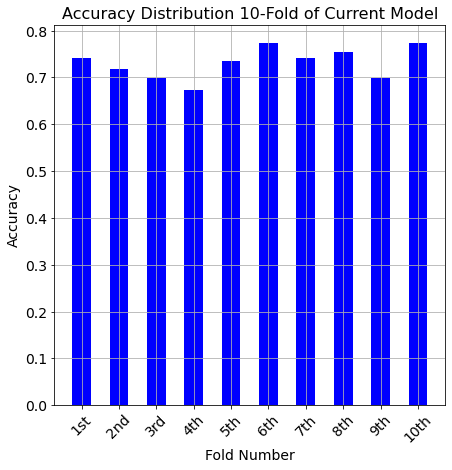

<Figure size 504x504 with 0 Axes>

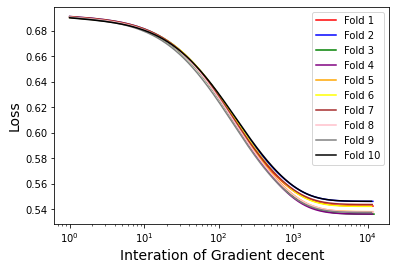

<Figure size 504x504 with 0 Axes>

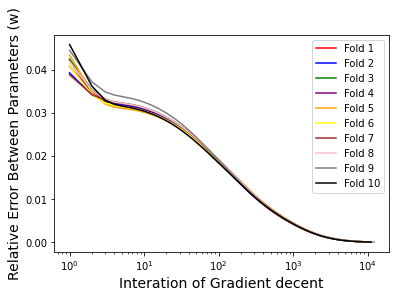

-------- Now testing learing rate is 0.75--------
No.1 fold start
interations  14481
No.2 fold start
interations  14363
No.3 fold start
interations  14979
No.4 fold start
interations  14232
No.5 fold start
interations  14352
No.6 fold start
interations  13823
No.7 fold start
interations  14113
No.8 fold start
interations  14672
No.9 fold start
interations  13746
No.10 fold start
interations  13751
Average Accuracy --> 0.7308400718778078


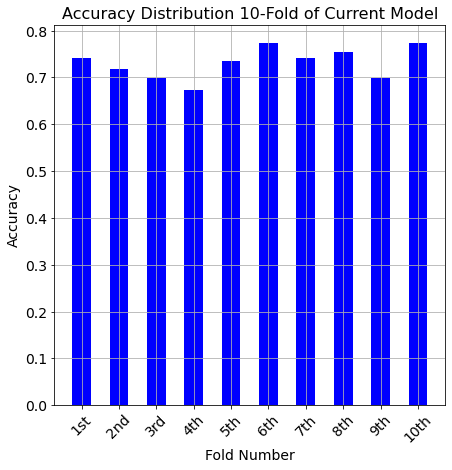

<Figure size 504x504 with 0 Axes>

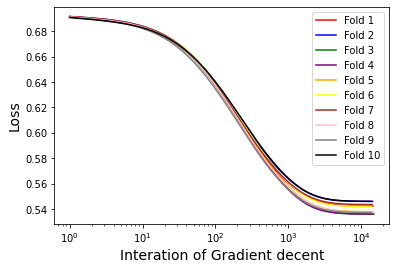

<Figure size 504x504 with 0 Axes>

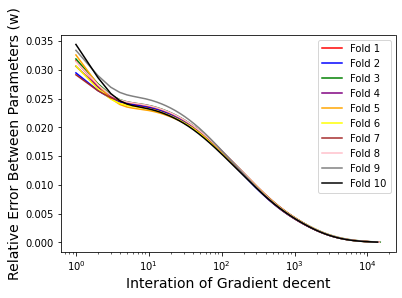

-------- Now testing learing rate is 0.5--------
No.1 fold start
interations  19048
No.2 fold start
interations  18807
No.3 fold start
interations  19805
No.4 fold start
interations  18726
No.5 fold start
interations  18874
No.6 fold start
interations  18159
No.7 fold start
interations  18542
No.8 fold start
interations  19393
No.9 fold start
interations  18012
No.10 fold start
interations  18062
Average Accuracy --> 0.7314690026954178


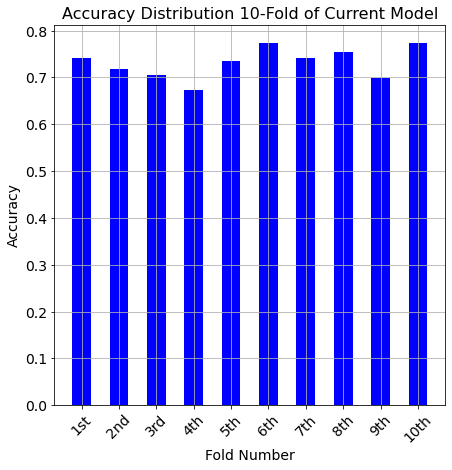

<Figure size 504x504 with 0 Axes>

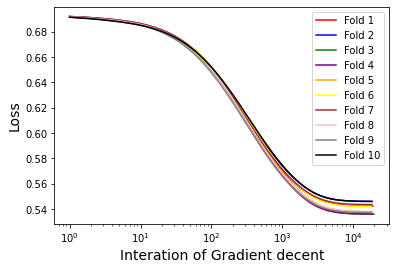

<Figure size 504x504 with 0 Axes>

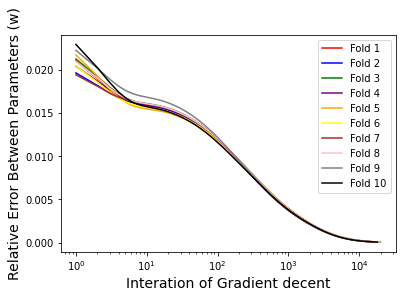

-------- Now testing learing rate is 0.25--------
No.1 fold start
interations  29108
No.2 fold start
interations  28494
No.3 fold start
interations  30603
No.4 fold start
interations  28654
No.5 fold start
interations  28879
No.6 fold start
interations  27783
No.7 fold start
interations  28304
No.8 fold start
interations  29957
No.9 fold start
interations  27430
No.10 fold start
interations  27633
Average Accuracy --> 0.7320642407906559


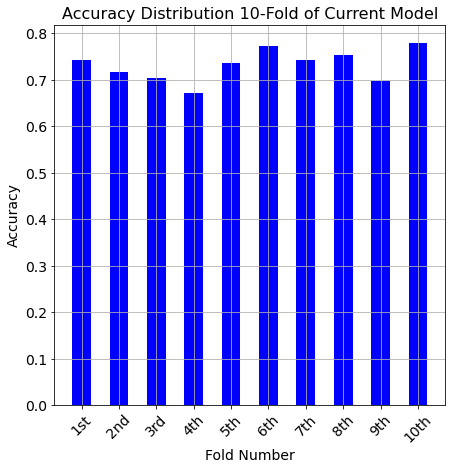

<Figure size 504x504 with 0 Axes>

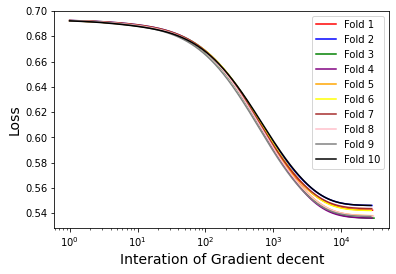

<Figure size 504x504 with 0 Axes>

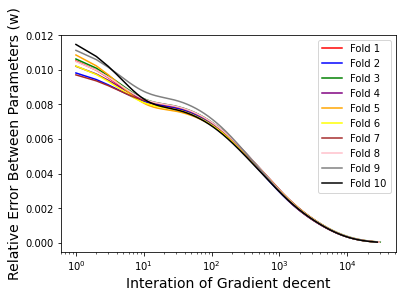

-------- Now testing learing rate is 0.1--------
No.1 fold start
interations  46248
No.2 fold start
interations  45243
No.3 fold start
interations  49075
No.4 fold start
interations  45819
No.5 fold start
interations  46454
No.6 fold start
interations  45008
No.7 fold start
interations  45233
No.8 fold start
interations  48112
No.9 fold start
interations  44365
No.10 fold start
interations  44760
Average Accuracy --> 0.7339510332434861


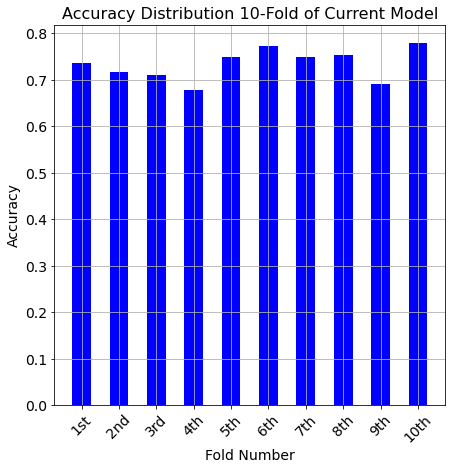

<Figure size 504x504 with 0 Axes>

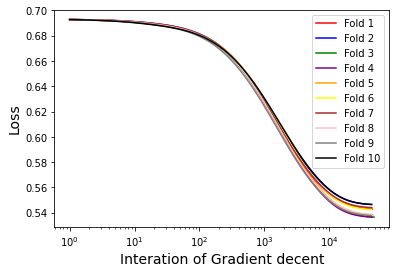

<Figure size 504x504 with 0 Axes>

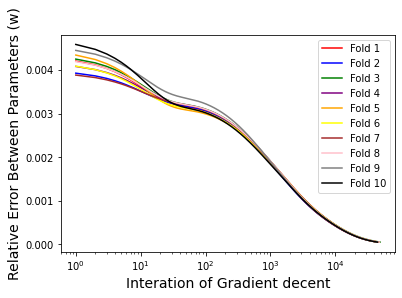

-------- Now testing learing rate is 0.05--------
No.1 fold start
interations  61716
No.2 fold start
interations  61011
No.3 fold start
interations  65206
No.4 fold start
interations  61816
No.5 fold start
interations  62980
No.6 fold start
interations  61381
No.7 fold start
interations  60887
No.8 fold start
interations  64063
No.9 fold start
interations  60629
No.10 fold start
interations  60950
Average Accuracy --> 0.7270327942497754


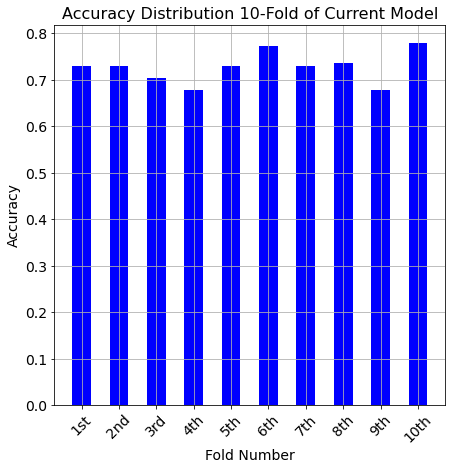

<Figure size 504x504 with 0 Axes>

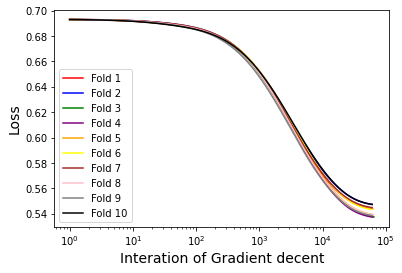

<Figure size 504x504 with 0 Axes>

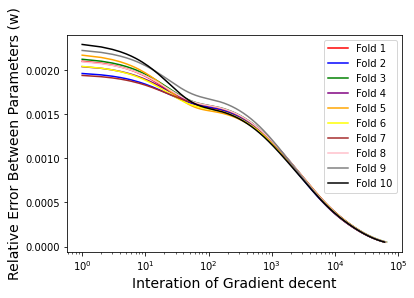

-------- Now testing learing rate is 0.025--------
No.1 fold start
interations  76430
No.2 fold start
interations  76299
No.3 fold start
interations  80463
No.4 fold start
interations  77965
No.5 fold start
interations  79174
No.6 fold start
interations  77439
No.7 fold start
interations  75950
No.8 fold start
interations  79132
No.9 fold start
interations  76534
No.10 fold start
interations  76613
Average Accuracy --> 0.723854447439353


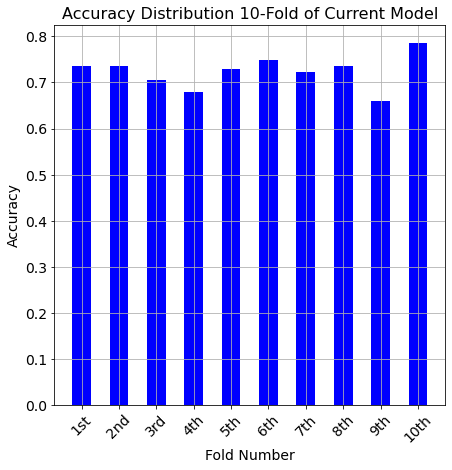

<Figure size 504x504 with 0 Axes>

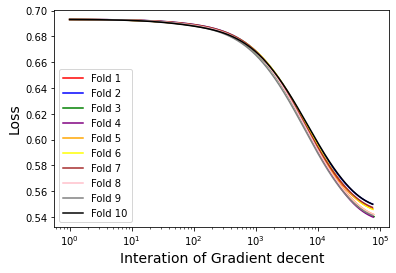

<Figure size 504x504 with 0 Axes>

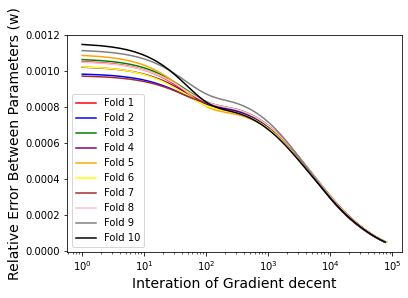

In [ ]:
## Running for the raw data
print('-------- Raw Data Test Start --------')
# create list to save data
raw_order1_accur=[]
raw_order1_iteration=[]
# Load data again
wine_df = pd.read_csv('White_wine Quality.csv')
X_wine = wine_df[['Alcohol','Malic acid', 'Ash', 'Alkalinity of ash', 'Magnesium', 'Total phenols', 'Flavanoids', 'Nonflavanoid phenols', 'Proanthocyanins', 'Hue']].to_numpy()
y_wine = wine_df['quality label'].to_numpy()
# shuffling data
X_wine, y_wine = shuffle(X_wine,y_wine)
# Test in linear order 1
X_wine = changeModelOrder(1, X_wine)
## testing 7 different learning rates
learn_test = learn_para
#--- setting decay rate 0.000001 ---
#--- when iterations up to 10^6, the learning rate will be 1/2*learning rate, and up to 10^7 for ~1/10*learning rate --- 
for learn in learn_test:
  print('-------- Now testing learing rate is ' + str(learn) + '--------')
  all_acu, all_err, all_losses, all_interation = validation(k = 10,X = X_wine,y = y_wine, stop_threshold = 0.00005, learning_rate=learn, decay_rate = 0.000001)
  plot_results(all_acu, all_err, all_losses, all_interation)
  raw_order1_accur.append(sum(all_acu)/10)
  raw_order1_iteration.append(sum(all_interation)/10)

Test 2. Standardization features

-------- Standardization Data Test Start --------
The order of the linear model didn't change: 1
The shape of X ---> 1599x10
-------- Now testing learing rate is 1--------
No.1 fold start
interations  6887
No.2 fold start
interations  7049
No.3 fold start
interations  7089
No.4 fold start
interations  7092
No.5 fold start
interations  6854
No.6 fold start
interations  7176
No.7 fold start
interations  7103
No.8 fold start
interations  7115
No.9 fold start
interations  7299
No.10 fold start
interations  7316
Average Accuracy --> 0.7291217430368373


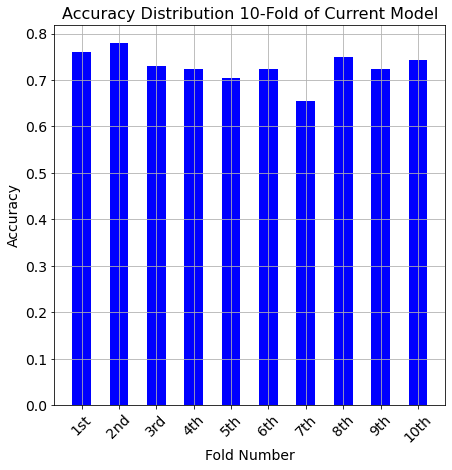

<Figure size 504x504 with 0 Axes>

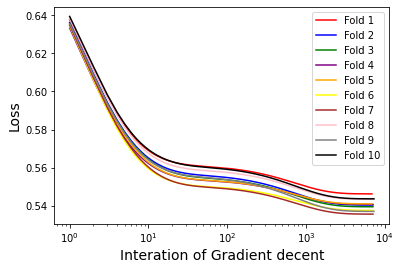

<Figure size 504x504 with 0 Axes>

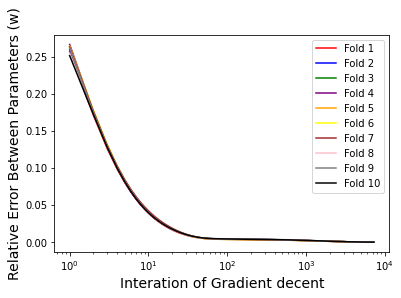

-------- Now testing learing rate is 0.75--------
No.1 fold start
interations  8574
No.2 fold start
interations  8778
No.3 fold start
interations  8826
No.4 fold start
interations  8817
No.5 fold start
interations  8524
No.6 fold start
interations  8920
No.7 fold start
interations  8841
No.8 fold start
interations  8858
No.9 fold start
interations  9097
No.10 fold start
interations  9112
Average Accuracy --> 0.7291217430368373


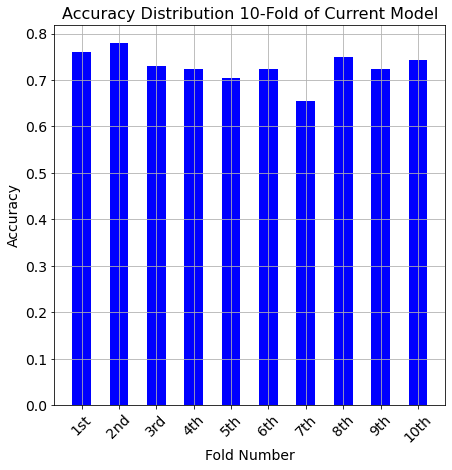

<Figure size 504x504 with 0 Axes>

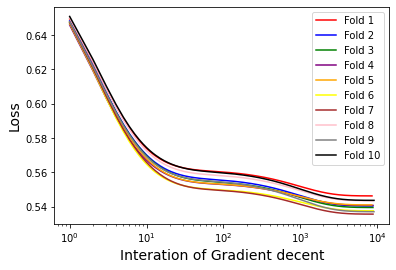

<Figure size 504x504 with 0 Axes>

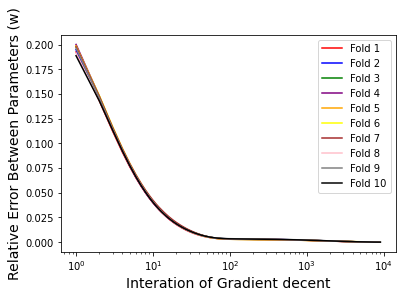

-------- Now testing learing rate is 0.5--------
No.1 fold start
interations  11575
No.2 fold start
interations  11855
No.3 fold start
interations  11916
No.4 fold start
interations  11875
No.5 fold start
interations  11484
No.6 fold start
interations  12012
No.7 fold start
interations  11930
No.8 fold start
interations  11958
No.9 fold start
interations  12301
No.10 fold start
interations  12310
Average Accuracy --> 0.7291217430368373


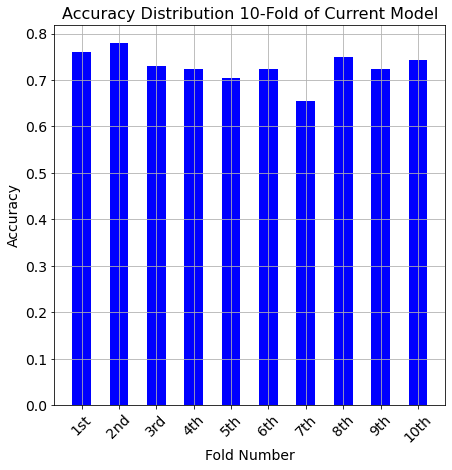

<Figure size 504x504 with 0 Axes>

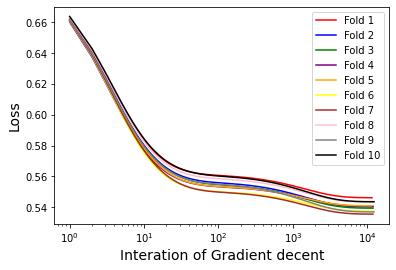

<Figure size 504x504 with 0 Axes>

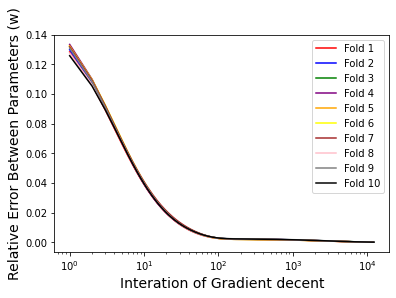

-------- Now testing learing rate is 0.25--------
No.1 fold start
interations  18754
No.2 fold start
interations  19230
No.3 fold start
interations  19311
No.4 fold start
interations  19129
No.5 fold start
interations  18521
No.6 fold start
interations  19345
No.7 fold start
interations  19307
No.8 fold start
interations  19375
No.9 fold start
interations  20012
No.10 fold start
interations  19978
Average Accuracy --> 0.7297506738544474


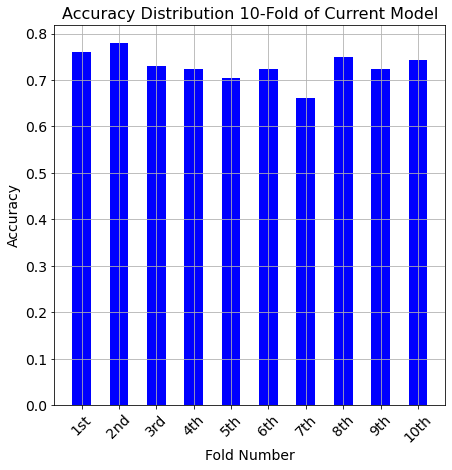

<Figure size 504x504 with 0 Axes>

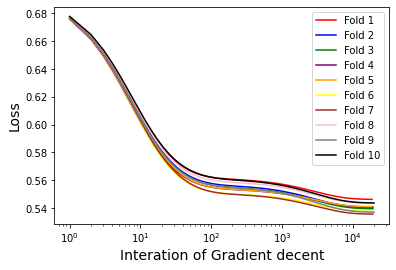

<Figure size 504x504 with 0 Axes>

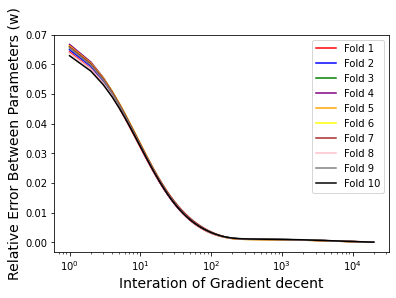

-------- Now testing learing rate is 0.1--------
No.1 fold start
interations  32374
No.2 fold start
interations  33295
No.3 fold start
interations  33361
No.4 fold start
interations  32569
No.5 fold start
interations  31619
No.6 fold start
interations  32907
No.7 fold start
interations  33229
No.8 fold start
interations  33449
No.9 fold start
interations  34896
No.10 fold start
interations  34635
Average Accuracy --> 0.7272012578616353


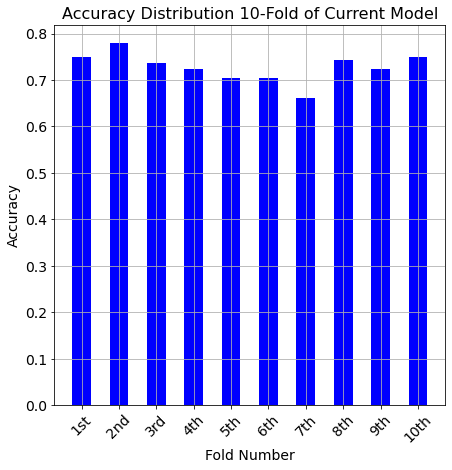

<Figure size 504x504 with 0 Axes>

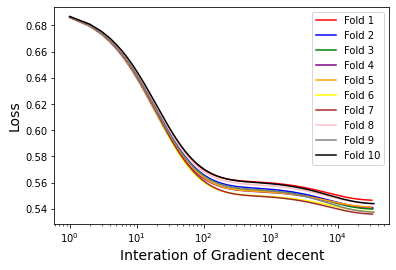

<Figure size 504x504 with 0 Axes>

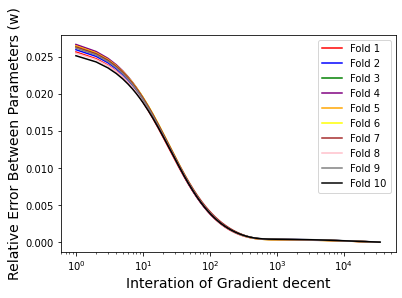

-------- Now testing learing rate is 0.05--------
No.1 fold start
interations  42961
No.2 fold start
interations  44419
No.3 fold start
interations  44346
No.4 fold start
interations  42233
No.5 fold start
interations  41191
No.6 fold start
interations  42592
No.7 fold start
interations  43855
No.8 fold start
interations  44404
No.9 fold start
interations  47108
No.10 fold start
interations  46314
Average Accuracy --> 0.7253144654088051


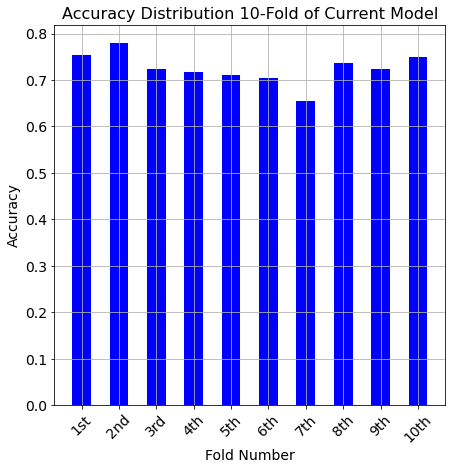

<Figure size 504x504 with 0 Axes>

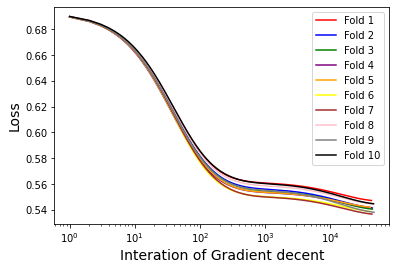

<Figure size 504x504 with 0 Axes>

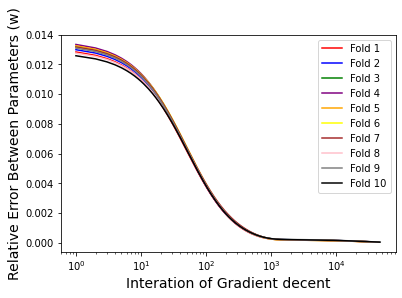

-------- Now testing learing rate is 0.025--------
No.1 fold start
interations  43585
No.2 fold start
interations  45820
No.3 fold start
interations  45286
No.4 fold start
interations  40060
No.5 fold start
interations  39592
No.6 fold start
interations  40124
No.7 fold start
interations  43711
No.8 fold start
interations  45163
No.9 fold start
interations  50219
No.10 fold start
interations  48158
Average Accuracy --> 0.7208782569631627


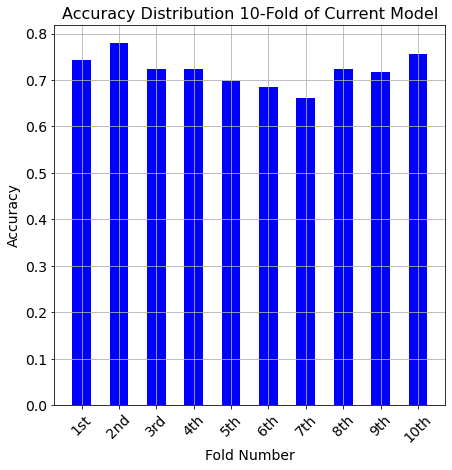

<Figure size 504x504 with 0 Axes>

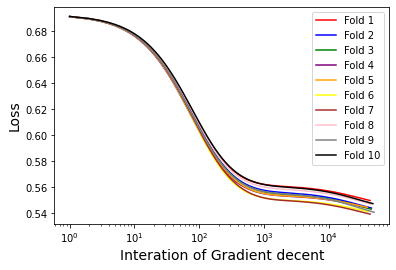

<Figure size 504x504 with 0 Axes>

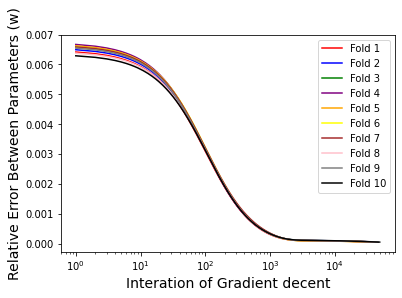

In [ ]:
## Running for the Standardization data
print('-------- Standardization Data Test Start --------')
# create list to save data
std_order1_accur=[]
std_order1_iteration=[]
# Load data again
wine_df = pd.read_csv('White_wine Quality.csv')
X_wine = wine_df[['Alcohol','Malic acid', 'Ash', 'Alkalinity of ash', 'Magnesium', 'Total phenols', 'Flavanoids', 'Nonflavanoid phenols', 'Proanthocyanins', 'Hue']].to_numpy()
y_wine = wine_df['quality label'].to_numpy()
# shuffling data
X_wine, y_wine = shuffle(X_wine,y_wine)
# Test in linear order 1
X_wine = featureStandardization(X_wine)
X_wine = changeModelOrder(1, X_wine)
## testing 7 different learning rates
learn_test = learn_para
#--- setting decay rate 0.000001 ---
#--- when iterations up to 10^6, the learning rate will be 1/2*learning rate, and up to 10^7 for ~1/10*learning rate --- 
for learn in learn_test:
  print('-------- Now testing learing rate is ' + str(learn) + '--------')
  all_acu, all_err, all_losses, all_interation = validation(k = 10,X = X_wine,y = y_wine, stop_threshold = 0.00005, learning_rate=learn, decay_rate = 0.000001)
  plot_results(all_acu, all_err, all_losses, all_interation)
  std_order1_accur.append(sum(all_acu)/10)
  std_order1_iteration.append(sum(all_interation)/10)

Test 3. Remove outliers

-------- Remove Outliers Data Test Start --------
The order of the linear model didn't change: 1
The shape of X ---> 1463x10
-------- Now testing learing rate is 1--------
No.1 fold start
interations  12290
No.2 fold start
interations  14801
No.3 fold start
interations  12772
No.4 fold start
interations  14734
No.5 fold start
interations  11431
No.6 fold start
interations  12600
No.7 fold start
interations  13179
No.8 fold start
interations  12663
No.9 fold start
interations  15918
No.10 fold start
interations  11807
Average Accuracy --> 0.7272777420244554


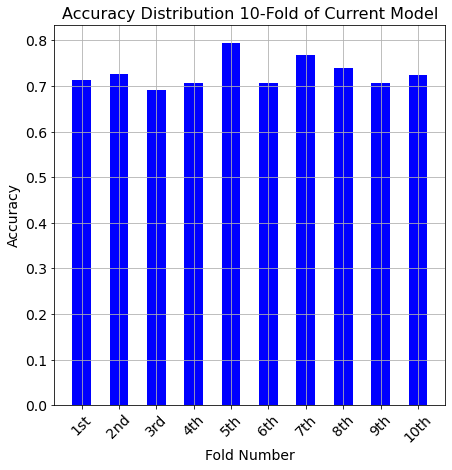

<Figure size 504x504 with 0 Axes>

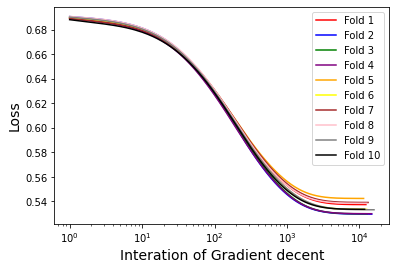

<Figure size 504x504 with 0 Axes>

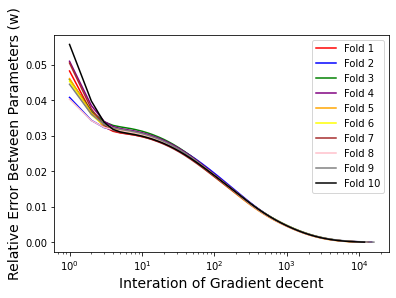

-------- Now testing learing rate is 0.75--------
No.1 fold start
interations  15082
No.2 fold start
interations  17742
No.3 fold start
interations  15629
No.4 fold start
interations  17665
No.5 fold start
interations  13882
No.6 fold start
interations  15445
No.7 fold start
interations  15916
No.8 fold start
interations  15350
No.9 fold start
interations  19220
No.10 fold start
interations  14516
Average Accuracy --> 0.7279626735313047


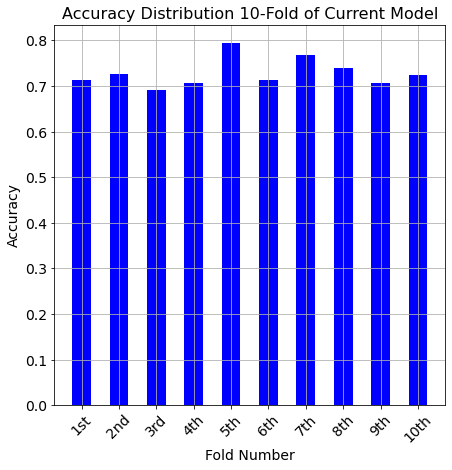

<Figure size 504x504 with 0 Axes>

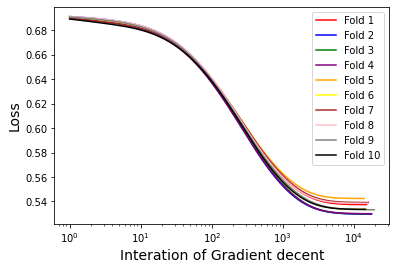

<Figure size 504x504 with 0 Axes>

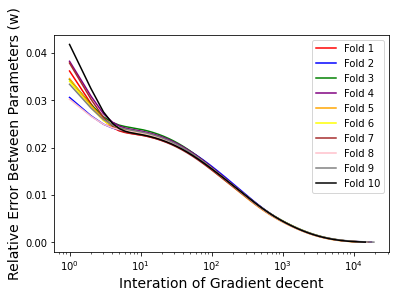

-------- Now testing learing rate is 0.5--------
No.1 fold start
interations  19966
No.2 fold start
interations  22718
No.3 fold start
interations  20617
No.4 fold start
interations  22548
No.5 fold start
interations  18146
No.6 fold start
interations  20410
No.7 fold start
interations  20617
No.8 fold start
interations  19997
No.9 fold start
interations  24734
No.10 fold start
interations  19238
Average Accuracy --> 0.7279626735313047


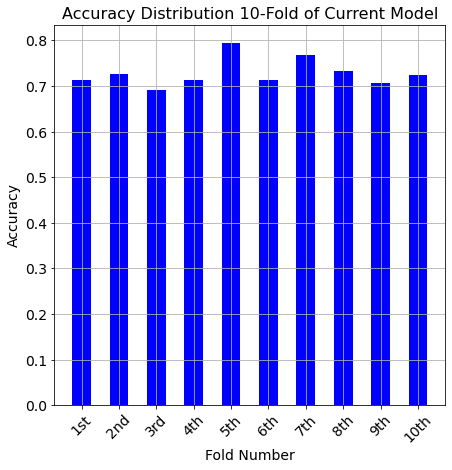

<Figure size 504x504 with 0 Axes>

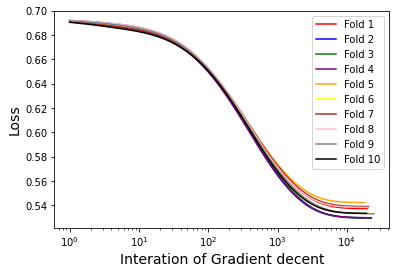

<Figure size 504x504 with 0 Axes>

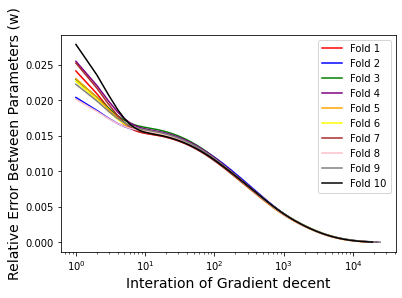

-------- Now testing learing rate is 0.25--------
No.1 fold start
interations  31296
No.2 fold start
interations  33841
No.3 fold start
interations  32160
No.4 fold start
interations  33227
No.5 fold start
interations  28067
No.6 fold start
interations  31894
No.7 fold start
interations  31354
No.8 fold start
interations  30638
No.9 fold start
interations  36619
No.10 fold start
interations  30148
Average Accuracy --> 0.7272777420244554


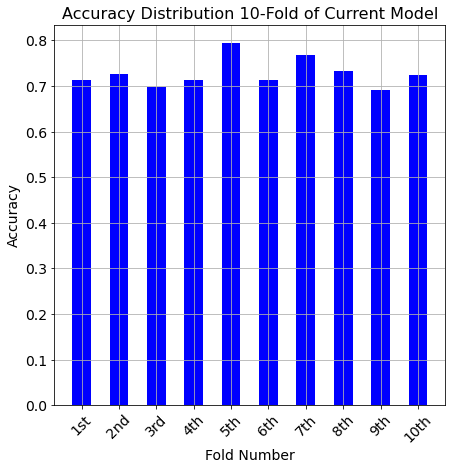

<Figure size 504x504 with 0 Axes>

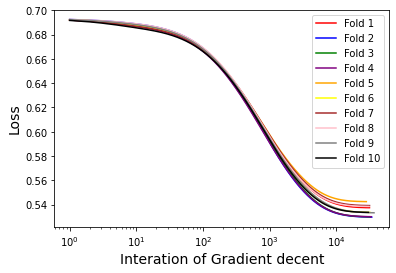

<Figure size 504x504 with 0 Axes>

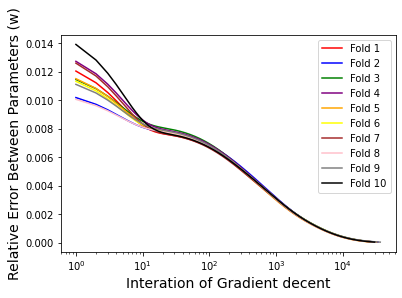

-------- Now testing learing rate is 0.1--------
No.1 fold start
interations  52081
No.2 fold start
interations  53478
No.3 fold start
interations  53268
No.4 fold start
interations  52377
No.5 fold start
interations  47058
No.6 fold start
interations  52884
No.7 fold start
interations  51097
No.8 fold start
interations  50016
No.9 fold start
interations  56721
No.10 fold start
interations  50313
Average Accuracy --> 0.7286476050381541


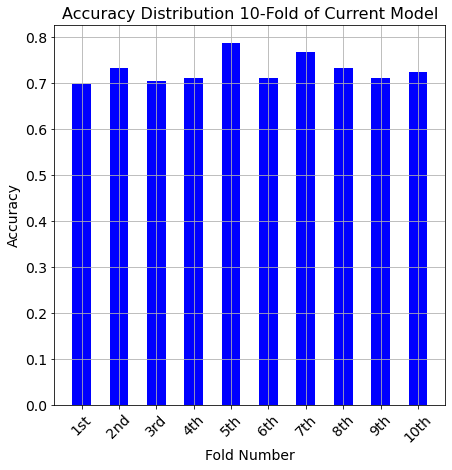

<Figure size 504x504 with 0 Axes>

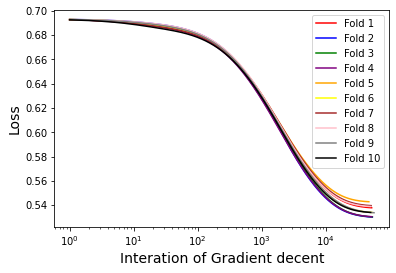

<Figure size 504x504 with 0 Axes>

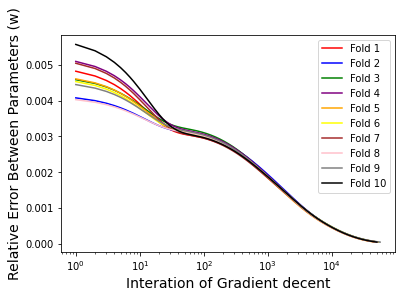

-------- Now testing learing rate is 0.05--------
No.1 fold start
interations  70068
No.2 fold start
interations  70313
No.3 fold start
interations  71611
No.4 fold start
interations  69774
No.5 fold start
interations  64952
No.6 fold start
interations  71154
No.7 fold start
interations  68726
No.8 fold start
interations  67210
No.9 fold start
interations  73686
No.10 fold start
interations  68384
Average Accuracy --> 0.7286476050381541


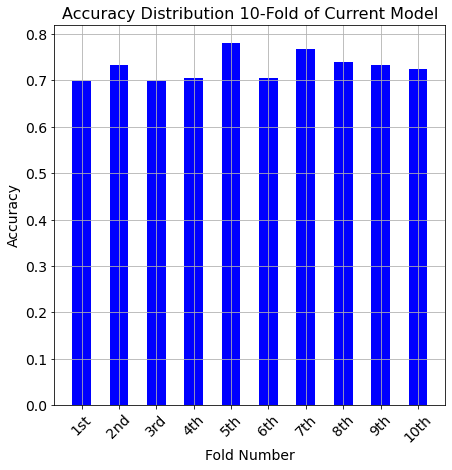

<Figure size 504x504 with 0 Axes>

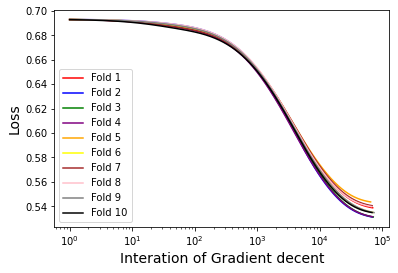

<Figure size 504x504 with 0 Axes>

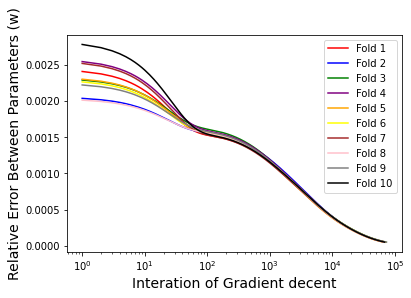

-------- Now testing learing rate is 0.025--------
No.1 fold start
interations  85063
No.2 fold start
interations  85101
No.3 fold start
interations  87383
No.4 fold start
interations  85475
No.5 fold start
interations  81314
No.6 fold start
interations  86847
No.7 fold start
interations  84156
No.8 fold start
interations  82591
No.9 fold start
interations  88000
No.10 fold start
interations  84322
Average Accuracy --> 0.7286338144709019


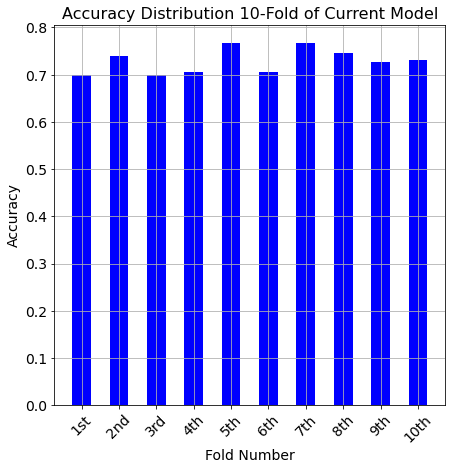

<Figure size 504x504 with 0 Axes>

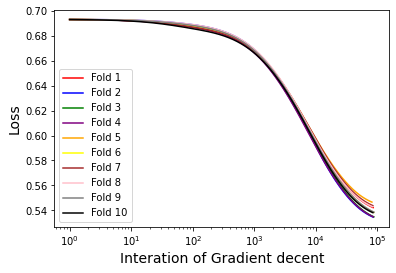

<Figure size 504x504 with 0 Axes>

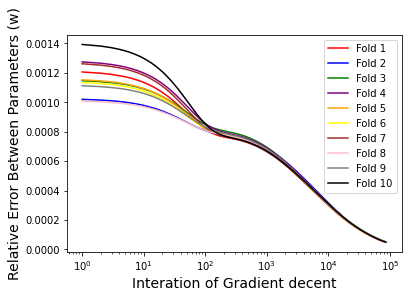

In [ ]:
## Running for the remove outlier data
print('-------- Remove Outliers Data Test Start --------')
# create list to save data
remove_order1_accur=[]
remove_order1_iteration=[]
# Load data again
wine_df = pd.read_csv('White_wine Quality.csv')
columns = ['Alcohol', 'Malic acid', 'Ash', 'Alkalinity of ash', 'Magnesium', 'Total phenols', 'Flavanoids', 'Nonflavanoid phenols', 'Proanthocyanins', 'Hue']
# remove outlier in features
outliers = detect_outliers(wine_df, columns)
outliers = list(set(outliers))
wine_df = wine_df.drop(outliers)
X_wine = wine_df[['Alcohol','Malic acid', 'Ash', 'Alkalinity of ash', 'Magnesium', 'Total phenols', 'Flavanoids', 'Nonflavanoid phenols', 'Proanthocyanins', 'Hue']].to_numpy()
y_wine = wine_df['quality label'].to_numpy()
# shuffling data
X_wine, y_wine = shuffle(X_wine,y_wine)
# Test in linear order 1
#X_wine = featureStandardization(X_wine)
X_wine = changeModelOrder(1, X_wine)
## testing 7 different learning rates
learn_test = learn_para 
#--- setting decay rate 0.000001 ---
#--- when iterations up to 10^6, the learning rate will be 1/2*learning rate, and up to 10^7 will be ~1/10*learning rate --- 
for learn in learn_test:
  print('-------- Now testing learing rate is ' + str(learn) + '--------')
  all_acu, all_err, all_losses, all_interation = validation(k = 10,X = X_wine,y = y_wine, stop_threshold = 0.00005, learning_rate=learn, decay_rate = 0.000001)
  plot_results(all_acu, all_err, all_losses, all_interation)
  remove_order1_accur.append(sum(all_acu)/10)
  remove_order1_iteration.append(sum(all_interation)/10)

Test 4. Removing the features have low correlation value between features and label

-------- Remove Data Test2 Start --------
The order of the linear model didn't change: 1
The shape of X ---> 1599x8
-------- Now testing learing rate is 1--------
No.1 fold start
interations  6304
No.2 fold start
interations  7093
No.3 fold start
interations  6566
No.4 fold start
interations  5956
No.5 fold start
interations  6999
No.6 fold start
interations  6543
No.7 fold start
interations  6702
No.8 fold start
interations  6744
No.9 fold start
interations  6181
No.10 fold start
interations  6511
Average Accuracy --> 0.7126684636118598


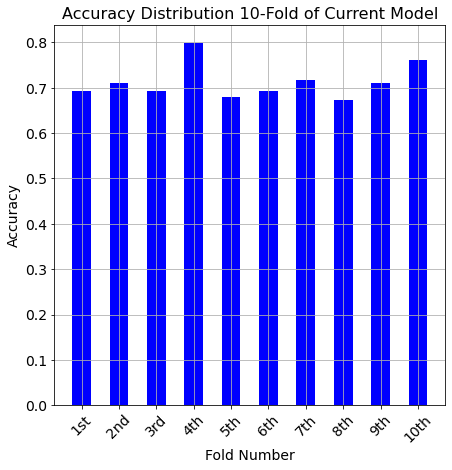

<Figure size 504x504 with 0 Axes>

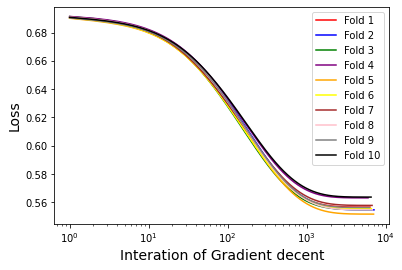

<Figure size 504x504 with 0 Axes>

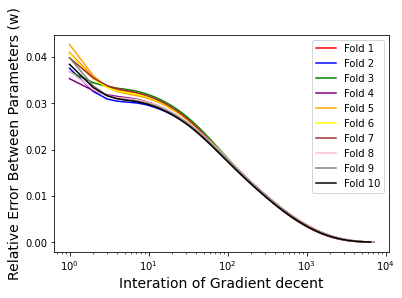

-------- Now testing learing rate is 0.75--------
No.1 fold start
interations  7807
No.2 fold start
interations  8806
No.3 fold start
interations  8141
No.4 fold start
interations  7410
No.5 fold start
interations  8687
No.6 fold start
interations  8114
No.7 fold start
interations  8311
No.8 fold start
interations  8373
No.9 fold start
interations  7677
No.10 fold start
interations  8085
Average Accuracy --> 0.7126684636118598


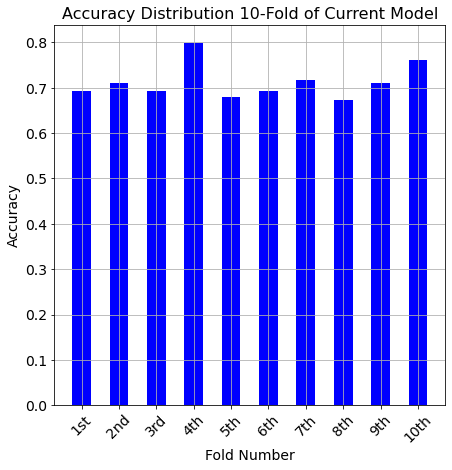

<Figure size 504x504 with 0 Axes>

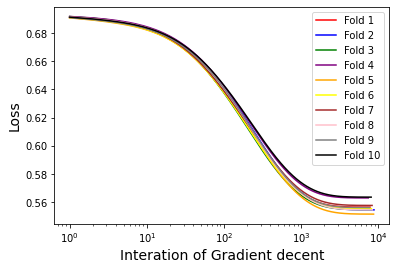

<Figure size 504x504 with 0 Axes>

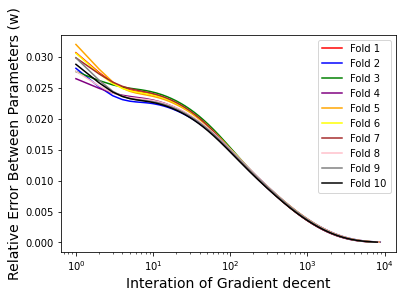

-------- Now testing learing rate is 0.5--------
No.1 fold start
interations  10482
No.2 fold start
interations  11852
No.3 fold start
interations  10936
No.4 fold start
interations  10015
No.5 fold start
interations  11689
No.6 fold start
interations  10911
No.7 fold start
interations  11167
No.8 fold start
interations  11273
No.9 fold start
interations  10356
No.10 fold start
interations  10887
Average Accuracy --> 0.7126684636118598


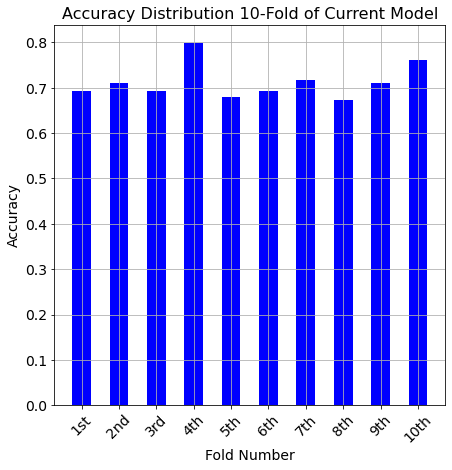

<Figure size 504x504 with 0 Axes>

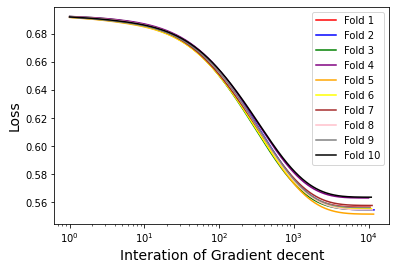

<Figure size 504x504 with 0 Axes>

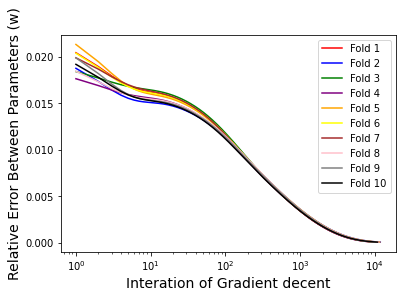

-------- Now testing learing rate is 0.25--------
No.1 fold start
interations  16979
No.2 fold start
interations  19205
No.3 fold start
interations  17670
No.4 fold start
interations  16400
No.5 fold start
interations  18938
No.6 fold start
interations  17693
No.7 fold start
interations  18053
No.8 fold start
interations  18307
No.9 fold start
interations  16929
No.10 fold start
interations  17675
Average Accuracy --> 0.7108153638814017


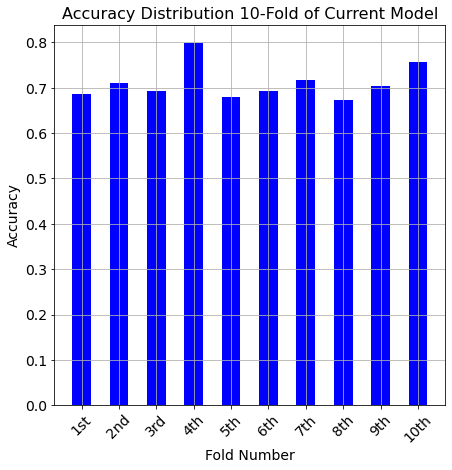

<Figure size 504x504 with 0 Axes>

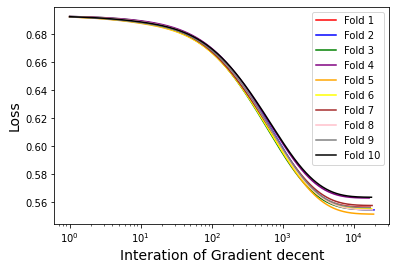

<Figure size 504x504 with 0 Axes>

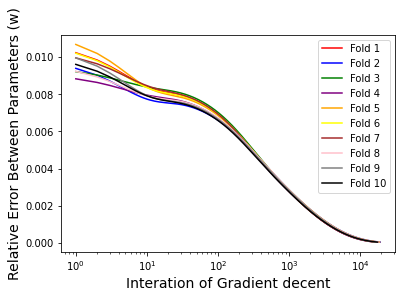

-------- Now testing learing rate is 0.1--------
No.1 fold start
interations  30393
No.2 fold start
interations  34119
No.3 fold start
interations  31336
No.4 fold start
interations  29720
No.5 fold start
interations  33666
No.6 fold start
interations  31622
No.7 fold start
interations  32033
No.8 fold start
interations  32734
No.9 fold start
interations  30730
No.10 fold start
interations  31526
Average Accuracy --> 0.7108490566037735


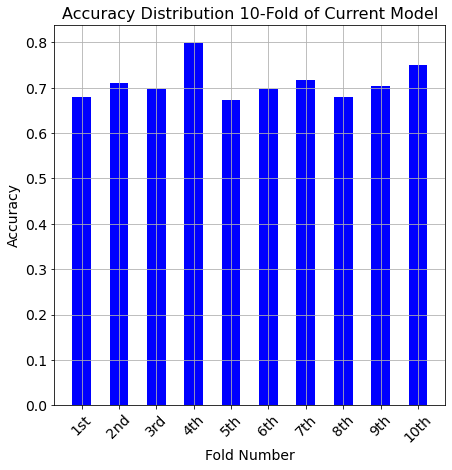

<Figure size 504x504 with 0 Axes>

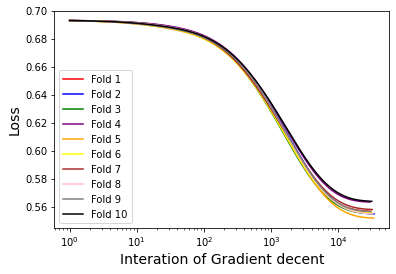

<Figure size 504x504 with 0 Axes>

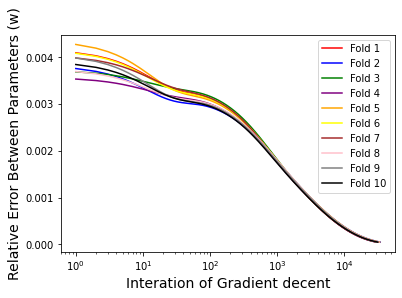

-------- Now testing learing rate is 0.05--------
No.1 fold start
interations  44311
No.2 fold start
interations  49211
No.3 fold start
interations  45273
No.4 fold start
interations  43659
No.5 fold start
interations  48645
No.6 fold start
interations  45960
No.7 fold start
interations  46271
No.8 fold start
interations  47539
No.9 fold start
interations  45324
No.10 fold start
interations  45651
Average Accuracy --> 0.7102201257861636


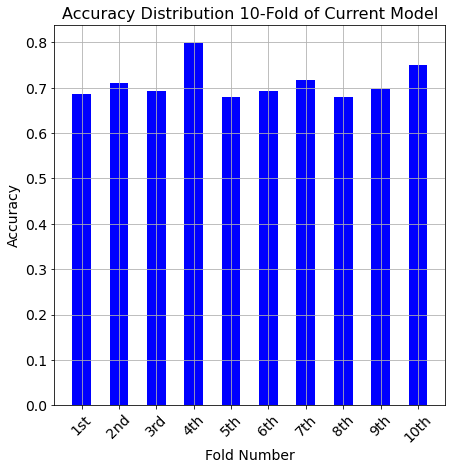

<Figure size 504x504 with 0 Axes>

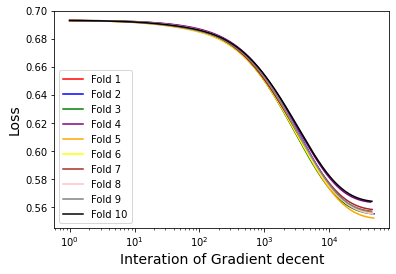

<Figure size 504x504 with 0 Axes>

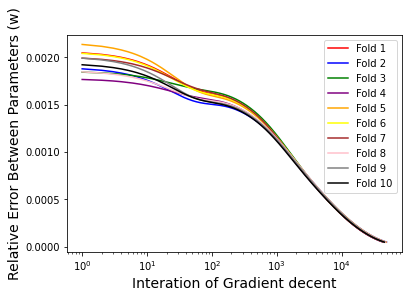

-------- Now testing learing rate is 0.025--------
No.1 fold start
interations  59065
No.2 fold start
interations  64762
No.3 fold start
interations  59895
No.4 fold start
interations  58628
No.5 fold start
interations  64271
No.6 fold start
interations  60996
No.7 fold start
interations  61166
No.8 fold start
interations  63016
No.9 fold start
interations  61184
No.10 fold start
interations  60357
Average Accuracy --> 0.7064128481581312


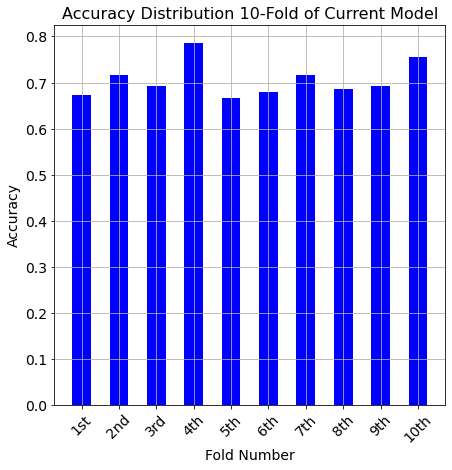

<Figure size 504x504 with 0 Axes>

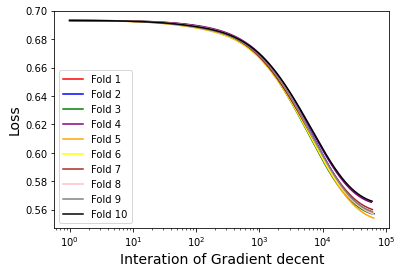

<Figure size 504x504 with 0 Axes>

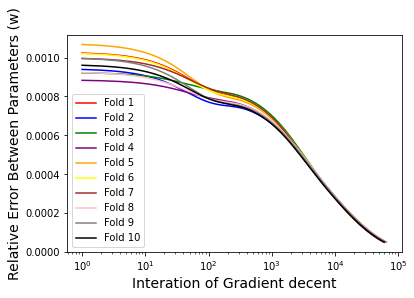

In [ ]:
## Running for removing low correlation value between features and label 
print('-------- Remove Data Test2 Start --------')
# create list to save data
remove2_order1_accur=[]
remove2_order1_iteration=[]
# Load data again
wine_df = pd.read_csv('White_wine Quality.csv')
# remove two features that have low correlation to quality label -----> Alkalinity of ash and 'Proanthocyanins'
X_wine = wine_df[['Alcohol','Malic acid', 'Ash', 'Magnesium', 'Total phenols', 'Flavanoids', 'Nonflavanoid phenols', 'Hue']].to_numpy()
y_wine = wine_df['quality label'].to_numpy()
# shuffling data
X_wine, y_wine = shuffle(X_wine,y_wine)
# Test in linear order 1
#X_wine = featureStandardization(X_wine)
X_wine = changeModelOrder(1, X_wine)
## testing 7 different learning rates
learn_test = learn_para
#--- setting decay rate 0.000001 ---
#--- when iterations up to 10^6, the learning rate will be 1/2*learning rate, and up to 10^7 will be ~1/10*learning rate --- 
for learn in learn_test:
  print('-------- Now testing learing rate is ' + str(learn) + '--------')
  all_acu, all_err, all_losses, all_interation = validation(k = 10,X = X_wine,y = y_wine, stop_threshold = 0.00005, learning_rate=learn, decay_rate = 0.000001)
  plot_results(all_acu, all_err, all_losses, all_interation)
  remove2_order1_accur.append(sum(all_acu)/10)
  remove2_order1_iteration.append(sum(all_interation)/10)

Test 5. Removing Alcohol feature(because have relatively high correlation to 3 other features, ~0.7)

-------- Remove Data Test3 Start --------
The order of the linear model didn't change: 1
The shape of X ---> 1599x9
-------- Now testing learing rate is 1--------
No.1 fold start
interations  7247
No.2 fold start
interations  7373
No.3 fold start
interations  7265
No.4 fold start
interations  7448
No.5 fold start
interations  7430
No.6 fold start
interations  7734
No.7 fold start
interations  7607
No.8 fold start
interations  7441
No.9 fold start
interations  7758
No.10 fold start
interations  7652
Average Accuracy --> 0.712084456424079


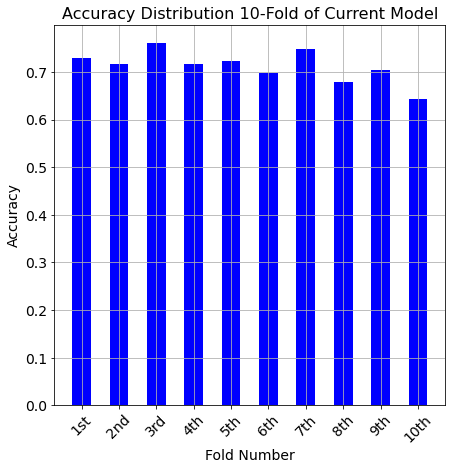

<Figure size 504x504 with 0 Axes>

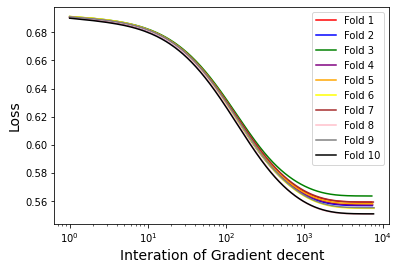

<Figure size 504x504 with 0 Axes>

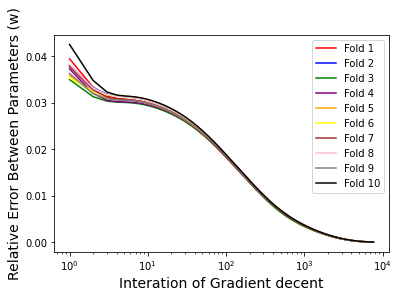

-------- Now testing learing rate is 0.75--------
No.1 fold start
interations  9047
No.2 fold start
interations  9198
No.3 fold start
interations  9062
No.4 fold start
interations  9295
No.5 fold start
interations  9270
No.6 fold start
interations  9652
No.7 fold start
interations  9489
No.8 fold start
interations  9295
No.9 fold start
interations  9679
No.10 fold start
interations  9551
Average Accuracy --> 0.712084456424079


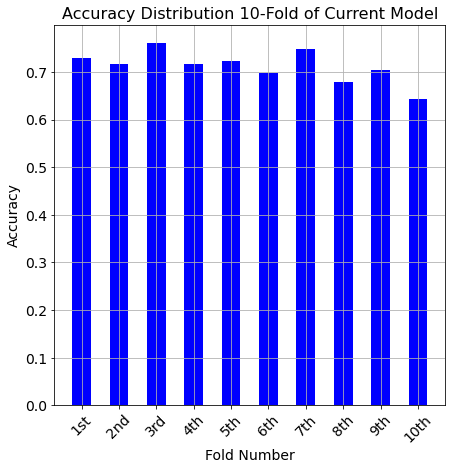

<Figure size 504x504 with 0 Axes>

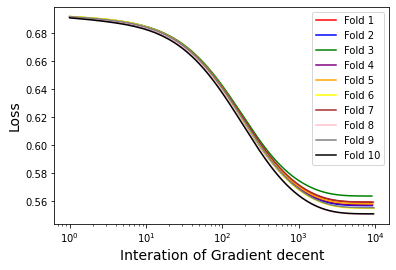

<Figure size 504x504 with 0 Axes>

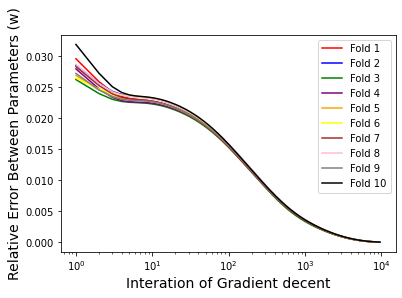

-------- Now testing learing rate is 0.5--------
No.1 fold start
interations  12271
No.2 fold start
interations  12463
No.3 fold start
interations  12276
No.4 fold start
interations  12602
No.5 fold start
interations  12562
No.6 fold start
interations  13087
No.7 fold start
interations  12853
No.8 fold start
interations  12620
No.9 fold start
interations  13115
No.10 fold start
interations  12953
Average Accuracy --> 0.7108265947888589


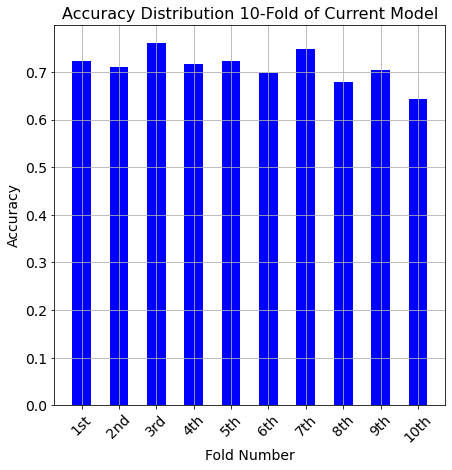

<Figure size 504x504 with 0 Axes>

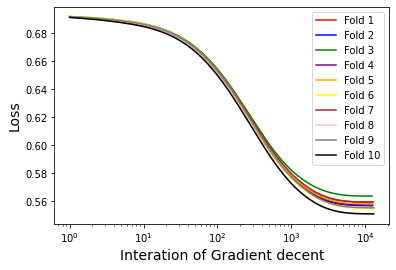

<Figure size 504x504 with 0 Axes>

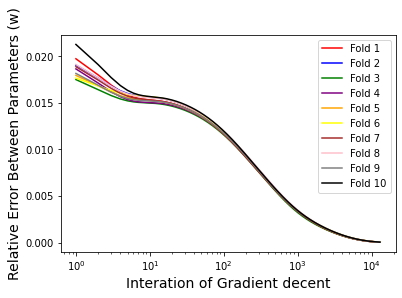

-------- Now testing learing rate is 0.25--------
No.1 fold start
interations  20125
No.2 fold start
interations  20396
No.3 fold start
interations  20084
No.4 fold start
interations  20653
No.5 fold start
interations  20558
No.6 fold start
interations  21444
No.7 fold start
interations  21019
No.8 fold start
interations  20746
No.9 fold start
interations  21467
No.10 fold start
interations  21235
Average Accuracy --> 0.7102313566936208


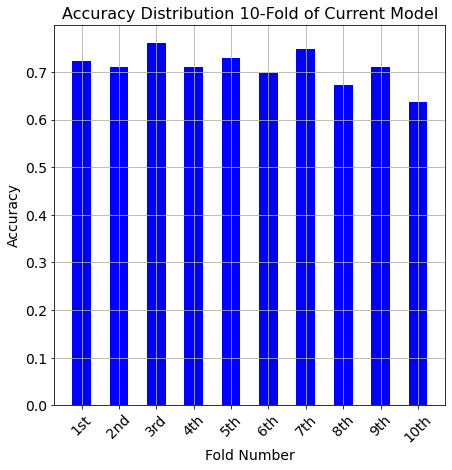

<Figure size 504x504 with 0 Axes>

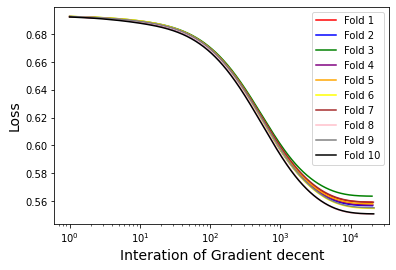

<Figure size 504x504 with 0 Axes>

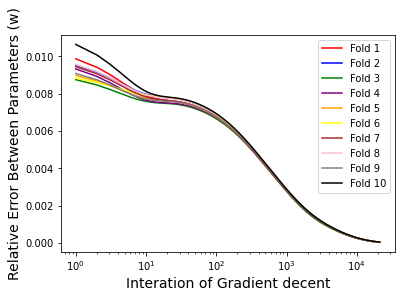

-------- Now testing learing rate is 0.1--------
No.1 fold start
interations  35952
No.2 fold start
interations  36317
No.3 fold start
interations  35733
No.4 fold start
interations  36876
No.5 fold start
interations  36585
No.6 fold start
interations  38250
No.7 fold start
interations  37343
No.8 fold start
interations  37263
No.9 fold start
interations  38232
No.10 fold start
interations  37912
Average Accuracy --> 0.7083445642407906


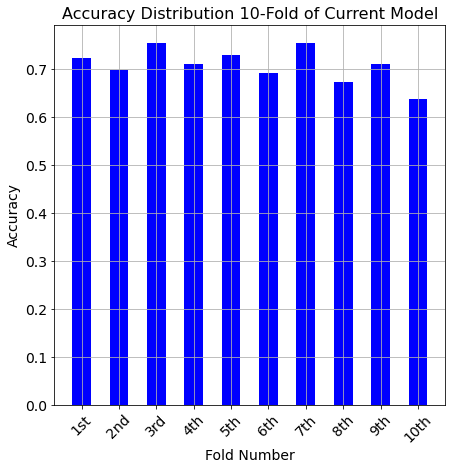

<Figure size 504x504 with 0 Axes>

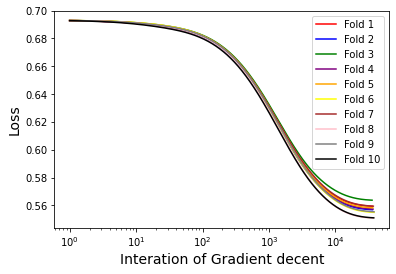

<Figure size 504x504 with 0 Axes>

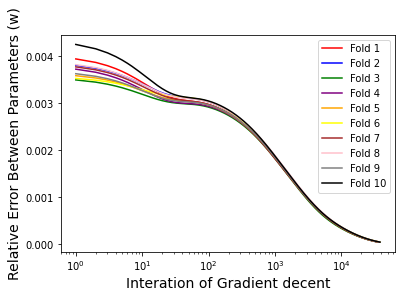

-------- Now testing learing rate is 0.05--------
No.1 fold start
interations  51052
No.2 fold start
interations  51464
No.3 fold start
interations  50550
No.4 fold start
interations  52419
No.5 fold start
interations  51815
No.6 fold start
interations  54221
No.7 fold start
interations  52702
No.8 fold start
interations  53286
No.9 fold start
interations  54184
No.10 fold start
interations  53810
Average Accuracy --> 0.7090071877807727


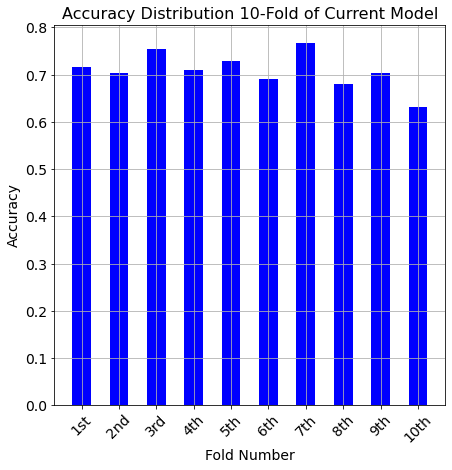

<Figure size 504x504 with 0 Axes>

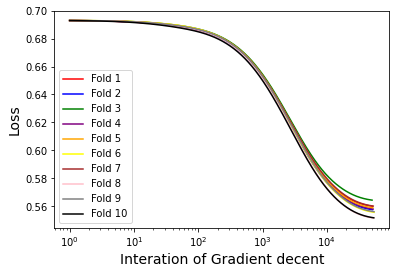

<Figure size 504x504 with 0 Axes>

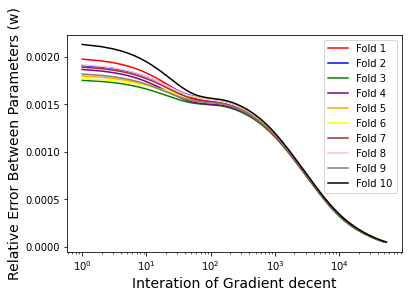

-------- Now testing learing rate is 0.025--------
No.1 fold start
interations  64185
No.2 fold start
interations  64722
No.3 fold start
interations  63079
No.4 fold start
interations  65934
No.5 fold start
interations  65224
No.6 fold start
interations  67913
No.7 fold start
interations  65714
No.8 fold start
interations  67642
No.9 fold start
interations  67999
No.10 fold start
interations  67619
Average Accuracy --> 0.7052336028751123


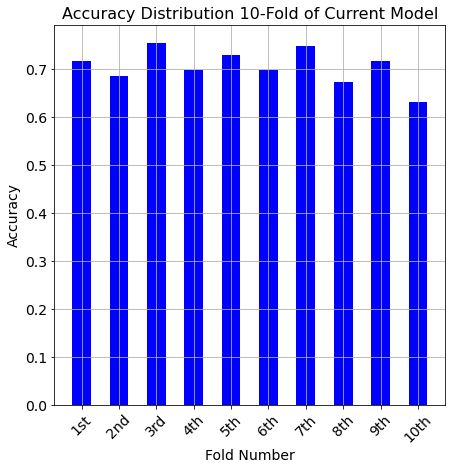

<Figure size 504x504 with 0 Axes>

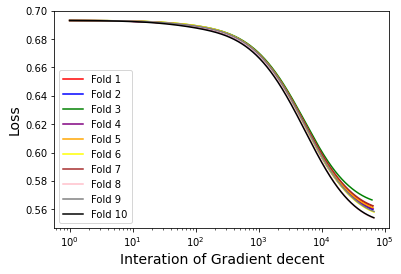

<Figure size 504x504 with 0 Axes>

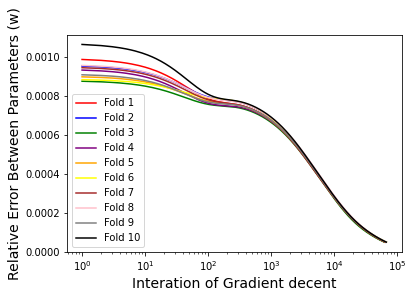

In [ ]:
## Running for Removing Alcohol feature
print('-------- Remove Data Test3 Start --------')
# create list to save data
remove3_order1_accur=[]
remove3_order1_iteration=[]
# Load data again
wine_df = pd.read_csv('White_wine Quality.csv')
# remove one feature that have relatively high correlation to 3 other features -----> Alcohol
X_wine = wine_df[['Malic acid', 'Ash', 'Alkalinity of ash', 'Magnesium', 'Total phenols', 'Flavanoids', 'Nonflavanoid phenols', 'Proanthocyanins', 'Hue']].to_numpy()
y_wine = wine_df['quality label'].to_numpy()
# shuffling data
X_wine, y_wine = shuffle(X_wine,y_wine)
# Test in linear order 1
#X_wine = featureStandardization(X_wine)
X_wine = changeModelOrder(1, X_wine)
## testing 7 different learning rates
learn_test = learn_para 
#--- setting decay rate 0.000001 ---
#--- when iterations up to 10^6, the learning rate will be 1/2*learning rate, and up to 10^7 will be ~1/10*learning rate --- 
for learn in learn_test:
  print('-------- Now testing learing rate is ' + str(learn) + '--------')
  all_acu, all_err, all_losses, all_interation = validation(k = 10,X = X_wine,y = y_wine, stop_threshold = 0.00005, learning_rate=learn, decay_rate = 0.000001)
  plot_results(all_acu, all_err, all_losses, all_interation)
  remove3_order1_accur.append(sum(all_acu)/10)
  remove3_order1_iteration.append(sum(all_interation)/10)

Test 6. use log transform to make the distribution has less skewness for some features

-------- log transform Data Test Start --------


<ipython-input-18-d3da044b6eda>:15: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  temp.hist(bins=100, ax=ax)


The order of the linear model didn't change: 1
The shape of X ---> 1599x10
-------- Now testing learing rate is 1--------
No.1 fold start
interations  6775
No.2 fold start
interations  6839
No.3 fold start
interations  7058
No.4 fold start
interations  6628
No.5 fold start
interations  6793
No.6 fold start
interations  6679
No.7 fold start
interations  6768
No.8 fold start
interations  6743
No.9 fold start
interations  6744
No.10 fold start
interations  6529
Average Accuracy --> 0.7230008984725965


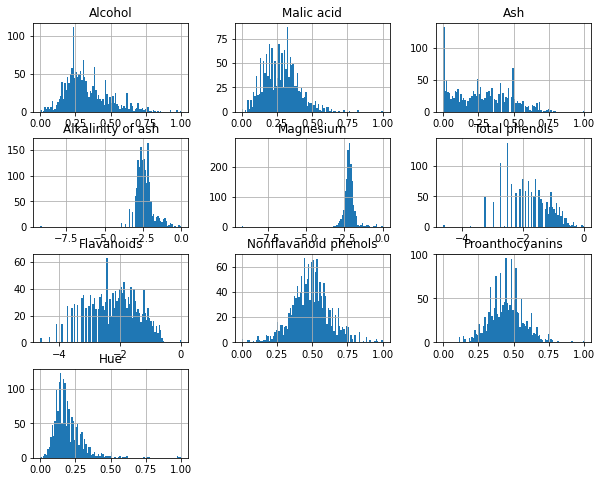

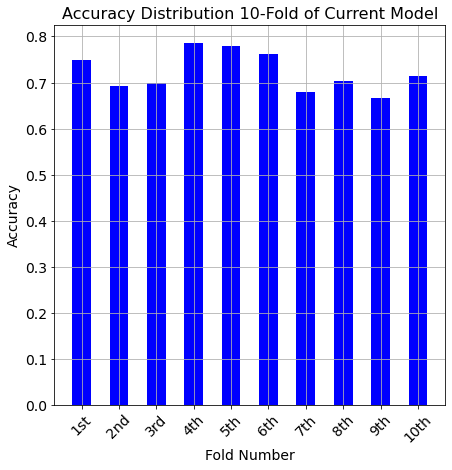

<Figure size 504x504 with 0 Axes>

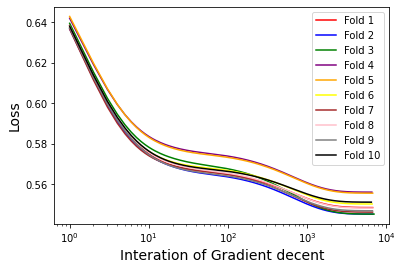

<Figure size 504x504 with 0 Axes>

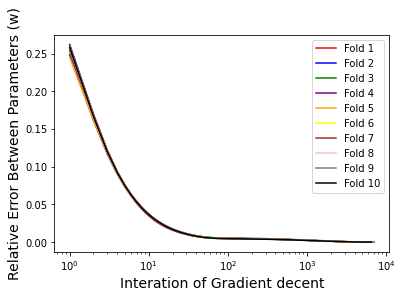

-------- Now testing learing rate is 0.75--------
No.1 fold start
interations  8450
No.2 fold start
interations  8535
No.3 fold start
interations  8817
No.4 fold start
interations  8272
No.5 fold start
interations  8477
No.6 fold start
interations  8332
No.7 fold start
interations  8448
No.8 fold start
interations  8413
No.9 fold start
interations  8414
No.10 fold start
interations  8142
Average Accuracy --> 0.7223719676549865


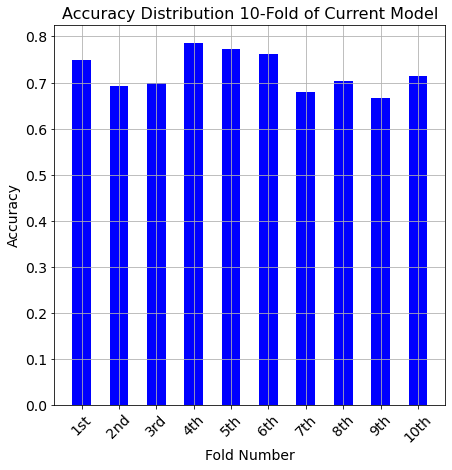

<Figure size 504x504 with 0 Axes>

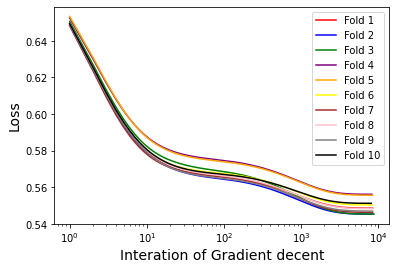

<Figure size 504x504 with 0 Axes>

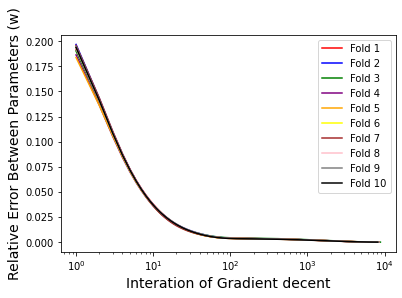

-------- Now testing learing rate is 0.5--------
No.1 fold start
interations  11441
No.2 fold start
interations  11570
No.3 fold start
interations  11974
No.4 fold start
interations  11215
No.5 fold start
interations  11489
No.6 fold start
interations  11285
No.7 fold start
interations  11456
No.8 fold start
interations  11400
No.9 fold start
interations  11399
No.10 fold start
interations  11023
Average Accuracy --> 0.7230008984725966


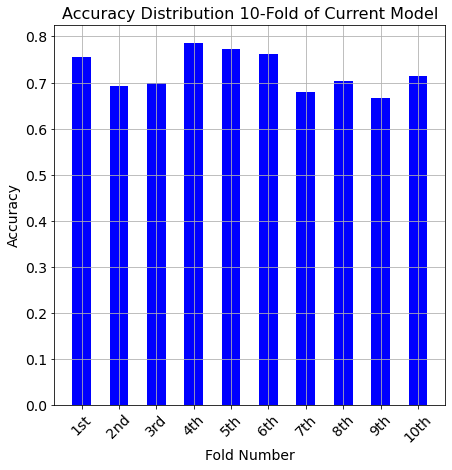

<Figure size 504x504 with 0 Axes>

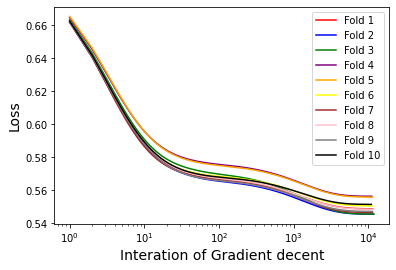

<Figure size 504x504 with 0 Axes>

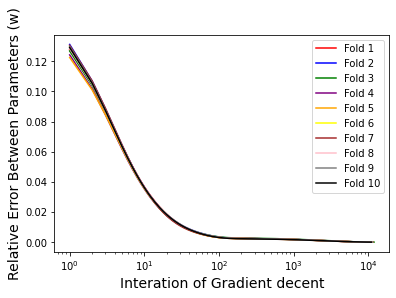

-------- Now testing learing rate is 0.25--------
No.1 fold start
interations  18667
No.2 fold start
interations  18931
No.3 fold start
interations  19671
No.4 fold start
interations  18352
No.5 fold start
interations  18786
No.6 fold start
interations  18426
No.7 fold start
interations  18755
No.8 fold start
interations  18630
No.9 fold start
interations  18626
No.10 fold start
interations  17978
Average Accuracy --> 0.7217767295597485


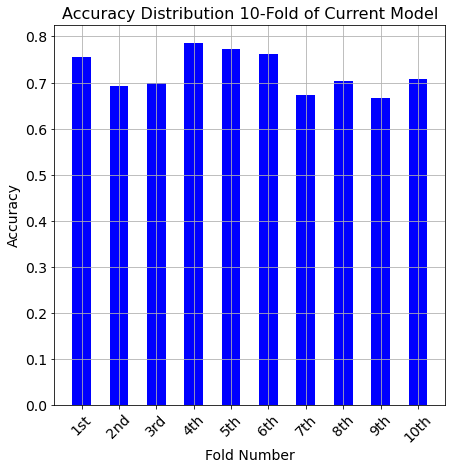

<Figure size 504x504 with 0 Axes>

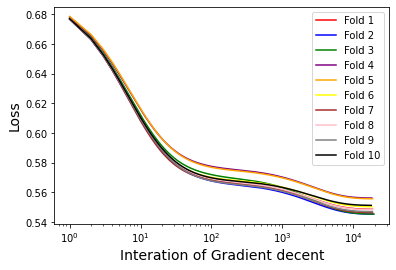

<Figure size 504x504 with 0 Axes>

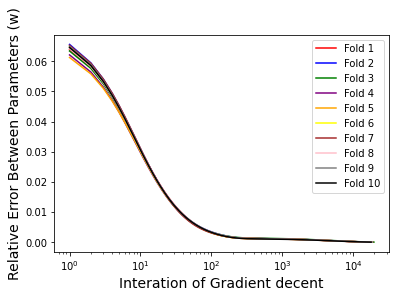

-------- Now testing learing rate is 0.1--------
No.1 fold start
interations  32759
No.2 fold start
interations  33444
No.3 fold start
interations  35086
No.4 fold start
interations  32433
No.5 fold start
interations  33136
No.6 fold start
interations  32395
No.7 fold start
interations  33183
No.8 fold start
interations  32821
No.9 fold start
interations  32802
No.10 fold start
interations  31511
Average Accuracy --> 0.7205525606469002


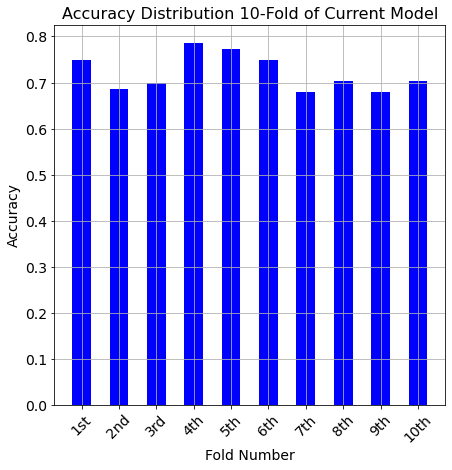

<Figure size 504x504 with 0 Axes>

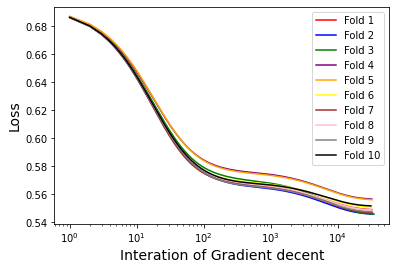

<Figure size 504x504 with 0 Axes>

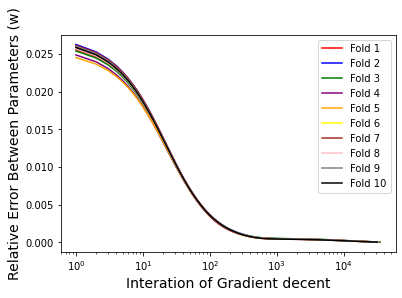

-------- Now testing learing rate is 0.05--------
No.1 fold start
interations  44627
No.2 fold start
interations  46043
No.3 fold start
interations  49043
No.4 fold start
interations  44683
No.5 fold start
interations  45491
No.6 fold start
interations  44256
No.7 fold start
interations  45790
No.8 fold start
interations  44981
No.9 fold start
interations  44936
No.10 fold start
interations  42817
Average Accuracy --> 0.71740790655885


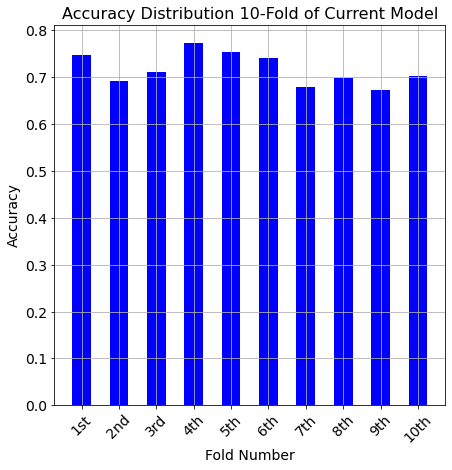

<Figure size 504x504 with 0 Axes>

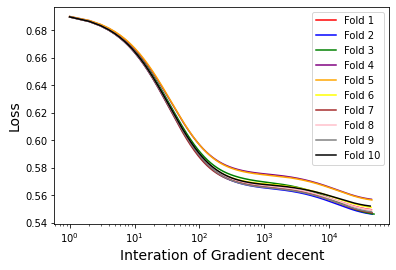

<Figure size 504x504 with 0 Axes>

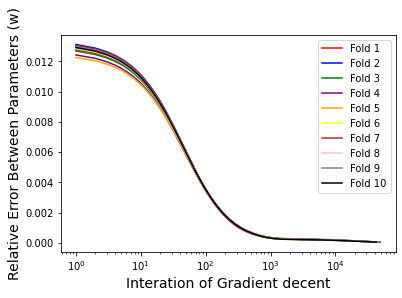

-------- Now testing learing rate is 0.025--------
No.1 fold start
interations  48556
No.2 fold start
interations  51485
No.3 fold start
interations  56966
No.4 fold start
interations  50045
No.5 fold start
interations  50457
No.6 fold start
interations  48500
No.7 fold start
interations  51503
No.8 fold start
interations  49681
No.9 fold start
interations  49600
No.10 fold start
interations  46169
Average Accuracy --> 0.7154200359389038


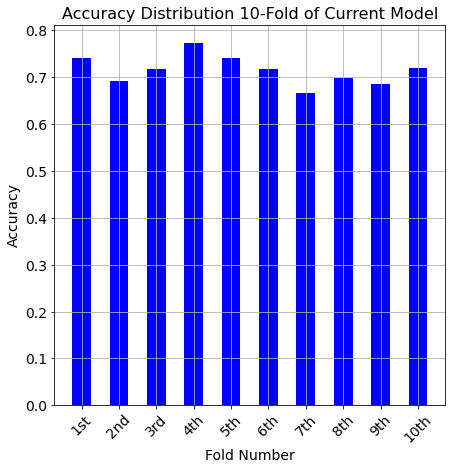

<Figure size 504x504 with 0 Axes>

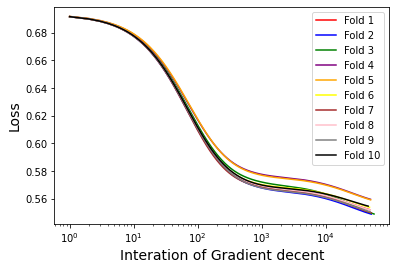

<Figure size 504x504 with 0 Axes>

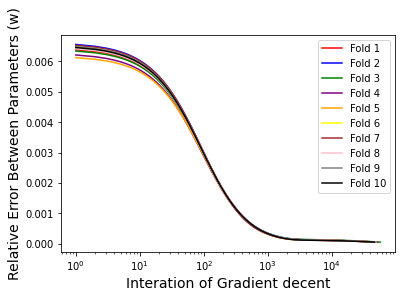

In [ ]:
## Running for the log transformr data
print('-------- log transform Data Test Start --------')
# create list to save data
remove4_order1_accur=[]
remove4_order1_iteration=[]
# Load data again
wine_df = pd.read_csv('White_wine Quality.csv')
wine_df[['Alkalinity of ash', 'Magnesium']] = wine_df[['Alkalinity of ash', 'Magnesium']] + 0.0001
wine_df[['Alkalinity of ash', 'Magnesium']] = wine_df[['Alkalinity of ash', 'Magnesium']].apply(np.log)
wine_df[['Total phenols', 'Flavanoids']] = wine_df[['Total phenols', 'Flavanoids']] + 0.01
wine_df[['Total phenols', 'Flavanoids']] = wine_df[['Total phenols', 'Flavanoids']].apply(np.log)
# check again hist plot
fig, ax = plt.subplots(figsize=(10, 8))
temp = wine_df.drop('quality label', axis=1)
temp.hist(bins=100, ax=ax)
fig.show()
#
X_wine = wine_df[['Alcohol', 'Malic acid', 'Ash', 'Alkalinity of ash', 'Magnesium', 'Total phenols', 'Flavanoids', 'Nonflavanoid phenols', 'Proanthocyanins', 'Hue']].to_numpy()
y_wine = wine_df['quality label'].to_numpy()
# shuffling data
X_wine, y_wine = shuffle(X_wine,y_wine)
# Test in linear order 1
X_wine = featureStandardization(X_wine)
X_wine = changeModelOrder(1, X_wine)
## testing 7 different learning rates
learn_test = learn_para 
#--- setting decay rate 0.000001 ---
#--- when iterations up to 10^6, the learning rate will be 1/2*learning rate, and up to 10^7 will be ~1/10*learning rate --- 
for learn in learn_test:
  print('-------- Now testing learing rate is ' + str(learn) + '--------')
  all_acu, all_err, all_losses, all_interation = validation(k = 10,X = X_wine,y = y_wine, stop_threshold = 0.00005, learning_rate=learn, decay_rate = 0.000001)
  plot_results(all_acu, all_err, all_losses, all_interation)
  remove4_order1_accur.append(sum(all_acu)/10)
  remove4_order1_iteration.append(sum(all_interation)/10)

Plot the first model result

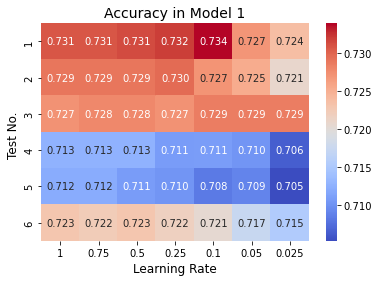

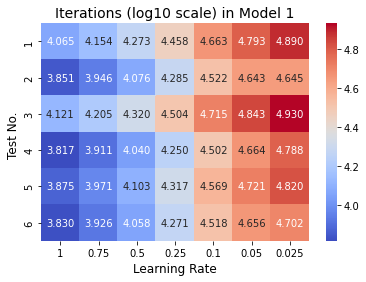

In [ ]:
acc = np.array([raw_order1_accur, std_order1_accur, remove_order1_accur,remove2_order1_accur,remove3_order1_accur,remove4_order1_accur])
xticklabels = ['1', '0.75', '0.5', '0.25', '0.1', '0.05', '0.025']
yticklabels = ['1', '2', '3', '4', '5', '6']
ax = sns.heatmap(acc, annot=True, fmt='.3f', xticklabels=xticklabels, yticklabels=yticklabels, cmap='coolwarm')
ax.set_xlabel('Learning Rate', fontsize=12)
ax.set_ylabel('Test No. ', fontsize=12)
ax.set_title("Accuracy in Model 1", fontsize=14)
plt.show()

time = np.log10(np.array([raw_order1_iteration,std_order1_iteration,remove_order1_iteration,remove2_order1_iteration,remove3_order1_iteration,remove4_order1_iteration]))
xticklabels = ['1', '0.75', '0.5', '0.25', '0.1', '0.05', '0.025']
yticklabels = ['1', '2', '3', '4', '5', '6']
ax = sns.heatmap(time, annot=True, fmt='.3f', xticklabels=xticklabels, yticklabels=yticklabels, cmap='coolwarm')
ax.set_xlabel('Learning Rate', fontsize=12)
ax.set_ylabel('Test No. ', fontsize=12)
ax.set_title("Iterations (log10 scale) in Model 1", fontsize=14)
plt.show()

-------- Model 2 (polynomial order 2)-------

Testing 1. Raw data

-------- Raw Data Test Start --------
The order of the linear model is now: 2
The shape of X ---> 1599x20
-------- Now testing learing rate is 1--------
No.1 fold start
interations  103743
No.2 fold start
interations  91593
No.3 fold start
interations  91655
No.4 fold start
interations  88665
No.5 fold start
interations  91795
No.6 fold start
interations  87379
No.7 fold start
interations  94410
No.8 fold start
interations  91087
No.9 fold start
interations  88584
No.10 fold start
interations  89179
Average Accuracy --> 0.7385893980233604


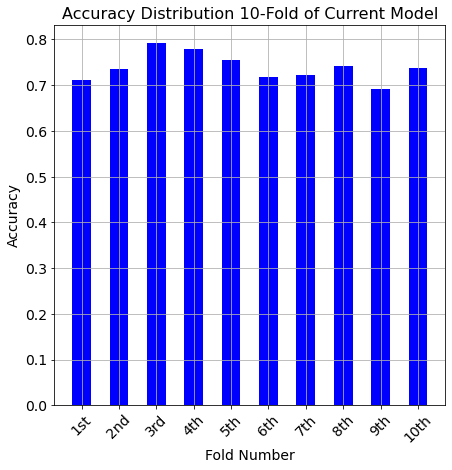

<Figure size 504x504 with 0 Axes>

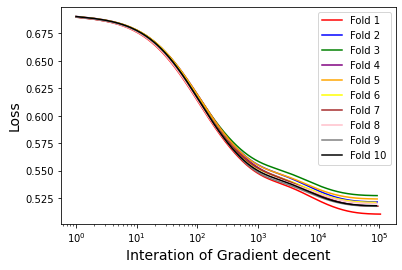

<Figure size 504x504 with 0 Axes>

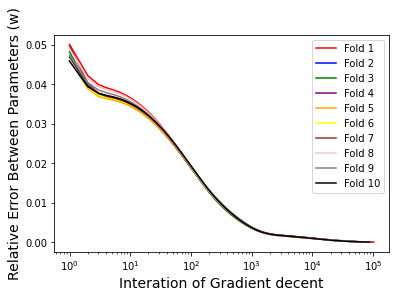

-------- Now testing learing rate is 0.75--------
No.1 fold start
interations  123204
No.2 fold start
interations  108615
No.3 fold start
interations  108564
No.4 fold start
interations  105627
No.5 fold start
interations  108543
No.6 fold start
interations  103510
No.7 fold start
interations  111888
No.8 fold start
interations  107045
No.9 fold start
interations  105019
No.10 fold start
interations  105783
Average Accuracy --> 0.7379604672057503


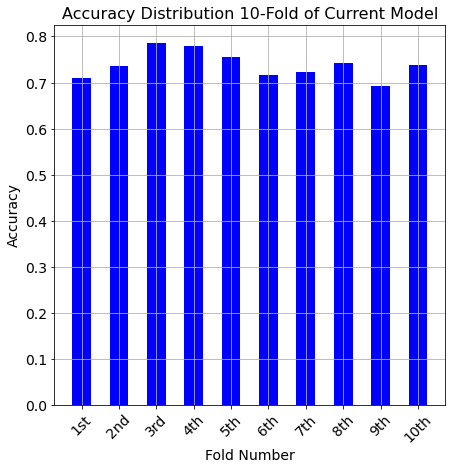

<Figure size 504x504 with 0 Axes>

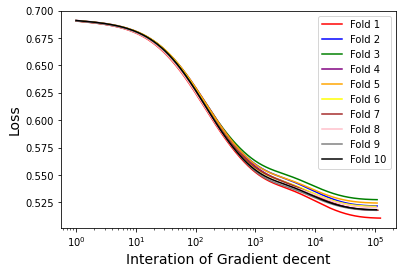

<Figure size 504x504 with 0 Axes>

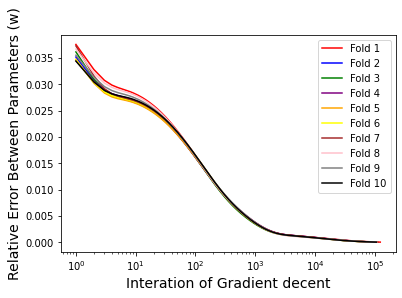

-------- Now testing learing rate is 0.5--------
No.1 fold start
interations  153393
No.2 fold start
interations  135069
No.3 fold start
interations  134457
No.4 fold start
interations  132327
No.5 fold start
interations  133895
No.6 fold start
interations  128339
No.7 fold start
interations  138851
No.8 fold start
interations  131804
No.9 fold start
interations  130403
No.10 fold start
interations  131407
Average Accuracy --> 0.7379604672057503


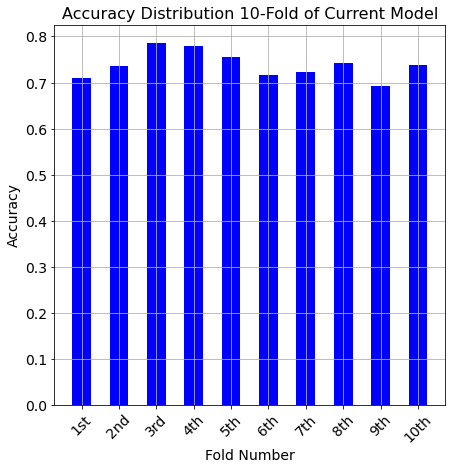

<Figure size 504x504 with 0 Axes>

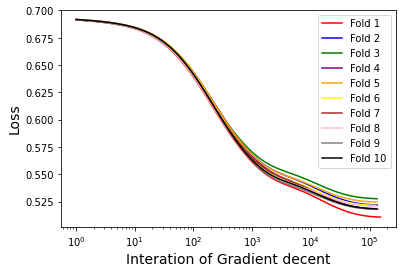

<Figure size 504x504 with 0 Axes>

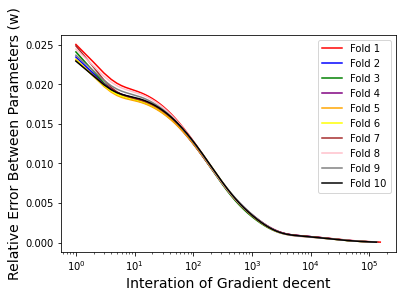

-------- Now testing learing rate is 0.25--------
No.1 fold start
interations  204571
No.2 fold start
interations  180653
No.3 fold start
interations  177024
No.4 fold start
interations  179717
No.5 fold start
interations  174195
No.6 fold start
interations  169998
No.7 fold start
interations  184153
No.8 fold start
interations  174508
No.9 fold start
interations  172737
No.10 fold start
interations  174351
Average Accuracy --> 0.7366352201257862


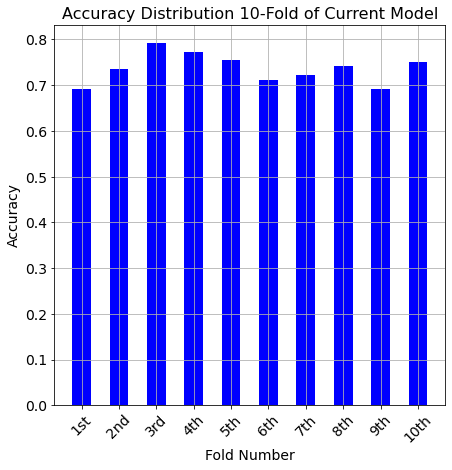

<Figure size 504x504 with 0 Axes>

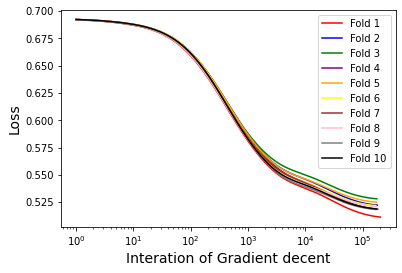

<Figure size 504x504 with 0 Axes>

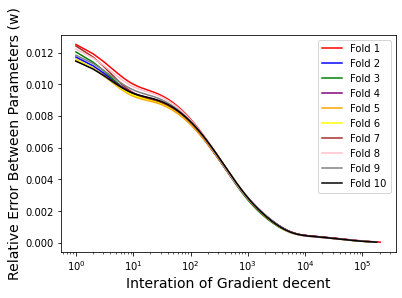

-------- Now testing learing rate is 0.1--------
No.1 fold start
interations  228579
No.2 fold start
interations  208699
No.3 fold start
interations  198678
No.4 fold start
interations  212419
No.5 fold start
interations  193993
No.6 fold start
interations  194409
No.7 fold start
interations  209098
No.8 fold start
interations  198042
No.9 fold start
interations  194090
No.10 fold start
interations  198135
Average Accuracy --> 0.7422619047619048


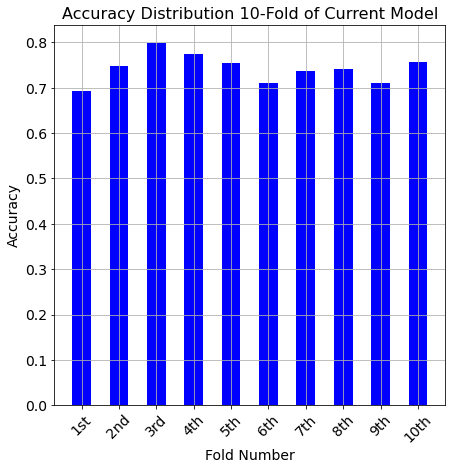

<Figure size 504x504 with 0 Axes>

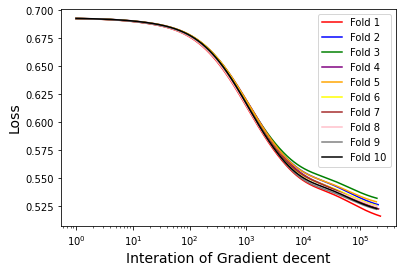

<Figure size 504x504 with 0 Axes>

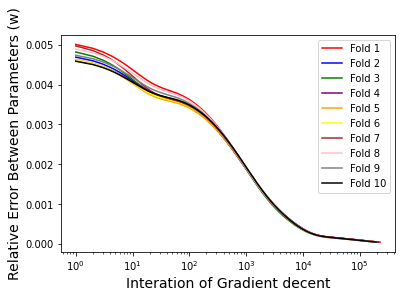

-------- Now testing learing rate is 0.05--------
No.1 fold start
interations  183274
No.2 fold start
interations  173354
No.3 fold start
interations  163381
No.4 fold start
interations  179304
No.5 fold start
interations  161959
No.6 fold start
interations  160566
No.7 fold start
interations  175449
No.8 fold start
interations  151042
No.9 fold start
interations  157962
No.10 fold start
interations  164178
Average Accuracy --> 0.735377358490566


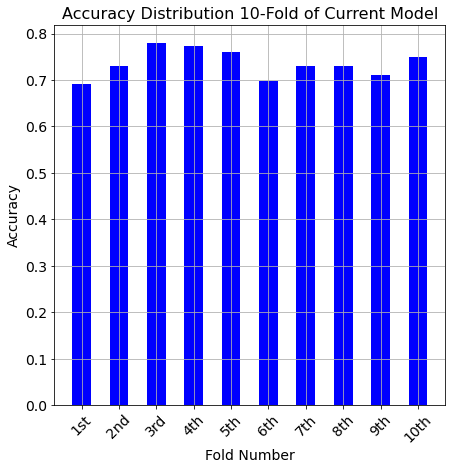

<Figure size 504x504 with 0 Axes>

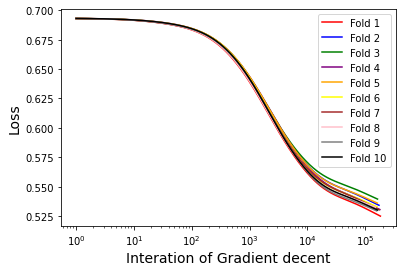

<Figure size 504x504 with 0 Axes>

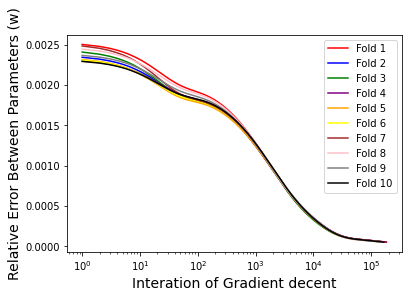

-------- Now testing learing rate is 0.025--------
No.1 fold start
interations  80686
No.2 fold start
interations  79213
No.3 fold start
interations  74891
No.4 fold start
interations  81216
No.5 fold start
interations  75265
No.6 fold start
interations  75849
No.7 fold start
interations  80596
No.8 fold start
interations  73106
No.9 fold start
interations  76658
No.10 fold start
interations  77455
Average Accuracy --> 0.7285601976639711


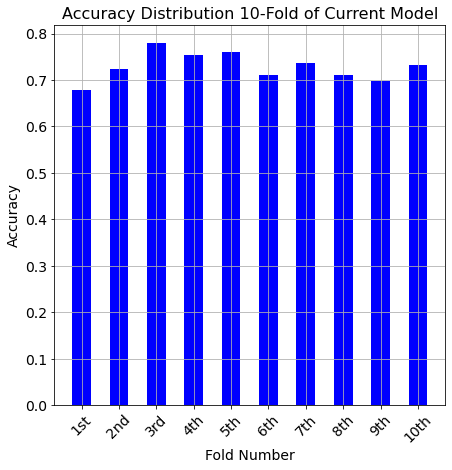

<Figure size 504x504 with 0 Axes>

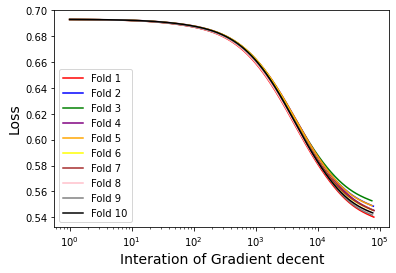

<Figure size 504x504 with 0 Axes>

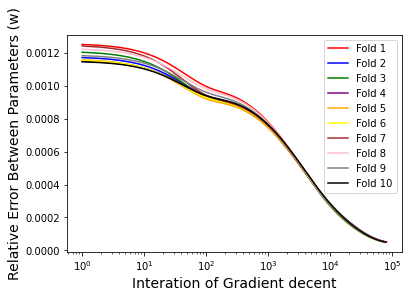

In [ ]:
## Running for the raw data
print('-------- Raw Data Test Start --------')
# create list to save data
raw_order2_accur=[]
raw_order2_iteration=[]
# Load data again
wine_df = pd.read_csv('White_wine Quality.csv')
X_wine = wine_df[['Alcohol','Malic acid', 'Ash', 'Alkalinity of ash', 'Magnesium', 'Total phenols', 'Flavanoids', 'Nonflavanoid phenols', 'Proanthocyanins', 'Hue']].to_numpy()
y_wine = wine_df['quality label'].to_numpy()
# shuffling data
X_wine, y_wine = shuffle(X_wine,y_wine)
# Test in linear order 2
X_wine = changeModelOrder(2, X_wine)
## testing 7 different learning rates
learn_test = learn_para
#--- setting decay rate 0.000001 ---
#--- when iterations up to 10^6, the learning rate will be 1/2*learning rate, and up to 10^7 for ~1/10*learning rate --- 
for learn in learn_test:
  print('-------- Now testing learing rate is ' + str(learn) + '--------')
  all_acu, all_err, all_losses, all_interation = validation(k = 10,X = X_wine,y = y_wine, stop_threshold = 0.00005, learning_rate=learn, decay_rate = 0.000001)
  plot_results(all_acu, all_err, all_losses, all_interation)
  raw_order2_accur.append(sum(all_acu)/10)
  raw_order2_iteration.append(sum(all_interation)/10)

Test 2. Standardization features

-------- Standardization Data Test Start --------
The order of the linear model is now: 2
The shape of X ---> 1599x20
-------- Now testing learing rate is 1--------
No.1 fold start
interations  28394
No.2 fold start
interations  28562
No.3 fold start
interations  30257
No.4 fold start
interations  28941
No.5 fold start
interations  28279
No.6 fold start
interations  29086
No.7 fold start
interations  31139
No.8 fold start
interations  30923
No.9 fold start
interations  29215
No.10 fold start
interations  29240
Average Accuracy --> 0.7368036837376459


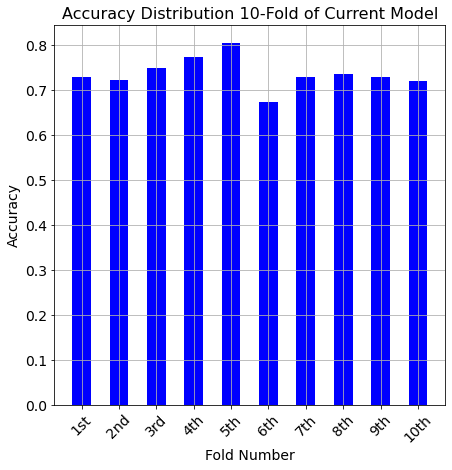

<Figure size 504x504 with 0 Axes>

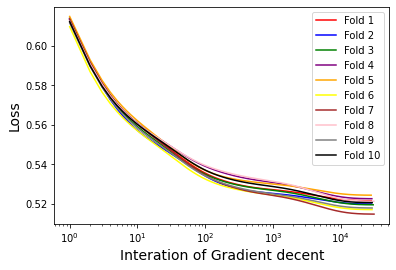

<Figure size 504x504 with 0 Axes>

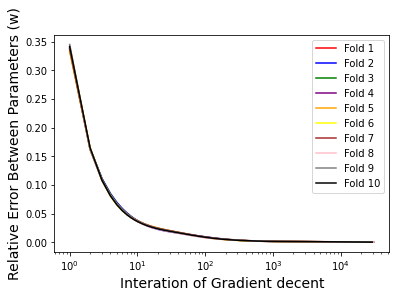

-------- Now testing learing rate is 0.75--------
No.1 fold start
interations  34401
No.2 fold start
interations  34586
No.3 fold start
interations  36792
No.4 fold start
interations  35278
No.5 fold start
interations  34271
No.6 fold start
interations  35398
No.7 fold start
interations  37987
No.8 fold start
interations  37776
No.9 fold start
interations  35543
No.10 fold start
interations  35633
Average Accuracy --> 0.7361747529200359


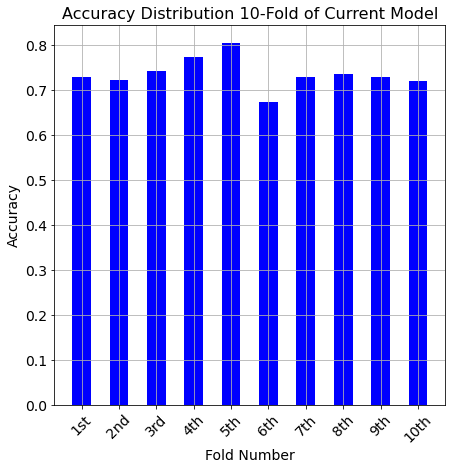

<Figure size 504x504 with 0 Axes>

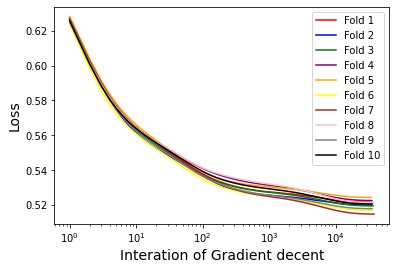

<Figure size 504x504 with 0 Axes>

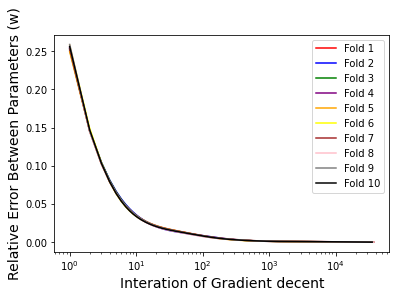

-------- Now testing learing rate is 0.5--------
No.1 fold start
interations  44255
No.2 fold start
interations  44443
No.3 fold start
interations  47644
No.4 fold start
interations  45891
No.5 fold start
interations  44113
No.6 fold start
interations  45912
No.7 fold start
interations  49483
No.8 fold start
interations  49332
No.9 fold start
interations  46071
No.10 fold start
interations  46331
Average Accuracy --> 0.7361410601976639


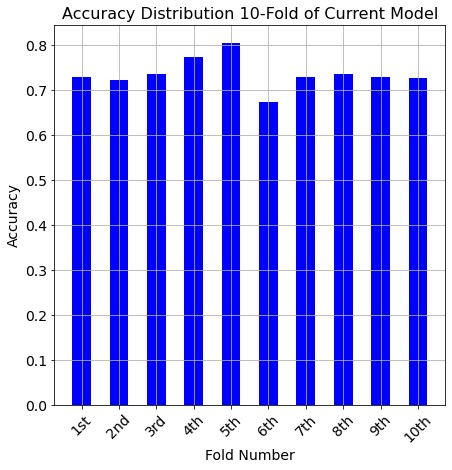

<Figure size 504x504 with 0 Axes>

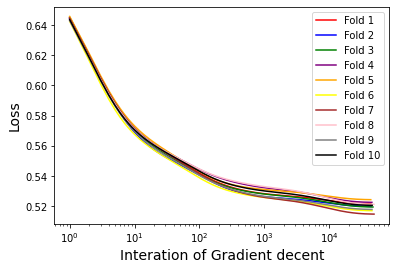

<Figure size 504x504 with 0 Axes>

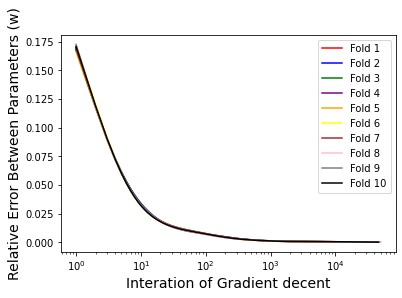

-------- Now testing learing rate is 0.25--------
No.1 fold start
interations  63133
No.2 fold start
interations  63172
No.3 fold start
interations  69228
No.4 fold start
interations  67563
No.5 fold start
interations  63060
No.6 fold start
interations  67038
No.7 fold start
interations  73107
No.8 fold start
interations  73359
No.9 fold start
interations  67118
No.10 fold start
interations  68113
Average Accuracy --> 0.737365229110512


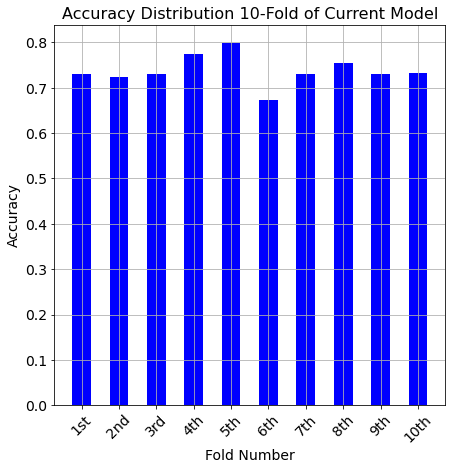

<Figure size 504x504 with 0 Axes>

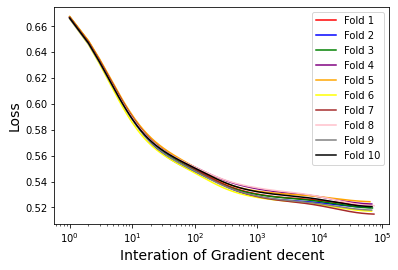

<Figure size 504x504 with 0 Axes>

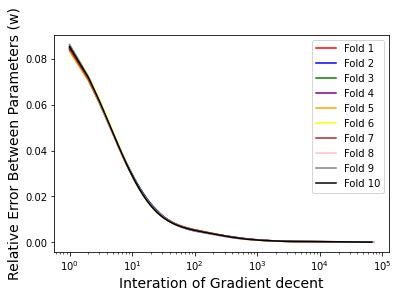

-------- Now testing learing rate is 0.1--------
No.1 fold start
interations  73385
No.2 fold start
interations  72153
No.3 fold start
interations  86128
No.4 fold start
interations  88368
No.5 fold start
interations  74083
No.6 fold start
interations  85100
No.7 fold start
interations  96702
No.8 fold start
interations  98973
No.9 fold start
interations  84227
No.10 fold start
interations  88588
Average Accuracy --> 0.7367362982929019


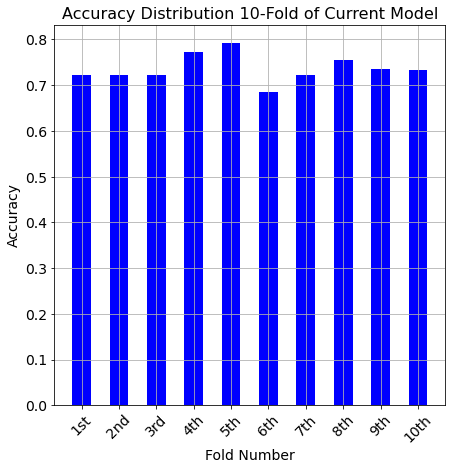

<Figure size 504x504 with 0 Axes>

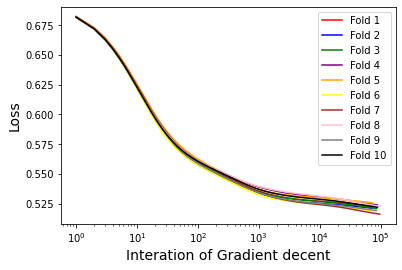

<Figure size 504x504 with 0 Axes>

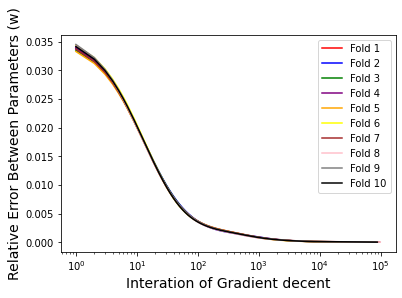

-------- Now testing learing rate is 0.05--------
No.1 fold start
interations  28717
No.2 fold start
interations  25991
No.3 fold start
interations  46691
No.4 fold start
interations  59972
No.5 fold start
interations  30050
No.6 fold start
interations  50995
No.7 fold start
interations  68539
No.8 fold start
interations  74775
No.9 fold start
interations  47160
No.10 fold start
interations  58668
Average Accuracy --> 0.7286275831087151


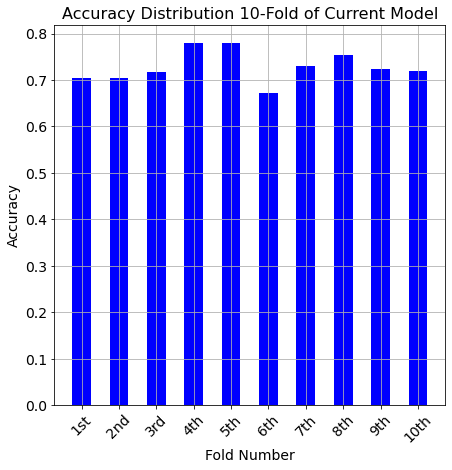

<Figure size 504x504 with 0 Axes>

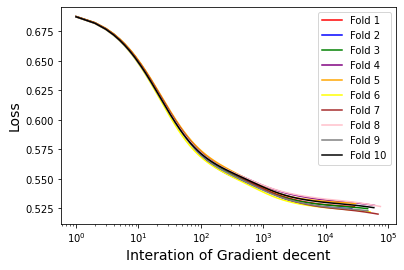

<Figure size 504x504 with 0 Axes>

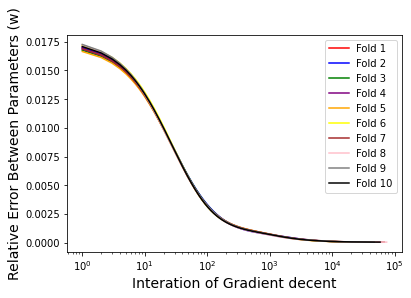

-------- Now testing learing rate is 0.025--------
No.1 fold start
interations  20690
No.2 fold start
interations  19691
No.3 fold start
interations  20617
No.4 fold start
interations  21999
No.5 fold start
interations  18317
No.6 fold start
interations  20839
No.7 fold start
interations  23826
No.8 fold start
interations  22640
No.9 fold start
interations  22903
No.10 fold start
interations  21300
Average Accuracy --> 0.7299191374663073


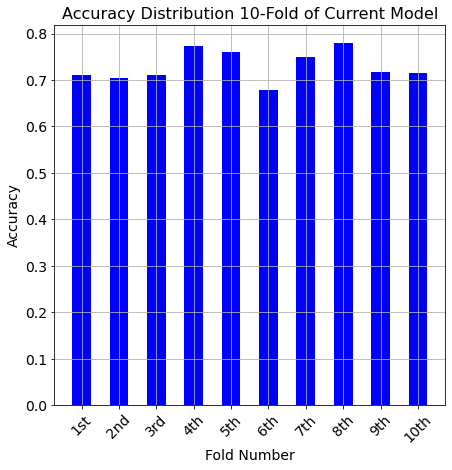

<Figure size 504x504 with 0 Axes>

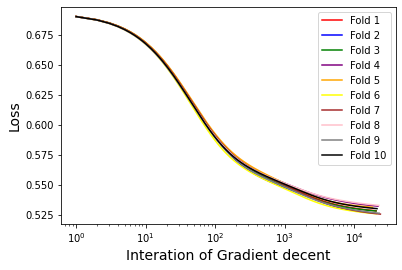

<Figure size 504x504 with 0 Axes>

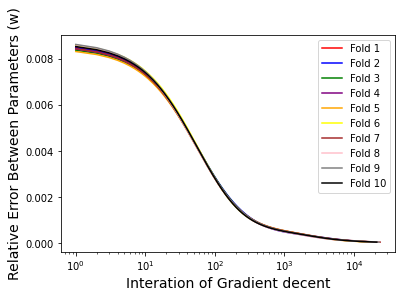

In [ ]:
## Running for the Standardization data
print('-------- Standardization Data Test Start --------')
# create list to save data
std_order2_accur=[]
std_order2_iteration=[]
# Load data again
wine_df = pd.read_csv('White_wine Quality.csv')
X_wine = wine_df[['Alcohol','Malic acid', 'Ash', 'Alkalinity of ash', 'Magnesium', 'Total phenols', 'Flavanoids', 'Nonflavanoid phenols', 'Proanthocyanins', 'Hue']].to_numpy()
y_wine = wine_df['quality label'].to_numpy()
# shuffling data
X_wine, y_wine = shuffle(X_wine,y_wine)
# Test in linear order 2
X_wine = changeModelOrder(2, X_wine)
X_wine = featureStandardization(X_wine)
## testing 7 different learning rates
learn_test = learn_para
#--- setting decay rate 0.000001 ---
#--- when iterations up to 10^6, the learning rate will be 1/2*learning rate, and up to 10^7 for ~1/10*learning rate --- 
for learn in learn_test:
  print('-------- Now testing learing rate is ' + str(learn) + '--------')
  all_acu, all_err, all_losses, all_interation = validation(k = 10,X = X_wine,y = y_wine, stop_threshold = 0.00005, learning_rate=learn, decay_rate = 0.000001)
  plot_results(all_acu, all_err, all_losses, all_interation)
  std_order2_accur.append(sum(all_acu)/10)
  std_order2_iteration.append(sum(all_interation)/10)

Test 3. Remove outliers

-------- Remove Outliers Data Test Start --------
The order of the linear model is now: 2
The shape of X ---> 1463x20
-------- Now testing learing rate is 1--------
No.1 fold start
interations  362628
No.2 fold start
interations  350338
No.3 fold start
interations  368776
No.4 fold start
interations  355935
No.5 fold start
interations  385902
No.6 fold start
interations  388975
No.7 fold start
interations  389425
No.8 fold start
interations  371300
No.9 fold start
interations  359710
No.10 fold start
interations  369384
Average Accuracy --> 0.7388526248046337


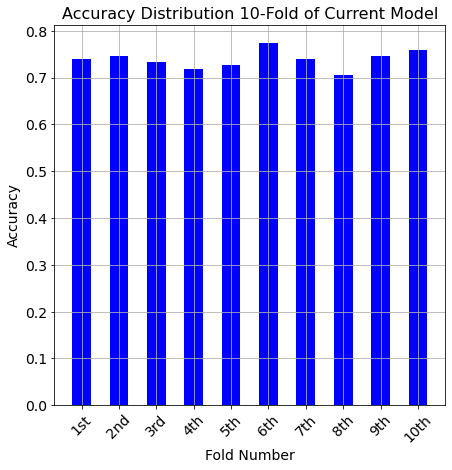

<Figure size 504x504 with 0 Axes>

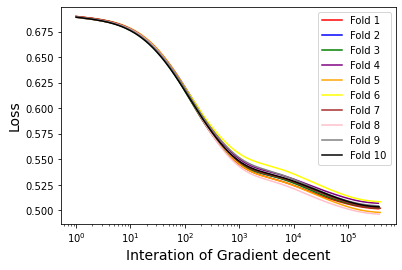

<Figure size 504x504 with 0 Axes>

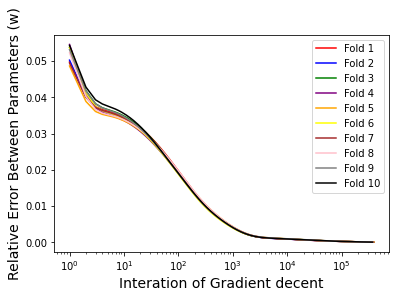

-------- Now testing learing rate is 0.75--------
No.1 fold start
interations  395726
No.2 fold start
interations  388089
No.3 fold start
interations  395515
No.4 fold start
interations  392428
No.5 fold start
interations  419583
No.6 fold start
interations  415000
No.7 fold start
interations  415296
No.8 fold start
interations  404602
No.9 fold start
interations  393093
No.10 fold start
interations  406973
Average Accuracy --> 0.7361266893444884


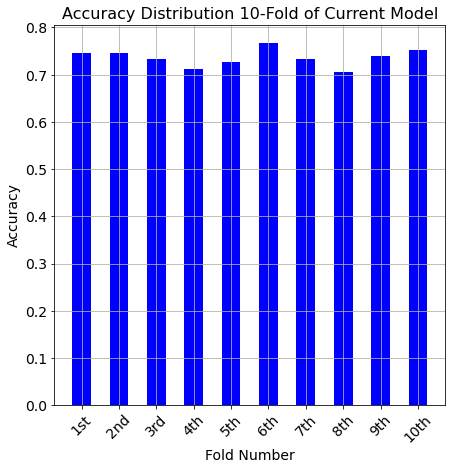

<Figure size 504x504 with 0 Axes>

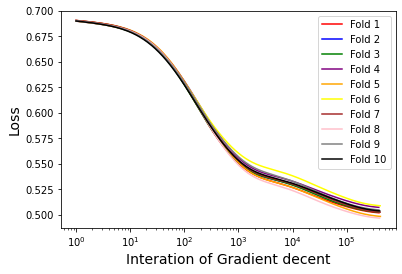

<Figure size 504x504 with 0 Axes>

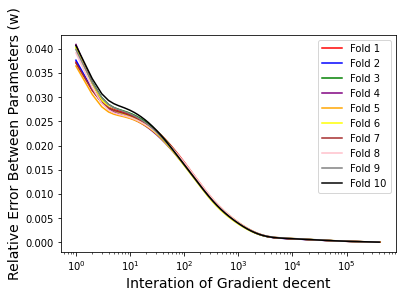

-------- Now testing learing rate is 0.5--------
No.1 fold start
interations  431343
No.2 fold start
interations  432678
No.3 fold start
interations  428310
No.4 fold start
interations  434746
No.5 fold start
interations  458906
No.6 fold start
interations  452936
No.7 fold start
interations  450701
No.8 fold start
interations  441428
No.9 fold start
interations  432566
No.10 fold start
interations  450624
Average Accuracy --> 0.7320308908706444


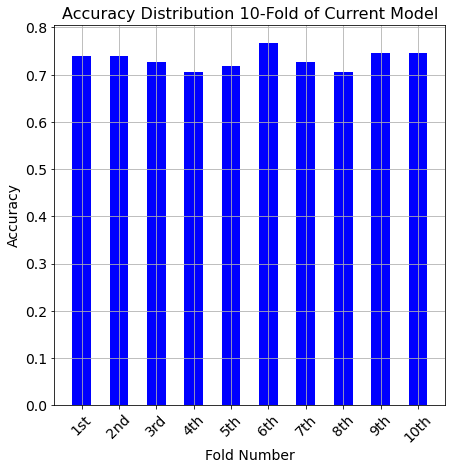

<Figure size 504x504 with 0 Axes>

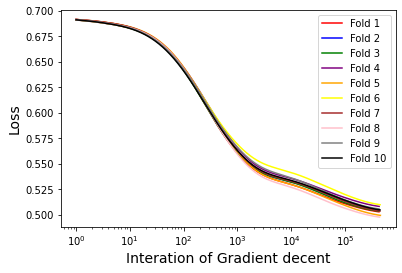

<Figure size 504x504 with 0 Axes>

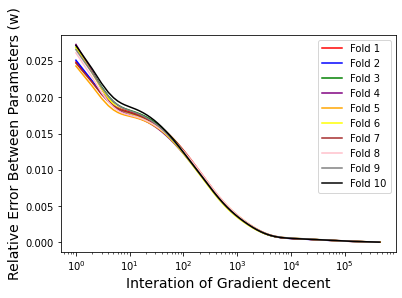

-------- Now testing learing rate is 0.25--------
No.1 fold start
interations  395987
No.2 fold start
interations  419316
No.3 fold start
interations  406966
No.4 fold start
interations  416271
No.5 fold start
interations  439817
No.6 fold start
interations  449235
No.7 fold start
interations  434999
No.8 fold start
interations  414881
No.9 fold start
interations  421782
No.10 fold start
interations  435242
Average Accuracy --> 0.7306472372896937


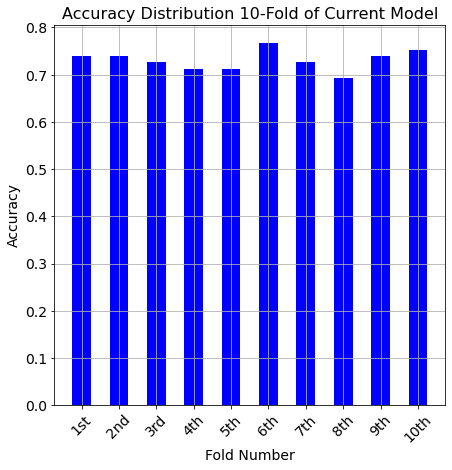

<Figure size 504x504 with 0 Axes>

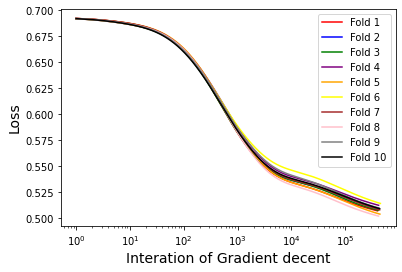

<Figure size 504x504 with 0 Axes>

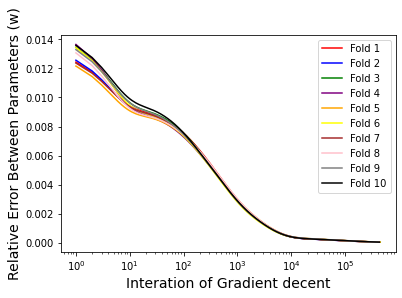

-------- Now testing learing rate is 0.1--------
No.1 fold start
interations  254019
No.2 fold start
interations  259090
No.3 fold start
interations  272560
No.4 fold start
interations  256651
No.5 fold start
interations  275840
No.6 fold start
interations  283388
No.7 fold start
interations  271408
No.8 fold start
interations  269248
No.9 fold start
interations  283299
No.10 fold start
interations  264599
Average Accuracy --> 0.7326882412429899


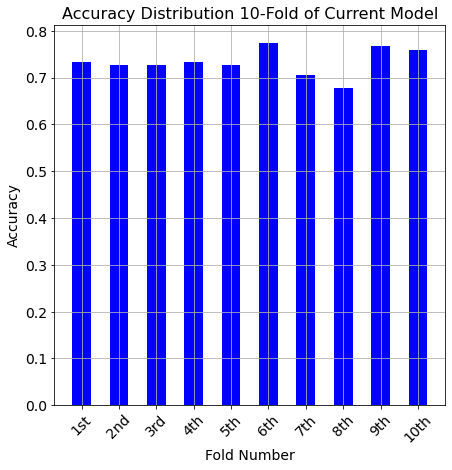

<Figure size 504x504 with 0 Axes>

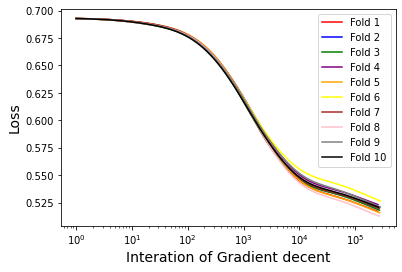

<Figure size 504x504 with 0 Axes>

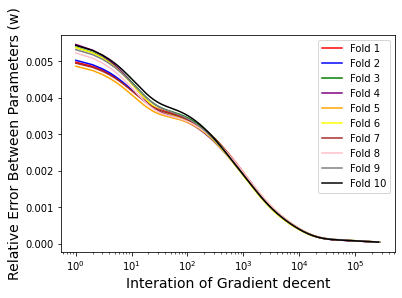

-------- Now testing learing rate is 0.05--------
No.1 fold start
interations  119811
No.2 fold start
interations  104297
No.3 fold start
interations  119043
No.4 fold start
interations  111075
No.5 fold start
interations  118144
No.6 fold start
interations  129556
No.7 fold start
interations  109619
No.8 fold start
interations  131462
No.9 fold start
interations  134463
No.10 fold start
interations  113472
Average Accuracy --> 0.730633446722442


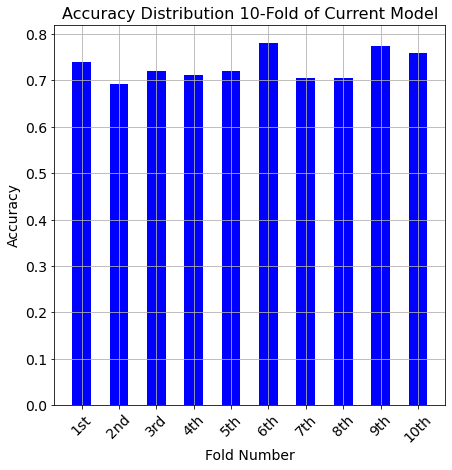

<Figure size 504x504 with 0 Axes>

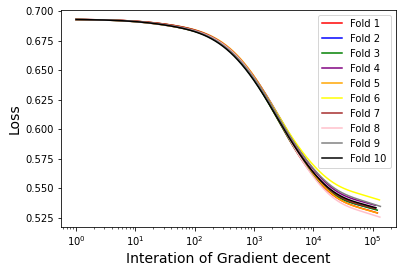

<Figure size 504x504 with 0 Axes>

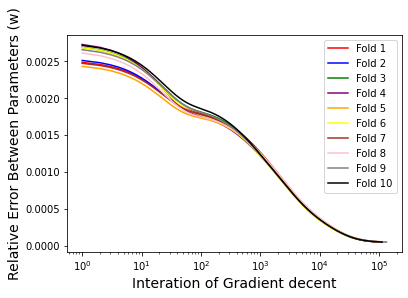

-------- Now testing learing rate is 0.025--------
No.1 fold start
interations  80095
No.2 fold start
interations  78946
No.3 fold start
interations  76128
No.4 fold start
interations  78609
No.5 fold start
interations  81634
No.6 fold start
interations  76561
No.7 fold start
interations  78508
No.8 fold start
interations  81640
No.9 fold start
interations  80270
No.10 fold start
interations  78095
Average Accuracy --> 0.7231405718488555


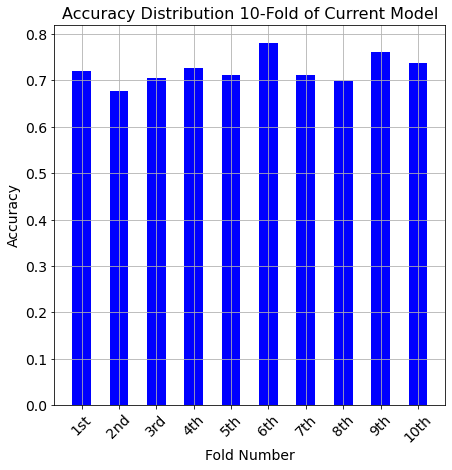

<Figure size 504x504 with 0 Axes>

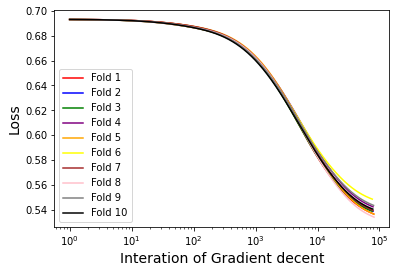

<Figure size 504x504 with 0 Axes>

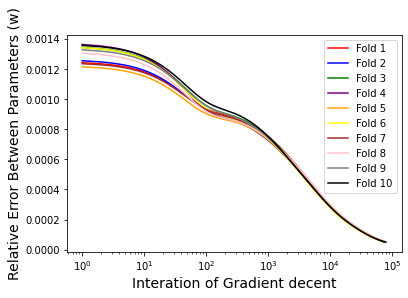

In [29]:
## Running for the remove outlier data
print('-------- Remove Outliers Data Test Start --------')
# create list to save data
remove_order2_accur=[]
remove_order2_iteration=[]
# Load data again
wine_df = pd.read_csv('White_wine Quality.csv')
columns = ['Alcohol', 'Malic acid', 'Ash', 'Alkalinity of ash', 'Magnesium', 'Total phenols', 'Flavanoids', 'Nonflavanoid phenols', 'Proanthocyanins', 'Hue']
# remove outlier in features
outliers = detect_outliers(wine_df, columns)
outliers = list(set(outliers))
wine_df = wine_df.drop(outliers)
X_wine = wine_df[['Alcohol','Malic acid', 'Ash', 'Alkalinity of ash', 'Magnesium', 'Total phenols', 'Flavanoids', 'Nonflavanoid phenols', 'Proanthocyanins', 'Hue']].to_numpy()
y_wine = wine_df['quality label'].to_numpy()
# shuffling data
X_wine, y_wine = shuffle(X_wine,y_wine)
# Test in linear order 2
#X_wine = featureStandardization(X_wine)
X_wine = changeModelOrder(2, X_wine)
## testing 7 different learning rates
learn_test = learn_para 
#--- setting decay rate 0.000001 ---
#--- when iterations up to 10^6, the learning rate will be 1/2*learning rate, and up to 10^7 will be ~1/10*learning rate --- 
for learn in learn_test:
  print('-------- Now testing learing rate is ' + str(learn) + '--------')
  all_acu, all_err, all_losses, all_interation = validation(k = 10,X = X_wine,y = y_wine, stop_threshold = 0.00005, learning_rate=learn, decay_rate = 0.000001)
  plot_results(all_acu, all_err, all_losses, all_interation)
  remove_order2_accur.append(sum(all_acu)/10)
  remove_order2_iteration.append(sum(all_interation)/10)

Test 4. Removing low correlation value between features and label

-------- Remove Data Test2 Start --------
The order of the linear model is now: 2
The shape of X ---> 1599x16
-------- Now testing learing rate is 1--------
No.1 fold start
interations  87457
No.2 fold start
interations  90133
No.3 fold start
interations  81684
No.4 fold start
interations  93681
No.5 fold start
interations  87587
No.6 fold start
interations  81965
No.7 fold start
interations  80649
No.8 fold start
interations  101479
No.9 fold start
interations  84966
No.10 fold start
interations  84973
Average Accuracy --> 0.7247529200359388


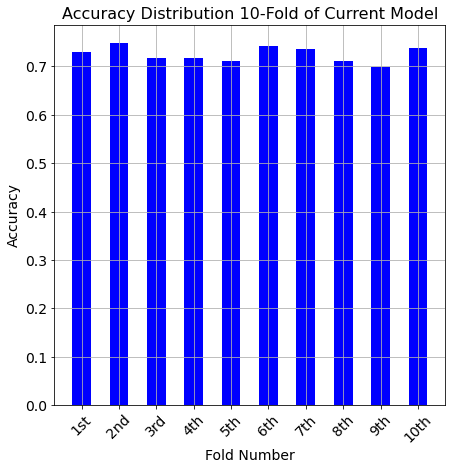

<Figure size 504x504 with 0 Axes>

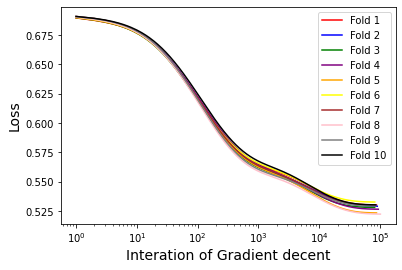

<Figure size 504x504 with 0 Axes>

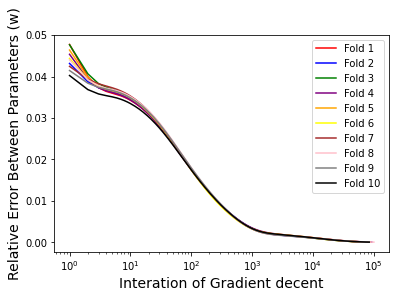

-------- Now testing learing rate is 0.75--------
No.1 fold start
interations  104473
No.2 fold start
interations  108180
No.3 fold start
interations  97583
No.4 fold start
interations  111754
No.5 fold start
interations  105926
No.6 fold start
interations  98223
No.7 fold start
interations  97104
No.8 fold start
interations  120250
No.9 fold start
interations  101484
No.10 fold start
interations  102410
Average Accuracy --> 0.7241239892183288


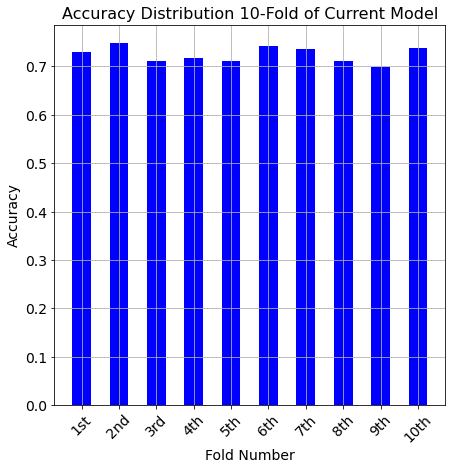

<Figure size 504x504 with 0 Axes>

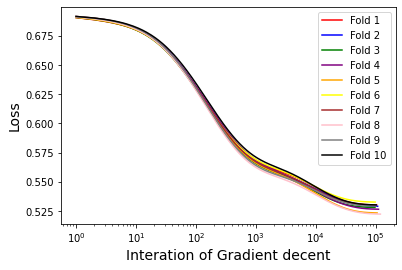

<Figure size 504x504 with 0 Axes>

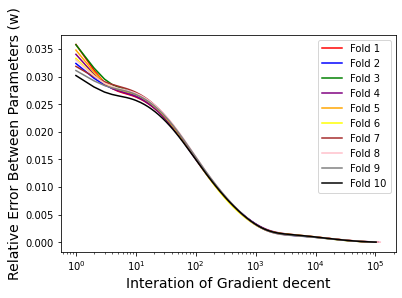

-------- Now testing learing rate is 0.5--------
No.1 fold start
interations  131806
No.2 fold start
interations  137318
No.3 fold start
interations  123237
No.4 fold start
interations  140723
No.5 fold start
interations  135868
No.6 fold start
interations  124328
No.7 fold start
interations  123827
No.8 fold start
interations  150046
No.9 fold start
interations  127834
No.10 fold start
interations  130733
Average Accuracy --> 0.7253818508535489


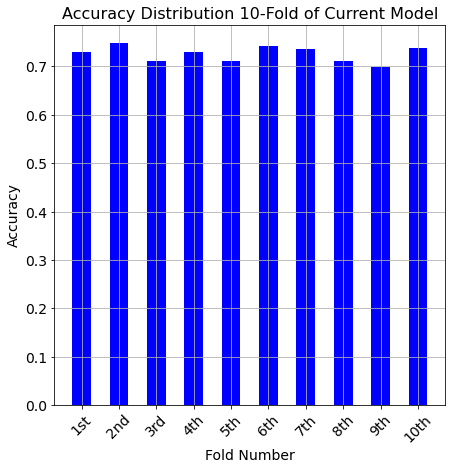

<Figure size 504x504 with 0 Axes>

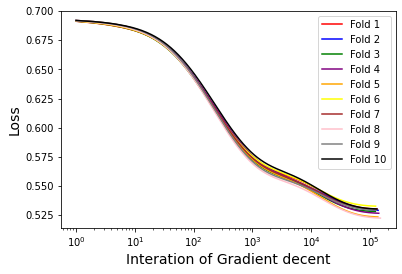

<Figure size 504x504 with 0 Axes>

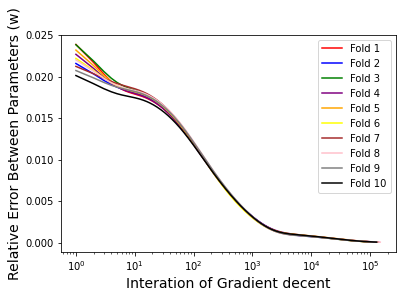

-------- Now testing learing rate is 0.25--------
No.1 fold start
interations  182625
No.2 fold start
interations  191246
No.3 fold start
interations  171592
No.4 fold start
interations  194062
No.5 fold start
interations  193096
No.6 fold start
interations  172470
No.7 fold start
interations  174469
No.8 fold start
interations  204076
No.9 fold start
interations  175583
No.10 fold start
interations  184423
Average Accuracy --> 0.7254155435759209


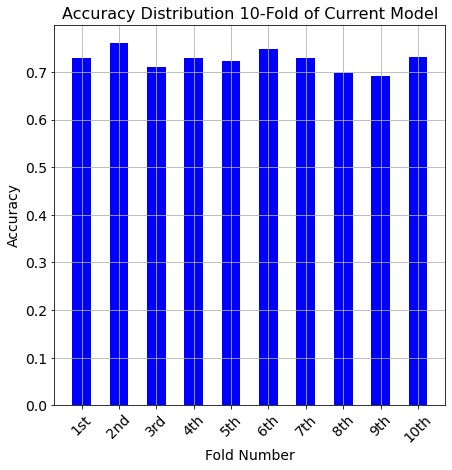

<Figure size 504x504 with 0 Axes>

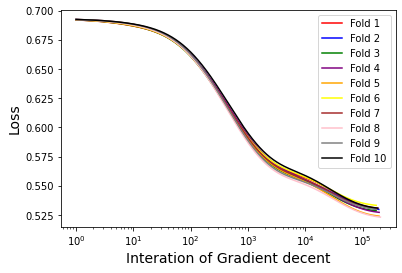

<Figure size 504x504 with 0 Axes>

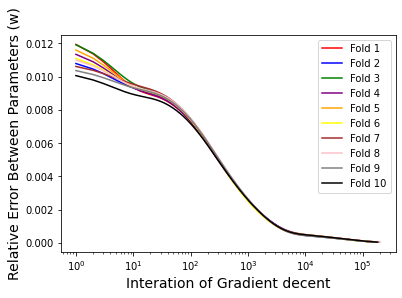

-------- Now testing learing rate is 0.1--------
No.1 fold start
interations  224722
No.2 fold start
interations  226387
No.3 fold start
interations  212648
No.4 fold start
interations  231088
No.5 fold start
interations  239172
No.6 fold start
interations  208736
No.7 fold start
interations  215763
No.8 fold start
interations  238274
No.9 fold start
interations  209501
No.10 fold start
interations  228303
Average Accuracy --> 0.7230008984725965


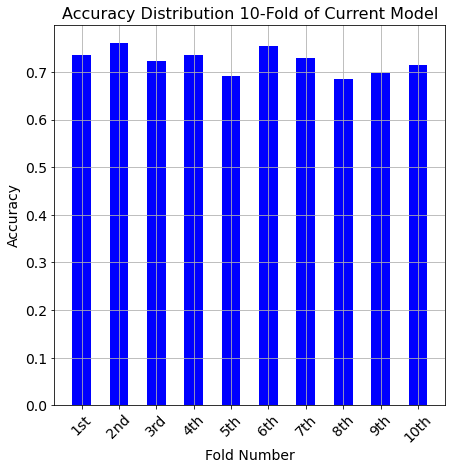

<Figure size 504x504 with 0 Axes>

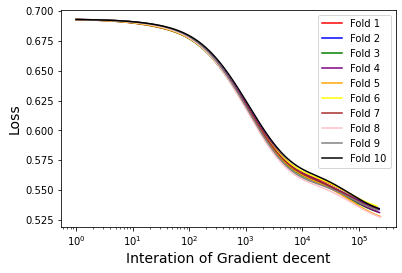

<Figure size 504x504 with 0 Axes>

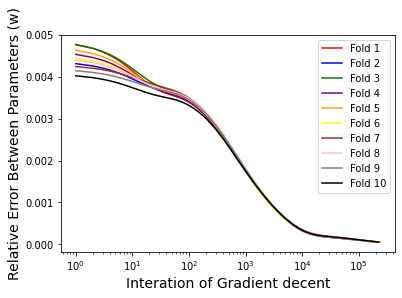

-------- Now testing learing rate is 0.05--------
No.1 fold start
interations  193038
No.2 fold start
interations  177444
No.3 fold start
interations  183482
No.4 fold start
interations  191734
No.5 fold start
interations  200805
No.6 fold start
interations  178182
No.7 fold start
interations  181878
No.8 fold start
interations  191115
No.9 fold start
interations  173031
No.10 fold start
interations  194735
Average Accuracy --> 0.717340521114106


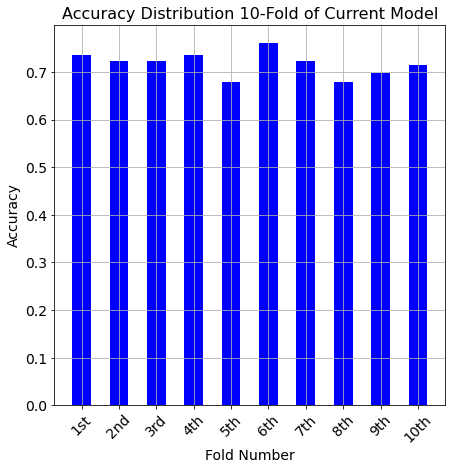

<Figure size 504x504 with 0 Axes>

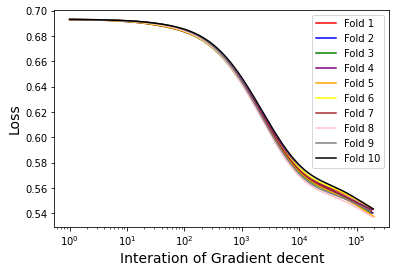

<Figure size 504x504 with 0 Axes>

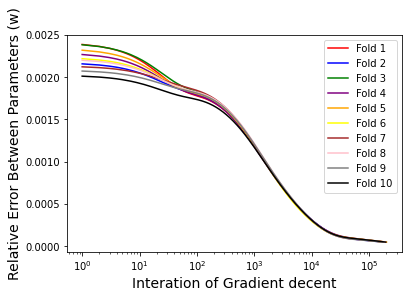

-------- Now testing learing rate is 0.025--------
No.1 fold start
interations  71815
No.2 fold start
interations  75230
No.3 fold start
interations  77604
No.4 fold start
interations  87180
No.5 fold start
interations  83802
No.6 fold start
interations  76047
No.7 fold start
interations  76365
No.8 fold start
interations  72282
No.9 fold start
interations  69189
No.10 fold start
interations  81143
Average Accuracy --> 0.7129380053908356


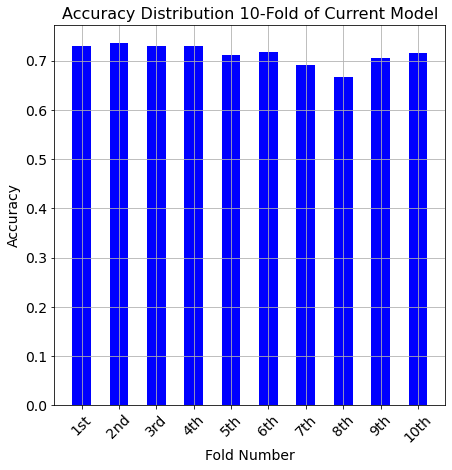

<Figure size 504x504 with 0 Axes>

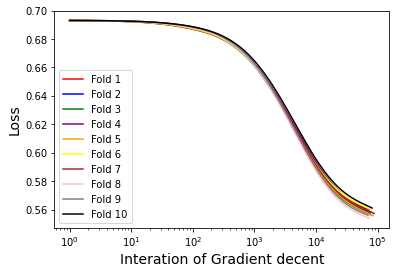

<Figure size 504x504 with 0 Axes>

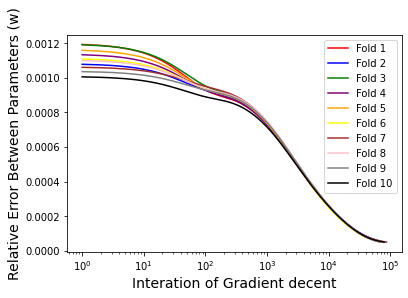

In [30]:
## Running for removing low correlation value between features and label 
print('-------- Remove Data Test2 Start --------')
# create list to save data
remove2_order2_accur=[]
remove2_order2_iteration=[]
# Load data again
wine_df = pd.read_csv('White_wine Quality.csv')
# remove two features that have low correlation to quality label -----> Alkalinity of ash and 'Proanthocyanins'
X_wine = wine_df[['Alcohol','Malic acid', 'Ash', 'Magnesium', 'Total phenols', 'Flavanoids', 'Nonflavanoid phenols', 'Hue']].to_numpy()
y_wine = wine_df['quality label'].to_numpy()
# shuffling data
X_wine, y_wine = shuffle(X_wine,y_wine)
# Test in linear order 2
#X_wine = featureStandardization(X_wine)
X_wine = changeModelOrder(2, X_wine)
## testing 7 different learning rates
learn_test = learn_para
#--- setting decay rate 0.000001 ---
#--- when iterations up to 10^6, the learning rate will be 1/2*learning rate, and up to 10^7 will be ~1/10*learning rate --- 
for learn in learn_test:
  print('-------- Now testing learing rate is ' + str(learn) + '--------')
  all_acu, all_err, all_losses, all_interation = validation(k = 10,X = X_wine,y = y_wine, stop_threshold = 0.00005, learning_rate=learn, decay_rate = 0.000001)
  plot_results(all_acu, all_err, all_losses, all_interation)
  remove2_order2_accur.append(sum(all_acu)/10)
  remove2_order2_iteration.append(sum(all_interation)/10)

Test 5. Removing Alcohol feature(because have relatively high correlation to 3 other features, ~0.7)

-------- Remove Data Test3 Start --------
The order of the linear model is now: 2
The shape of X ---> 1599x18
-------- Now testing learing rate is 1--------
No.1 fold start
interations  86978
No.2 fold start
interations  73943
No.3 fold start
interations  69720
No.4 fold start
interations  73235
No.5 fold start
interations  78360
No.6 fold start
interations  68107
No.7 fold start
interations  64800
No.8 fold start
interations  63337
No.9 fold start
interations  76370
No.10 fold start
interations  70391
Average Accuracy --> 0.7242924528301886


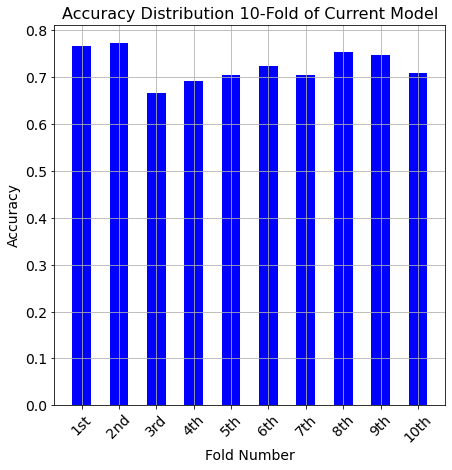

<Figure size 504x504 with 0 Axes>

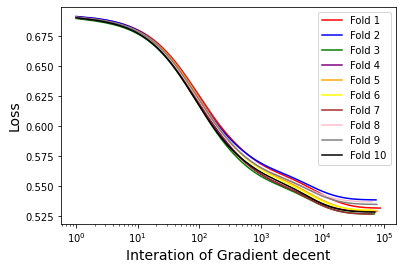

<Figure size 504x504 with 0 Axes>

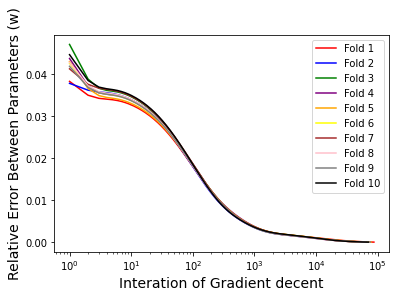

-------- Now testing learing rate is 0.75--------
No.1 fold start
interations  103911
No.2 fold start
interations  86277
No.3 fold start
interations  82443
No.4 fold start
interations  85608
No.5 fold start
interations  94173
No.6 fold start
interations  80810
No.7 fold start
interations  77788
No.8 fold start
interations  75577
No.9 fold start
interations  88065
No.10 fold start
interations  82646
Average Accuracy --> 0.7242924528301886


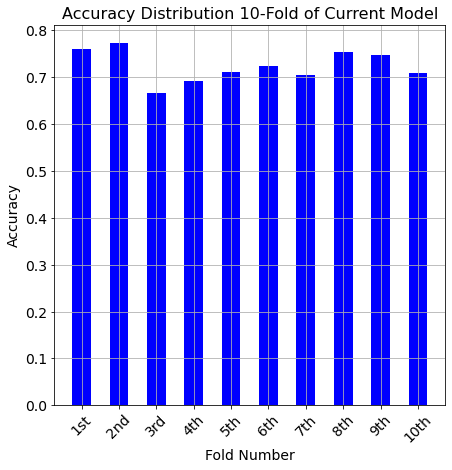

<Figure size 504x504 with 0 Axes>

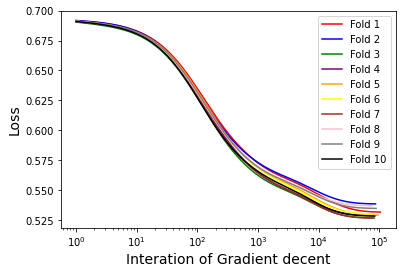

<Figure size 504x504 with 0 Axes>

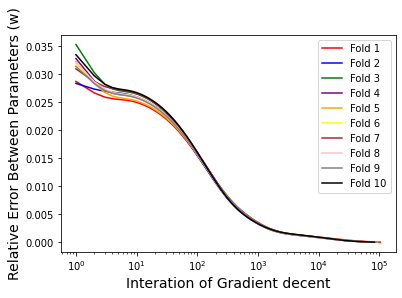

-------- Now testing learing rate is 0.5--------
No.1 fold start
interations  131098
No.2 fold start
interations  106202
No.3 fold start
interations  102854
No.4 fold start
interations  105001
No.5 fold start
interations  119582
No.6 fold start
interations  101586
No.7 fold start
interations  98960
No.8 fold start
interations  95219
No.9 fold start
interations  106633
No.10 fold start
interations  102161
Average Accuracy --> 0.7261455525606468


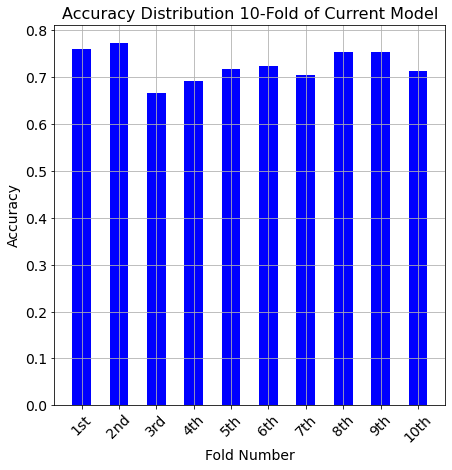

<Figure size 504x504 with 0 Axes>

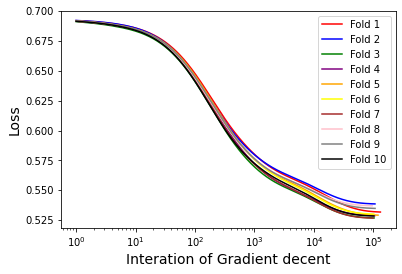

<Figure size 504x504 with 0 Axes>

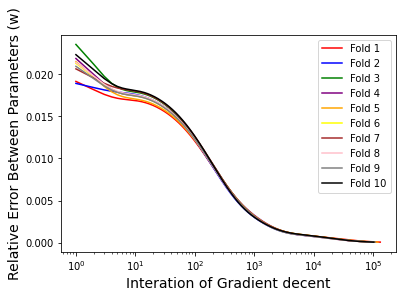

-------- Now testing learing rate is 0.25--------
No.1 fold start
interations  181899
No.2 fold start
interations  144747
No.3 fold start
interations  141597
No.4 fold start
interations  140460
No.5 fold start
interations  166459
No.6 fold start
interations  142386
No.7 fold start
interations  140073
No.8 fold start
interations  132034
No.9 fold start
interations  142543
No.10 fold start
interations  139468
Average Accuracy --> 0.7261118598382749


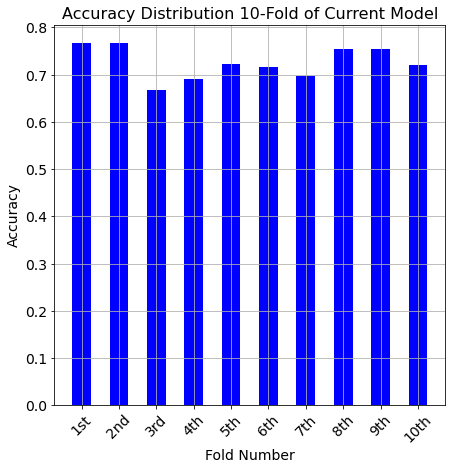

<Figure size 504x504 with 0 Axes>

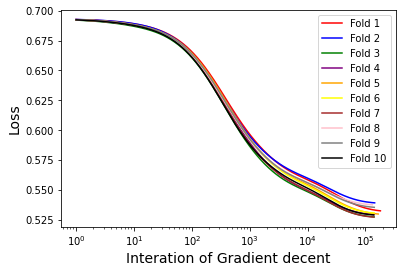

<Figure size 504x504 with 0 Axes>

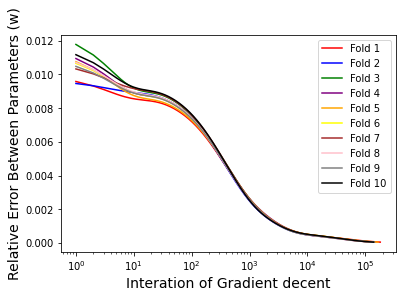

-------- Now testing learing rate is 0.1--------
No.1 fold start
interations  221264
No.2 fold start
interations  181825
No.3 fold start
interations  180000
No.4 fold start
interations  174017
No.5 fold start
interations  201607
No.6 fold start
interations  185478
No.7 fold start
interations  183104
No.8 fold start
interations  167022
No.9 fold start
interations  178528
No.10 fold start
interations  180183
Average Accuracy --> 0.7223382749326145


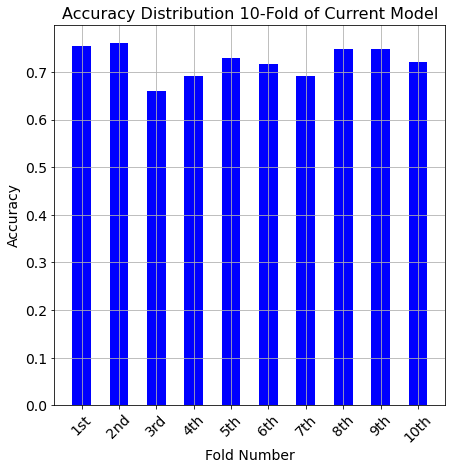

<Figure size 504x504 with 0 Axes>

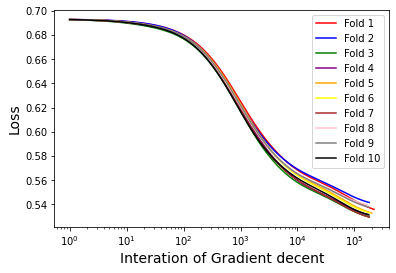

<Figure size 504x504 with 0 Axes>

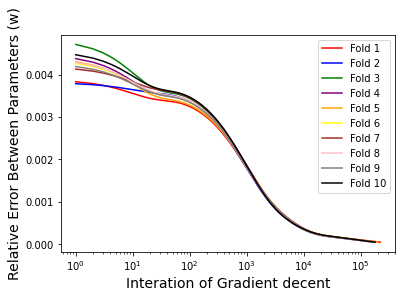

-------- Now testing learing rate is 0.05--------
No.1 fold start
interations  187585
No.2 fold start
interations  164278
No.3 fold start
interations  168154
No.4 fold start
interations  162501
No.5 fold start
interations  180699
No.6 fold start
interations  176108
No.7 fold start
interations  175258
No.8 fold start
interations  154176
No.9 fold start
interations  164849
No.10 fold start
interations  175031
Average Accuracy --> 0.7198225516621742


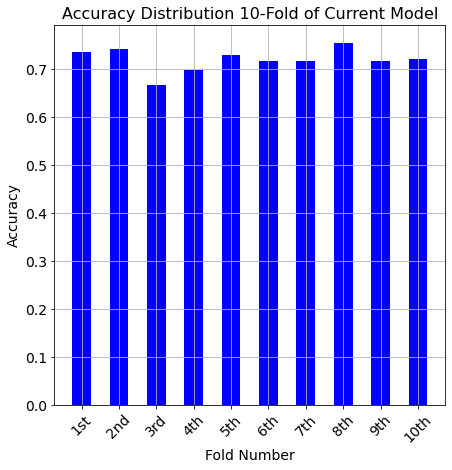

<Figure size 504x504 with 0 Axes>

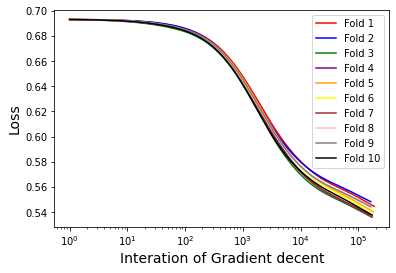

<Figure size 504x504 with 0 Axes>

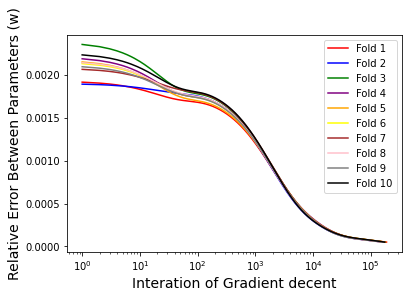

-------- Now testing learing rate is 0.025--------
No.1 fold start
interations  85649
No.2 fold start
interations  82810
No.3 fold start
interations  85529
No.4 fold start
interations  88566
No.5 fold start
interations  90221
No.6 fold start
interations  92542
No.7 fold start
interations  92447
No.8 fold start
interations  82976
No.9 fold start
interations  83022
No.10 fold start
interations  92342
Average Accuracy --> 0.7160489667565139


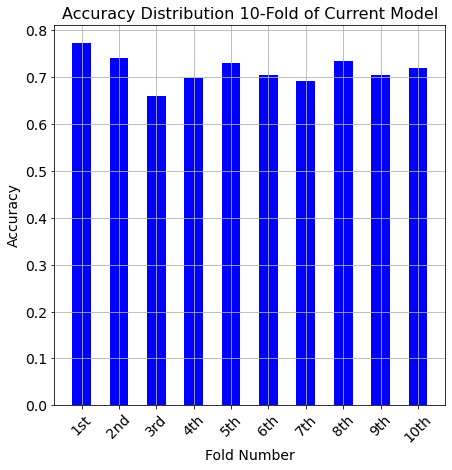

<Figure size 504x504 with 0 Axes>

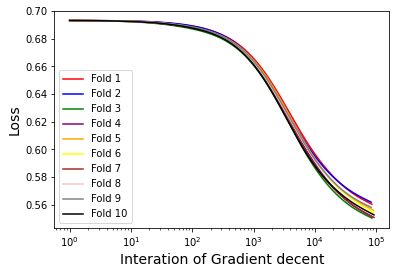

<Figure size 504x504 with 0 Axes>

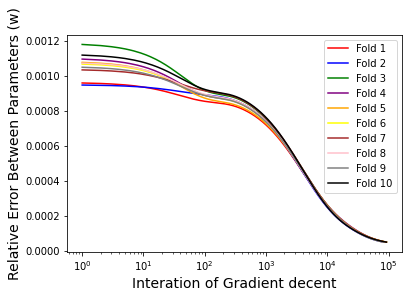

In [31]:
## Running for Removing Alcohol feature
print('-------- Remove Data Test3 Start --------')
# create list to save data
remove3_order2_accur=[]
remove3_order2_iteration=[]
# Load data again
wine_df = pd.read_csv('White_wine Quality.csv')
# remove one feature that have relatively high correlation to 3 other features -----> Alcohol
X_wine = wine_df[['Malic acid', 'Ash', 'Alkalinity of ash', 'Magnesium', 'Total phenols', 'Flavanoids', 'Nonflavanoid phenols', 'Proanthocyanins', 'Hue']].to_numpy()
y_wine = wine_df['quality label'].to_numpy()
# shuffling data
X_wine, y_wine = shuffle(X_wine,y_wine)
# Test in linear order 2
#X_wine = featureStandardization(X_wine)
X_wine = changeModelOrder(2, X_wine)
## testing 7 different learning rates
learn_test = learn_para 
#--- setting decay rate 0.000001 ---
#--- when iterations up to 10^6, the learning rate will be 1/2*learning rate, and up to 10^7 will be ~1/10*learning rate --- 
for learn in learn_test:
  print('-------- Now testing learing rate is ' + str(learn) + '--------')
  all_acu, all_err, all_losses, all_interation = validation(k = 10,X = X_wine,y = y_wine, stop_threshold = 0.00005, learning_rate=learn, decay_rate = 0.000001)
  plot_results(all_acu, all_err, all_losses, all_interation)
  remove3_order2_accur.append(sum(all_acu)/10)
  remove3_order2_iteration.append(sum(all_interation)/10)

Test 6. use log transform to make the distribution has less skewness for some features

-------- log transform Data Test Start --------


<ipython-input-32-a3bcdbbca927>:15: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  temp.hist(bins=100, ax=ax)


The order of the linear model is now: 2
The shape of X ---> 1599x20
-------- Now testing learing rate is 1--------
No.1 fold start
interations  29668
No.2 fold start
interations  29099
No.3 fold start
interations  30028
No.4 fold start
interations  30880
No.5 fold start
interations  29899
No.6 fold start
interations  30443
No.7 fold start
interations  29902
No.8 fold start
interations  29036
No.9 fold start
interations  31089
No.10 fold start
interations  30441
Average Accuracy --> 0.7366352201257861


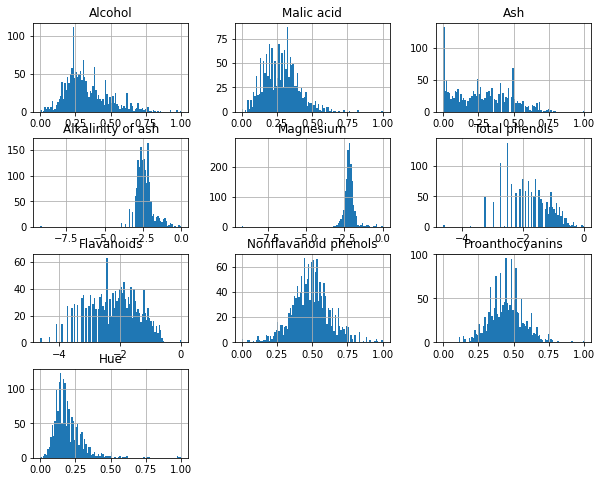

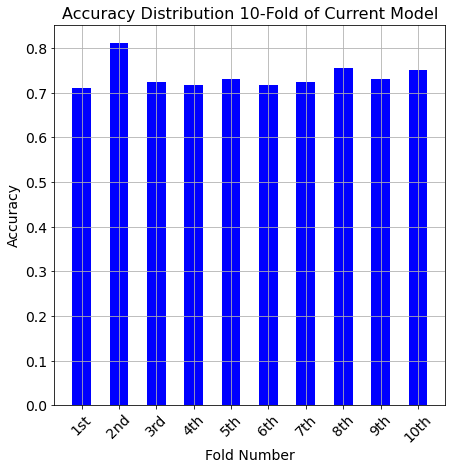

<Figure size 504x504 with 0 Axes>

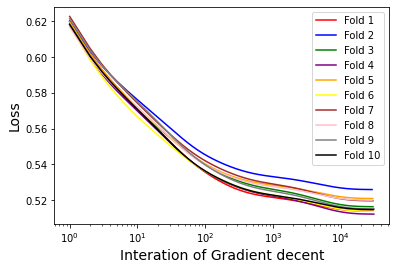

<Figure size 504x504 with 0 Axes>

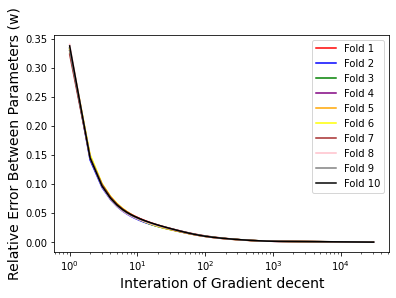

-------- Now testing learing rate is 0.75--------
No.1 fold start
interations  36098
No.2 fold start
interations  35422
No.3 fold start
interations  36676
No.4 fold start
interations  37728
No.5 fold start
interations  36400
No.6 fold start
interations  37147
No.7 fold start
interations  36512
No.8 fold start
interations  35354
No.9 fold start
interations  37964
No.10 fold start
interations  37060
Average Accuracy --> 0.7366352201257861


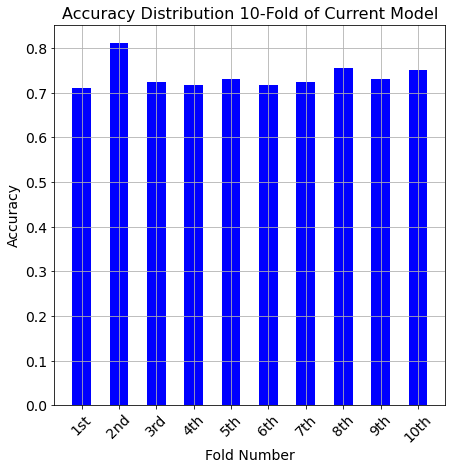

<Figure size 504x504 with 0 Axes>

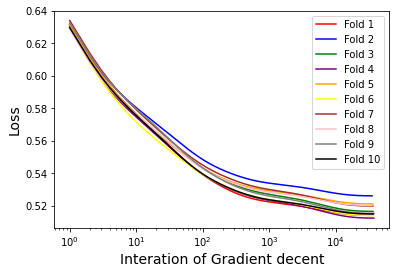

<Figure size 504x504 with 0 Axes>

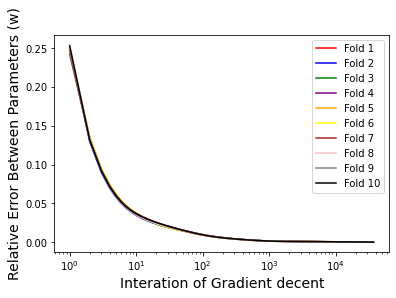

-------- Now testing learing rate is 0.5--------
No.1 fold start
interations  46804
No.2 fold start
interations  45953
No.3 fold start
interations  47879
No.4 fold start
interations  49275
No.5 fold start
interations  47231
No.6 fold start
interations  48406
No.7 fold start
interations  47639
No.8 fold start
interations  45894
No.9 fold start
interations  49539
No.10 fold start
interations  48096
Average Accuracy --> 0.736006289308176


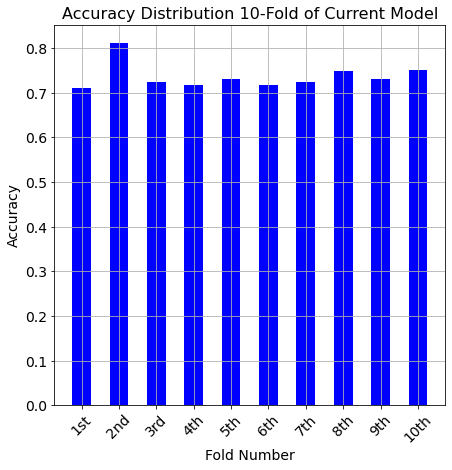

<Figure size 504x504 with 0 Axes>

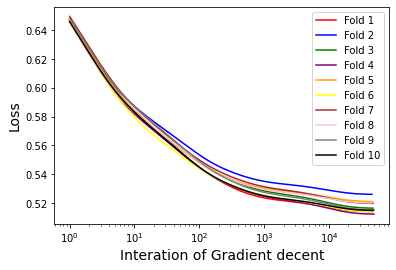

<Figure size 504x504 with 0 Axes>

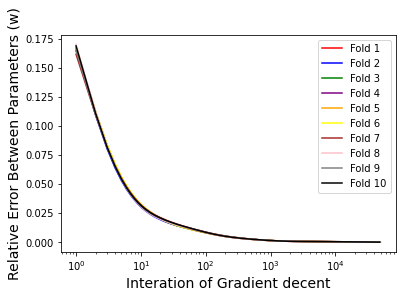

-------- Now testing learing rate is 0.25--------
No.1 fold start
interations  68269
No.2 fold start
interations  67049
No.3 fold start
interations  71140
No.4 fold start
interations  73291
No.5 fold start
interations  68940
No.6 fold start
interations  71529
No.7 fold start
interations  70669
No.8 fold start
interations  67133
No.9 fold start
interations  73495
No.10 fold start
interations  70316
Average Accuracy --> 0.7397124887690926


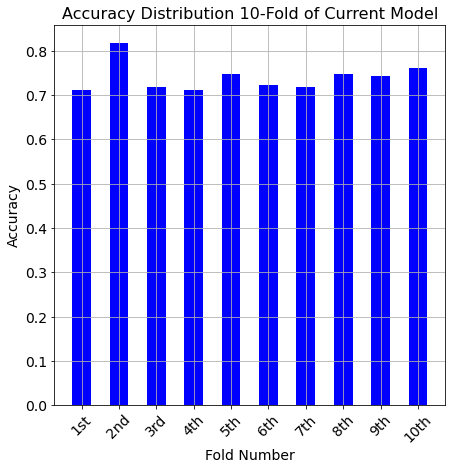

<Figure size 504x504 with 0 Axes>

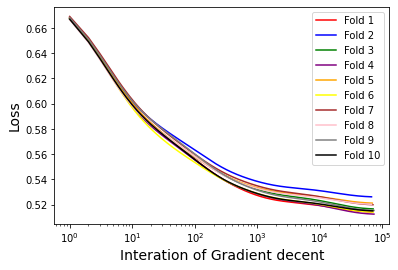

<Figure size 504x504 with 0 Axes>

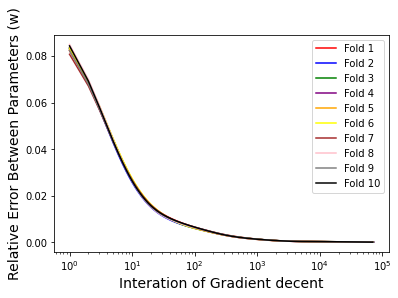

-------- Now testing learing rate is 0.1--------
No.1 fold start
interations  86390
No.2 fold start
interations  84115
No.3 fold start
interations  95719
No.4 fold start
interations  98777
No.5 fold start
interations  86498
No.6 fold start
interations  94103
No.7 fold start
interations  94480
No.8 fold start
interations  85446
No.9 fold start
interations  98200
No.10 fold start
interations  89435
Average Accuracy --> 0.7378593890386342


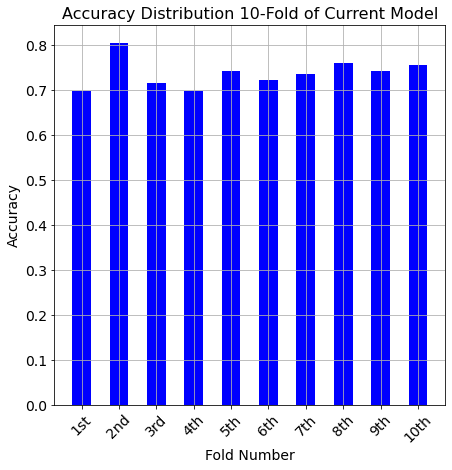

<Figure size 504x504 with 0 Axes>

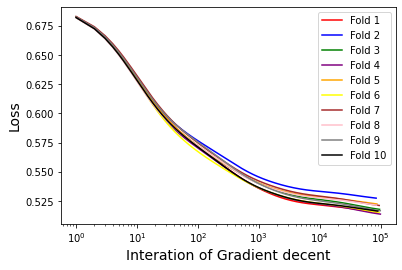

<Figure size 504x504 with 0 Axes>

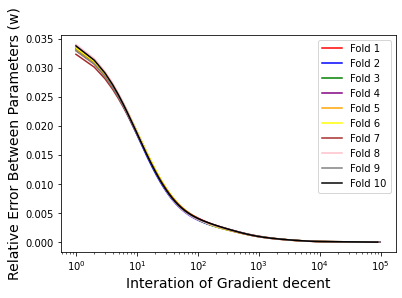

-------- Now testing learing rate is 0.05--------
No.1 fold start
interations  51367
No.2 fold start
interations  46050
No.3 fold start
interations  71627
No.4 fold start
interations  73655
No.5 fold start
interations  47240
No.6 fold start
interations  63932
No.7 fold start
interations  68808
No.8 fold start
interations  50972
No.9 fold start
interations  71247
No.10 fold start
interations  53341
Average Accuracy --> 0.7377920035938904


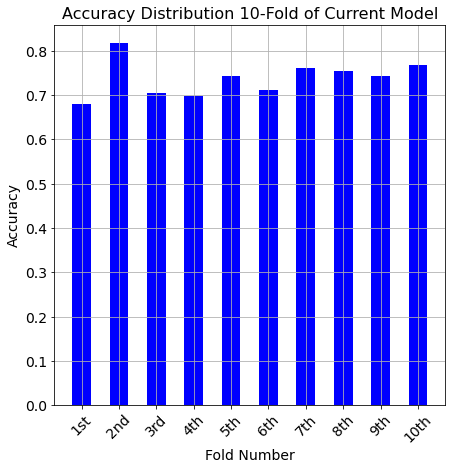

<Figure size 504x504 with 0 Axes>

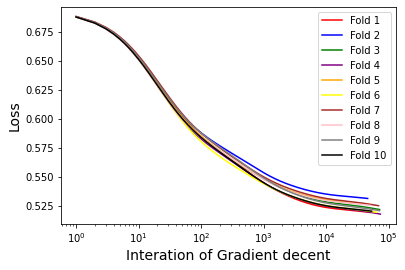

<Figure size 504x504 with 0 Axes>

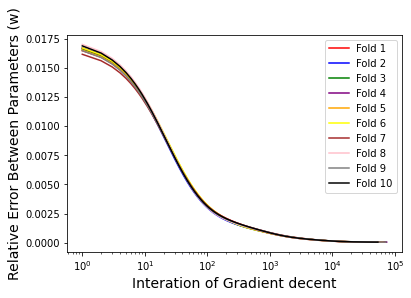

-------- Now testing learing rate is 0.025--------
No.1 fold start
interations  26906
No.2 fold start
interations  26379
No.3 fold start
interations  28879
No.4 fold start
interations  29518
No.5 fold start
interations  25939
No.6 fold start
interations  28838
No.7 fold start
interations  28433
No.8 fold start
interations  26660
No.9 fold start
interations  29740
No.10 fold start
interations  28252
Average Accuracy --> 0.7316374663072776


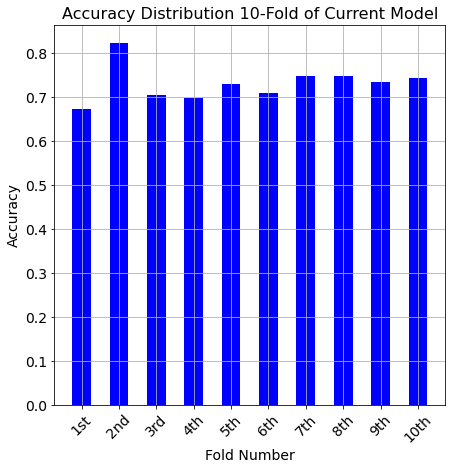

<Figure size 504x504 with 0 Axes>

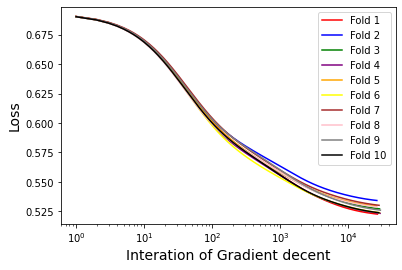

<Figure size 504x504 with 0 Axes>

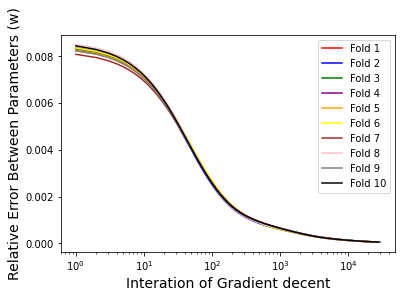

In [32]:
## Running for the log transformr data
print('-------- log transform Data Test Start --------')
# create list to save data
remove4_order2_accur=[]
remove4_order2_iteration=[]
# Load data again
wine_df = pd.read_csv('White_wine Quality.csv')
wine_df[['Alkalinity of ash', 'Magnesium']] = wine_df[['Alkalinity of ash', 'Magnesium']] + 0.0001
wine_df[['Alkalinity of ash', 'Magnesium']] = wine_df[['Alkalinity of ash', 'Magnesium']].apply(np.log)
wine_df[['Total phenols', 'Flavanoids']] = wine_df[['Total phenols', 'Flavanoids']] + 0.01
wine_df[['Total phenols', 'Flavanoids']] = wine_df[['Total phenols', 'Flavanoids']].apply(np.log)
# check again hist plot
fig, ax = plt.subplots(figsize=(10, 8))
temp = wine_df.drop('quality label', axis=1)
temp.hist(bins=100, ax=ax)
fig.show()
#
X_wine = wine_df[['Alcohol', 'Malic acid', 'Ash', 'Alkalinity of ash', 'Magnesium', 'Total phenols', 'Flavanoids', 'Nonflavanoid phenols', 'Proanthocyanins', 'Hue']].to_numpy()
y_wine = wine_df['quality label'].to_numpy()
# shuffling data
X_wine, y_wine = shuffle(X_wine,y_wine)
# Test in linear order 2
X_wine = changeModelOrder(2, X_wine)
X_wine = featureStandardization(X_wine)
## testing 7 different learning rates
learn_test = learn_para 
#--- setting decay rate 0.000001 ---
#--- when iterations up to 10^6, the learning rate will be 1/2*learning rate, and up to 10^7 will be ~1/10*learning rate --- 
for learn in learn_test:
  print('-------- Now testing learing rate is ' + str(learn) + '--------')
  all_acu, all_err, all_losses, all_interation = validation(k = 10,X = X_wine,y = y_wine, stop_threshold = 0.00005, learning_rate=learn, decay_rate = 0.000001)
  plot_results(all_acu, all_err, all_losses, all_interation)
  remove4_order2_accur.append(sum(all_acu)/10)
  remove4_order2_iteration.append(sum(all_interation)/10)

Plot the Second model result

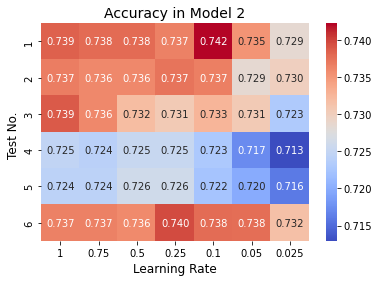

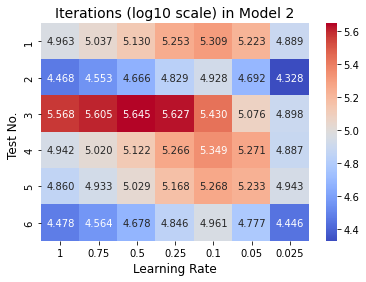

In [33]:
acc = np.array([raw_order2_accur, std_order2_accur, remove_order2_accur,remove2_order2_accur,remove3_order2_accur,remove4_order2_accur])
xticklabels = ['1', '0.75', '0.5', '0.25', '0.1', '0.05', '0.025']
yticklabels = ['1', '2', '3', '4', '5', '6']
ax = sns.heatmap(acc, annot=True, fmt='.3f', xticklabels=xticklabels, yticklabels=yticklabels, cmap='coolwarm')
ax.set_xlabel('Learning Rate', fontsize=12)
ax.set_ylabel('Test No. ', fontsize=12)
ax.set_title("Accuracy in Model 2", fontsize=14)
plt.show()

time = np.log10(np.array([raw_order2_iteration,std_order2_iteration,remove_order2_iteration,remove2_order2_iteration,remove3_order2_iteration,remove4_order2_iteration]))
xticklabels = ['1', '0.75', '0.5', '0.25', '0.1', '0.05', '0.025']
yticklabels = ['1', '2', '3', '4', '5', '6']
ax = sns.heatmap(time, annot=True, fmt='.3f', xticklabels=xticklabels, yticklabels=yticklabels, cmap='coolwarm')
ax.set_xlabel('Learning Rate', fontsize=12)
ax.set_ylabel('Test No. ', fontsize=12)
ax.set_title("Iterations (log10 scale) in Model 2", fontsize=14)
plt.show()

-------- Model 3 (polynomial order 3)-------  stop_thresold increase to 0.0001 because of features increase

Testing 1. Raw data

-------- Raw Data Test Start --------
The order of the linear model is now: 3
The shape of X ---> 1599x40
-------- Now testing learing rate is 1--------
No.1 fold start
interations  178169
No.2 fold start
interations  193126
No.3 fold start
interations  229145
No.4 fold start
interations  191150
No.5 fold start
interations  197006
No.6 fold start
interations  210121
No.7 fold start
interations  220637
No.8 fold start
interations  167796
No.9 fold start
interations  209443
No.10 fold start
interations  175393
Average Accuracy --> 0.7340858041329739


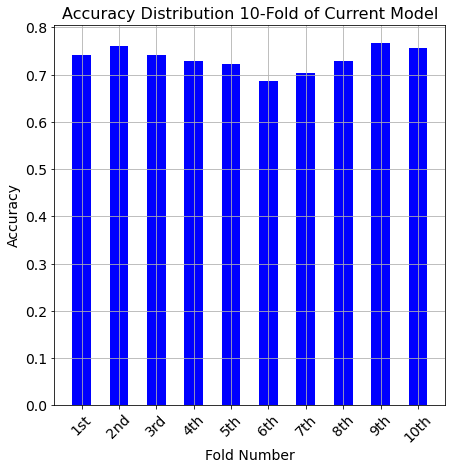

<Figure size 504x504 with 0 Axes>

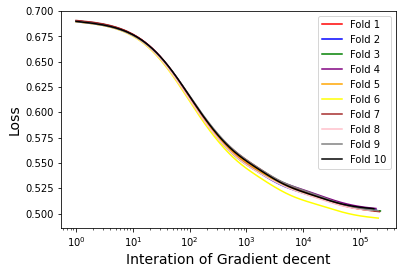

<Figure size 504x504 with 0 Axes>

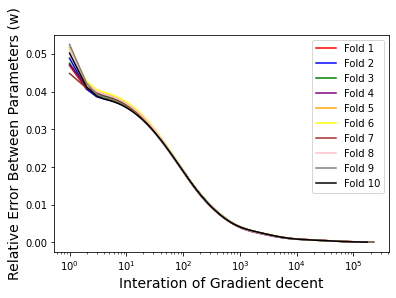

-------- Now testing learing rate is 0.75--------
No.1 fold start
interations  175993
No.2 fold start
interations  179217
No.3 fold start
interations  197198
No.4 fold start
interations  184059
No.5 fold start
interations  182588
No.6 fold start
interations  187424
No.7 fold start
interations  200927
No.8 fold start
interations  166424
No.9 fold start
interations  199095
No.10 fold start
interations  165904
Average Accuracy --> 0.7366015274034142


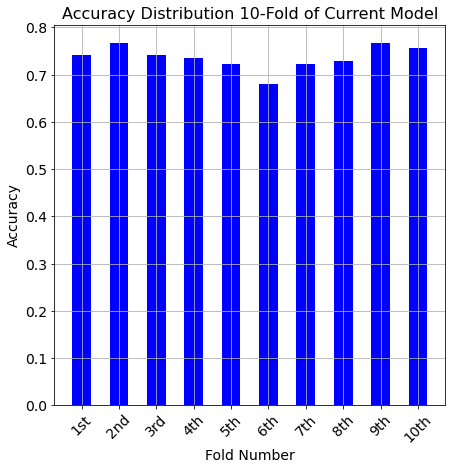

<Figure size 504x504 with 0 Axes>

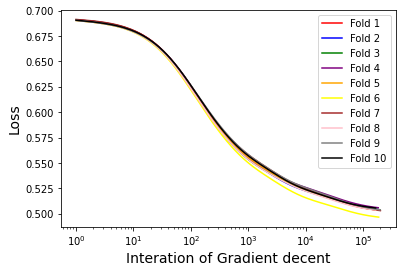

<Figure size 504x504 with 0 Axes>

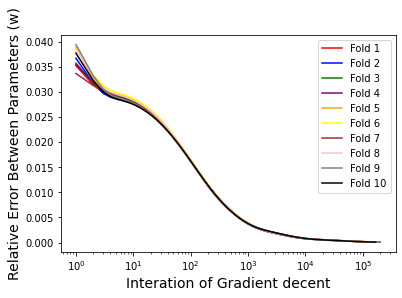

-------- Now testing learing rate is 0.5--------
No.1 fold start
interations  176694
No.2 fold start
interations  169100
No.3 fold start
interations  173436
No.4 fold start
interations  179045
No.5 fold start
interations  173438
No.6 fold start
interations  179161
No.7 fold start
interations  185232
No.8 fold start
interations  167371
No.9 fold start
interations  190176
No.10 fold start
interations  162056
Average Accuracy --> 0.736039982030548


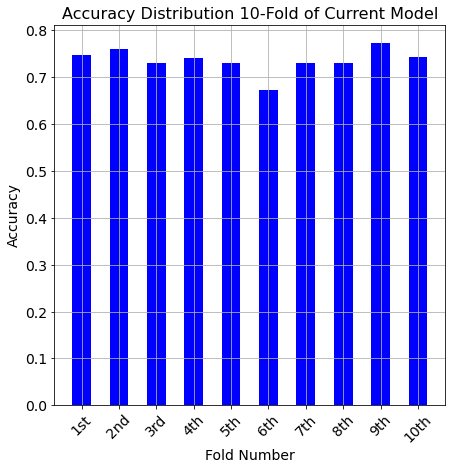

<Figure size 504x504 with 0 Axes>

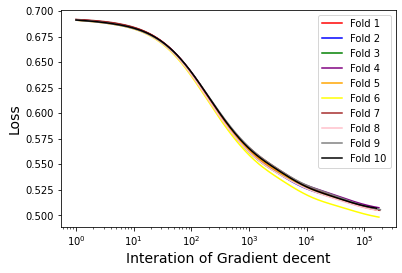

<Figure size 504x504 with 0 Axes>

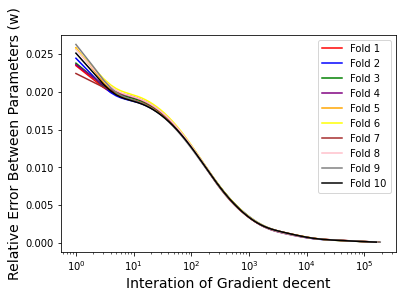

-------- Now testing learing rate is 0.25--------
No.1 fold start
interations  159152
No.2 fold start
interations  146472
No.3 fold start
interations  143349
No.4 fold start
interations  155730
No.5 fold start
interations  152418
No.6 fold start
interations  149796
No.7 fold start
interations  157954
No.8 fold start
interations  149073
No.9 fold start
interations  162865
No.10 fold start
interations  145214
Average Accuracy --> 0.7410714285714285


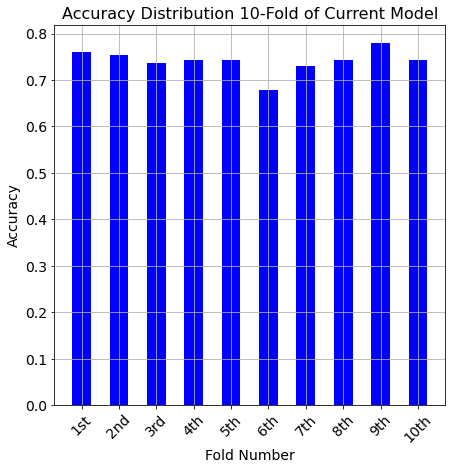

<Figure size 504x504 with 0 Axes>

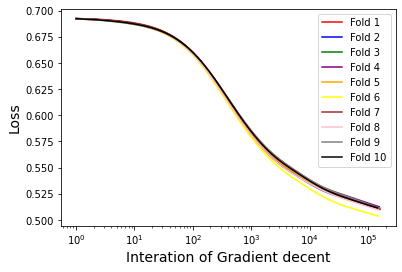

<Figure size 504x504 with 0 Axes>

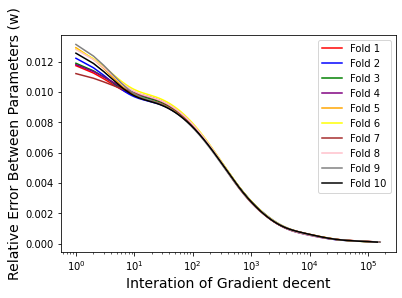

-------- Now testing learing rate is 0.1--------
No.1 fold start
interations  81857
No.2 fold start
interations  73307
No.3 fold start
interations  77609
No.4 fold start
interations  75082
No.5 fold start
interations  79986
No.6 fold start
interations  81905
No.7 fold start
interations  83854
No.8 fold start
interations  79712
No.9 fold start
interations  79766
No.10 fold start
interations  80356
Average Accuracy --> 0.7380615453728661


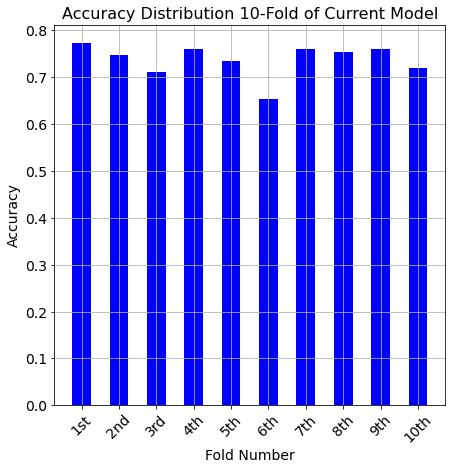

<Figure size 504x504 with 0 Axes>

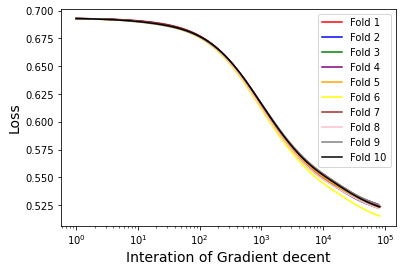

<Figure size 504x504 with 0 Axes>

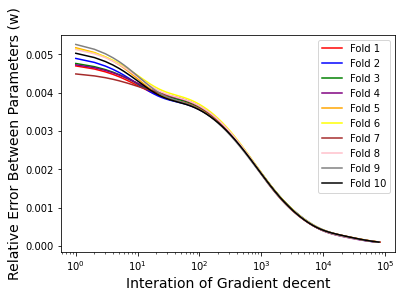

-------- Now testing learing rate is 0.05--------
No.1 fold start
interations  63177
No.2 fold start
interations  61263
No.3 fold start
interations  60169
No.4 fold start
interations  55908
No.5 fold start
interations  61640
No.6 fold start
interations  65505
No.7 fold start
interations  65456
No.8 fold start
interations  59761
No.9 fold start
interations  62447
No.10 fold start
interations  64565
Average Accuracy --> 0.7335579514824797


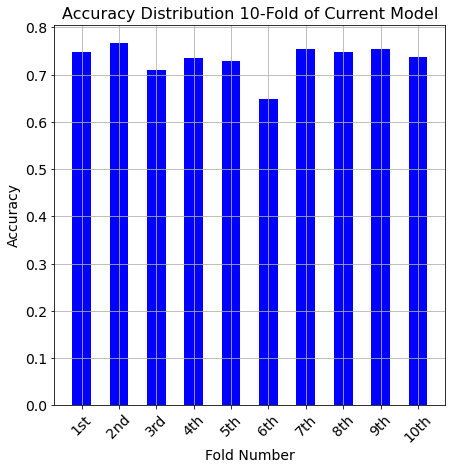

<Figure size 504x504 with 0 Axes>

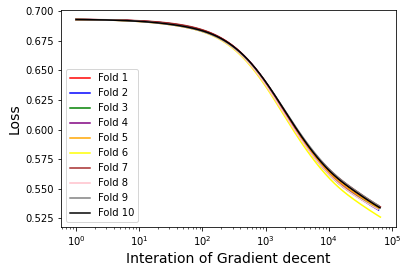

<Figure size 504x504 with 0 Axes>

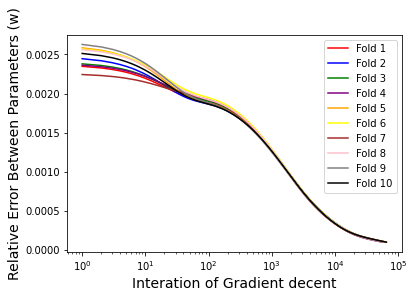

-------- Now testing learing rate is 0.025--------
No.1 fold start
interations  40030
No.2 fold start
interations  41770
No.3 fold start
interations  39327
No.4 fold start
interations  38434
No.5 fold start
interations  39945
No.6 fold start
interations  42022
No.7 fold start
interations  40400
No.8 fold start
interations  39952
No.9 fold start
interations  40730
No.10 fold start
interations  40408
Average Accuracy --> 0.7178683737646001


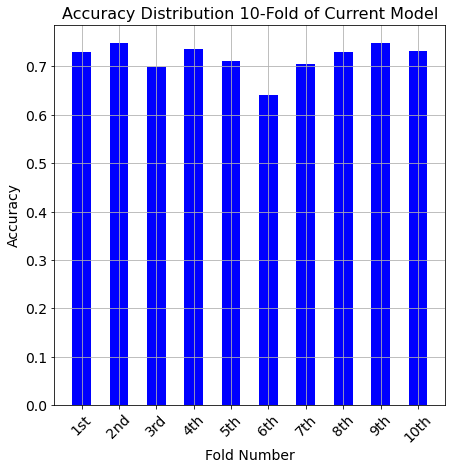

<Figure size 504x504 with 0 Axes>

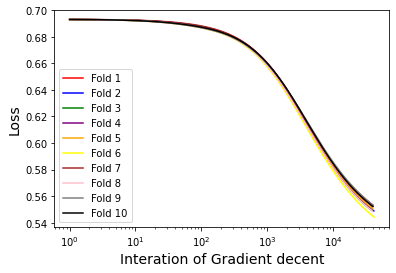

<Figure size 504x504 with 0 Axes>

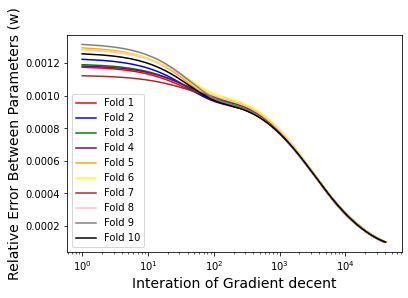

In [35]:
## Running for the raw data
print('-------- Raw Data Test Start --------')
# create list to save data
raw_order3_accur=[]
raw_order3_iteration=[]
# Load data again
wine_df = pd.read_csv('White_wine Quality.csv')
X_wine = wine_df[['Alcohol','Malic acid', 'Ash', 'Alkalinity of ash', 'Magnesium', 'Total phenols', 'Flavanoids', 'Nonflavanoid phenols', 'Proanthocyanins', 'Hue']].to_numpy()
y_wine = wine_df['quality label'].to_numpy()
# shuffling data
X_wine, y_wine = shuffle(X_wine,y_wine)
# Test in linear order 3
X_wine = changeModelOrder(3, X_wine)
## testing 7 different learning rates
learn_test = learn_para 
#--- setting decay rate 0.000001 ---
#--- when iterations up to 10^6, the learning rate will be 1/2*learning rate, and up to 10^7 for ~1/10*learning rate --- 
for learn in learn_test:
  print('-------- Now testing learing rate is ' + str(learn) + '--------')
  all_acu, all_err, all_losses, all_interation = validation(k = 10,X = X_wine,y = y_wine, stop_threshold = 0.0001, learning_rate=learn, decay_rate = 0.000001)
  plot_results(all_acu, all_err, all_losses, all_interation)
  raw_order3_accur.append(sum(all_acu)/10)
  raw_order3_iteration.append(sum(all_interation)/10)

Test 2. Standardization features

-------- Standardization Data Test Start --------
The order of the linear model is now: 3
The shape of X ---> 1599x40
-------- Now testing learing rate is 1--------
No.1 fold start
interations  116854
No.2 fold start
interations  137211
No.3 fold start
interations  114202
No.4 fold start
interations  120531
No.5 fold start
interations  116852
No.6 fold start
interations  111764
No.7 fold start
interations  144612
No.8 fold start
interations  154424
No.9 fold start
interations  115070
No.10 fold start
interations  106935
Average Accuracy --> 0.7258872416891284


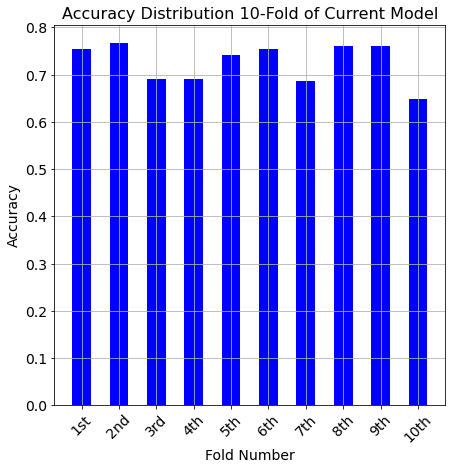

<Figure size 504x504 with 0 Axes>

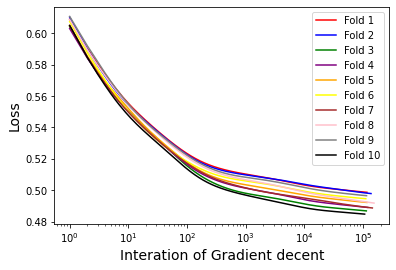

<Figure size 504x504 with 0 Axes>

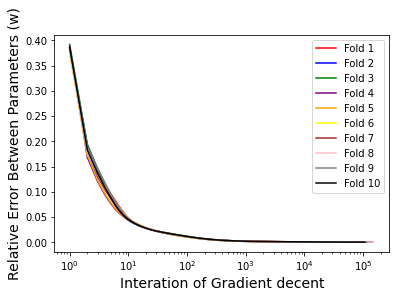

-------- Now testing learing rate is 0.75--------
No.1 fold start
interations  103454
No.2 fold start
interations  126443
No.3 fold start
interations  96587
No.4 fold start
interations  107502
No.5 fold start
interations  104641
No.6 fold start
interations  101042
No.7 fold start
interations  131714
No.8 fold start
interations  143896
No.9 fold start
interations  103964
No.10 fold start
interations  91626
Average Accuracy --> 0.7290655884995508


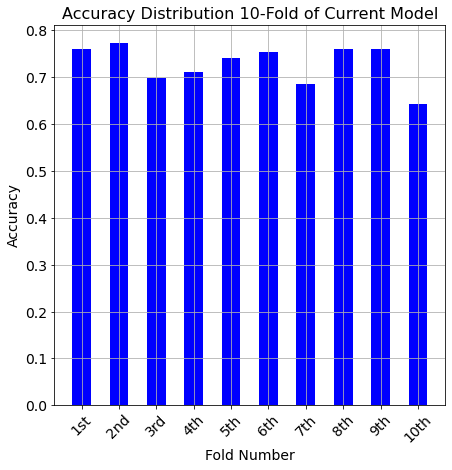

<Figure size 504x504 with 0 Axes>

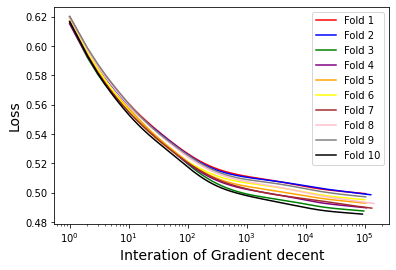

<Figure size 504x504 with 0 Axes>

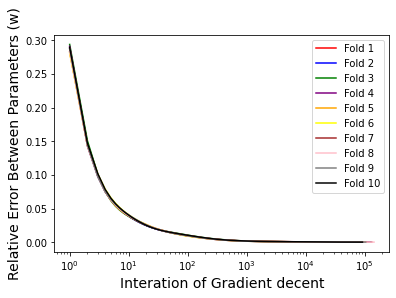

-------- Now testing learing rate is 0.5--------
No.1 fold start
interations  75205
No.2 fold start
interations  95518
No.3 fold start
interations  67093
No.4 fold start
interations  77532
No.5 fold start
interations  77684
No.6 fold start
interations  77632
No.7 fold start
interations  101759
No.8 fold start
interations  108041
No.9 fold start
interations  81922
No.10 fold start
interations  64929
Average Accuracy --> 0.7265835579514823


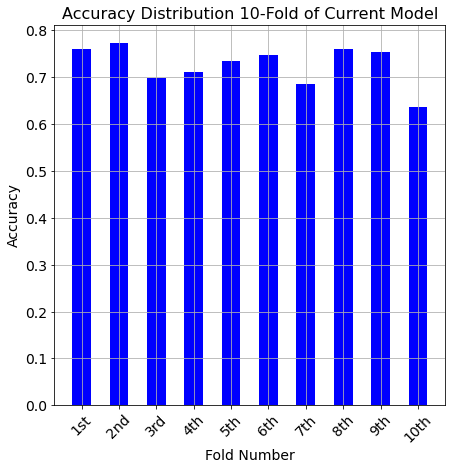

<Figure size 504x504 with 0 Axes>

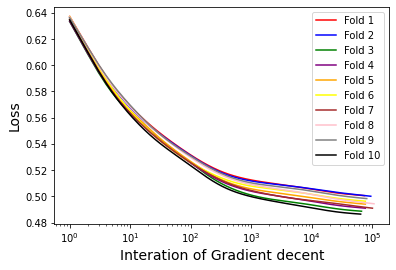

<Figure size 504x504 with 0 Axes>

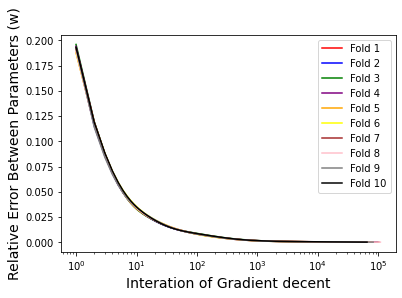

-------- Now testing learing rate is 0.25--------
No.1 fold start
interations  55812
No.2 fold start
interations  58498
No.3 fold start
interations  57970
No.4 fold start
interations  58075
No.5 fold start
interations  55599
No.6 fold start
interations  59105
No.7 fold start
interations  58124
No.8 fold start
interations  65394
No.9 fold start
interations  61894
No.10 fold start
interations  56508
Average Accuracy --> 0.7253256963162624


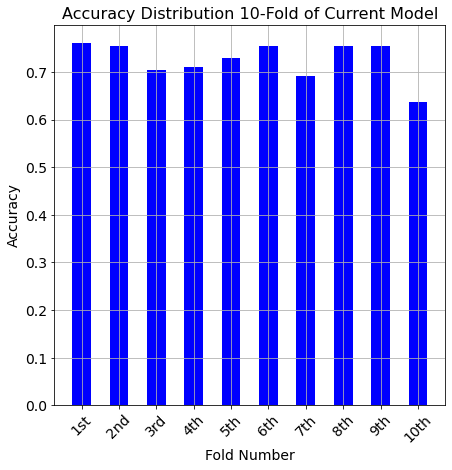

<Figure size 504x504 with 0 Axes>

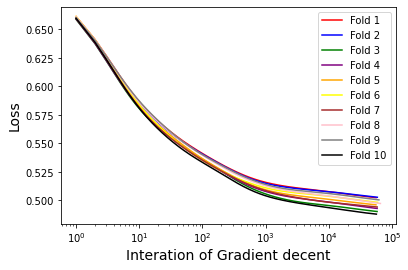

<Figure size 504x504 with 0 Axes>

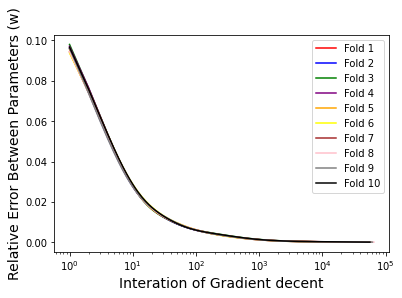

-------- Now testing learing rate is 0.1--------
No.1 fold start
interations  29152
No.2 fold start
interations  22723
No.3 fold start
interations  25806
No.4 fold start
interations  30951
No.5 fold start
interations  27170
No.6 fold start
interations  26267
No.7 fold start
interations  25502
No.8 fold start
interations  33084
No.9 fold start
interations  25533
No.10 fold start
interations  33066
Average Accuracy --> 0.7353548966756515


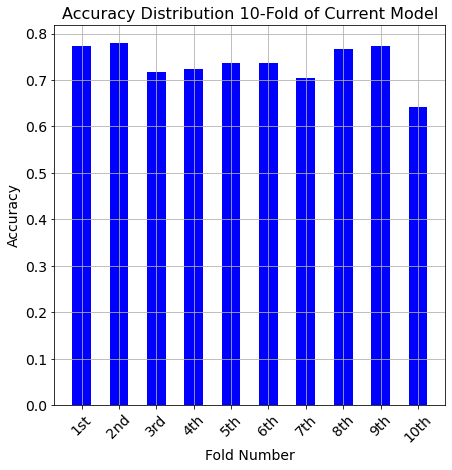

<Figure size 504x504 with 0 Axes>

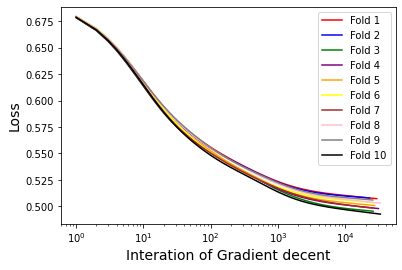

<Figure size 504x504 with 0 Axes>

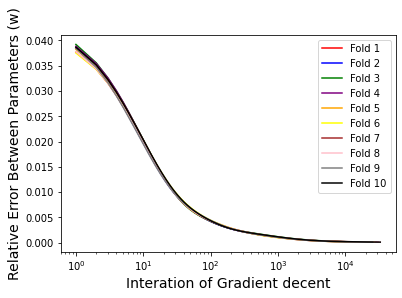

-------- Now testing learing rate is 0.05--------
No.1 fold start
interations  15178
No.2 fold start
interations  14050
No.3 fold start
interations  17531
No.4 fold start
interations  16594
No.5 fold start
interations  15254
No.6 fold start
interations  13598
No.7 fold start
interations  19281
No.8 fold start
interations  15721
No.9 fold start
interations  14226
No.10 fold start
interations  18623
Average Accuracy --> 0.730851302785265


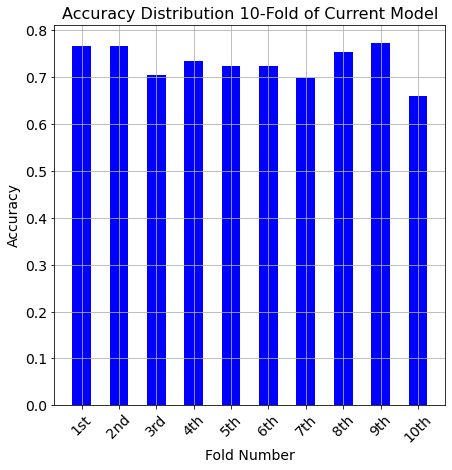

<Figure size 504x504 with 0 Axes>

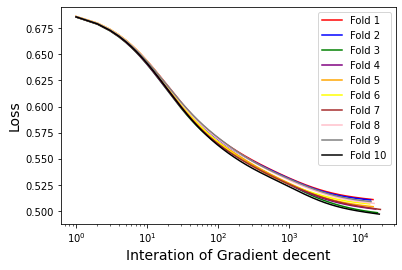

<Figure size 504x504 with 0 Axes>

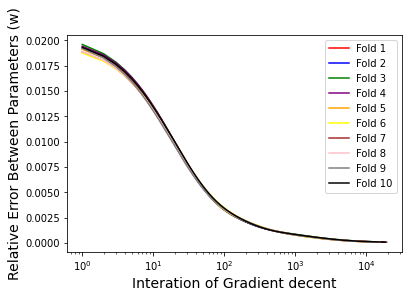

-------- Now testing learing rate is 0.025--------
No.1 fold start
interations  12660
No.2 fold start
interations  12466
No.3 fold start
interations  15514
No.4 fold start
interations  13995
No.5 fold start
interations  13239
No.6 fold start
interations  12492
No.7 fold start
interations  14410
No.8 fold start
interations  13459
No.9 fold start
interations  13459
No.10 fold start
interations  14533
Average Accuracy --> 0.7314802336028752


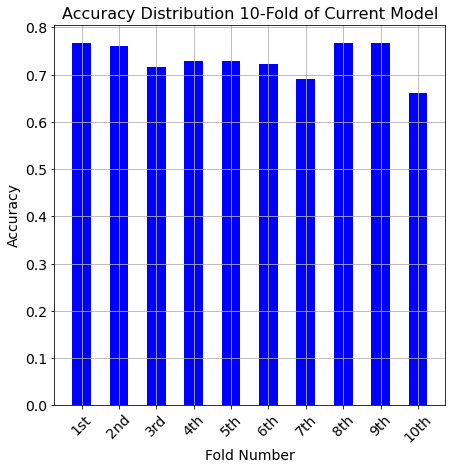

<Figure size 504x504 with 0 Axes>

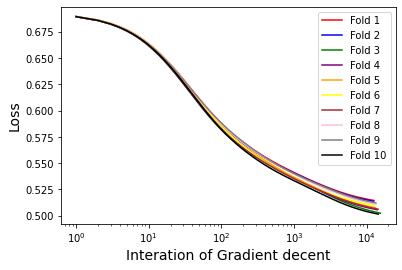

<Figure size 504x504 with 0 Axes>

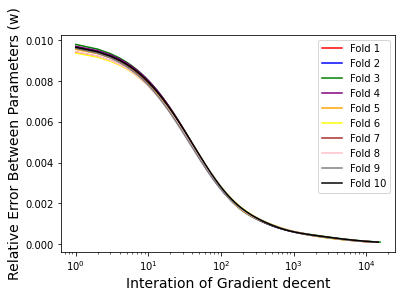

In [36]:
## Running for the Standardization data
print('-------- Standardization Data Test Start --------')
# create list to save data
std_order3_accur=[]
std_order3_iteration=[]
# Load data again
wine_df = pd.read_csv('White_wine Quality.csv')
X_wine = wine_df[['Alcohol','Malic acid', 'Ash', 'Alkalinity of ash', 'Magnesium', 'Total phenols', 'Flavanoids', 'Nonflavanoid phenols', 'Proanthocyanins', 'Hue']].to_numpy()
y_wine = wine_df['quality label'].to_numpy()
# shuffling data
X_wine, y_wine = shuffle(X_wine,y_wine)
# Test in linear order 3
X_wine = changeModelOrder(3, X_wine)
X_wine = featureStandardization(X_wine)
## testing 7 different learning rates
learn_test = learn_para 
#--- setting decay rate 0.000001 ---
#--- when iterations up to 10^6, the learning rate will be 1/2*learning rate, and up to 10^7 for ~1/10*learning rate --- 
for learn in learn_test:
  print('-------- Now testing learing rate is ' + str(learn) + '--------')
  all_acu, all_err, all_losses, all_interation = validation(k = 10,X = X_wine,y = y_wine, stop_threshold = 0.0001, learning_rate=learn, decay_rate = 0.000001)
  plot_results(all_acu, all_err, all_losses, all_interation)
  std_order3_accur.append(sum(all_acu)/10)
  std_order3_iteration.append(sum(all_interation)/10)

Test 3. Remove outliers

-------- Remove Outliers Data Test Start --------
The order of the linear model is now: 3
The shape of X ---> 1463x40
-------- Now testing learing rate is 1--------
No.1 fold start
interations  201146
No.2 fold start
interations  219313
No.3 fold start
interations  180469
No.4 fold start
interations  194139
No.5 fold start
interations  195977
No.6 fold start
interations  222843
No.7 fold start
interations  185456
No.8 fold start
interations  201547
No.9 fold start
interations  210148
No.10 fold start
interations  199746
Average Accuracy --> 0.7224556403420062


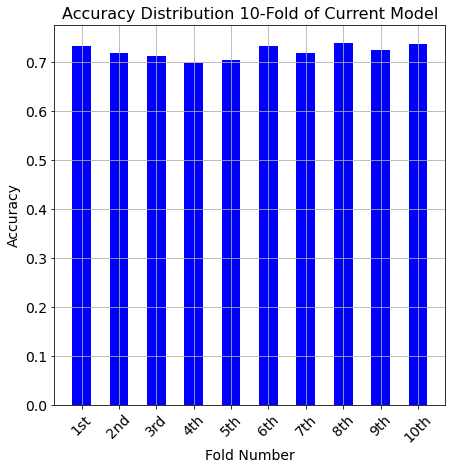

<Figure size 504x504 with 0 Axes>

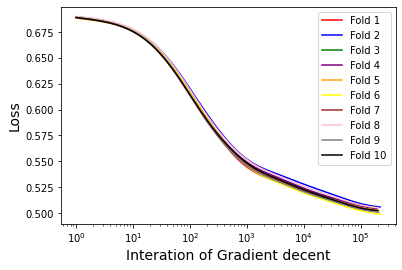

<Figure size 504x504 with 0 Axes>

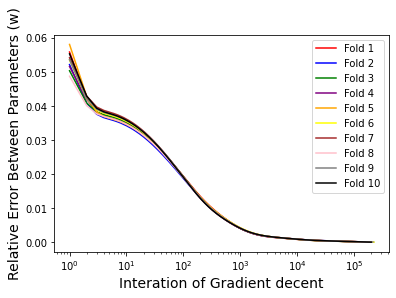

-------- Now testing learing rate is 0.75--------
No.1 fold start
interations  208243
No.2 fold start
interations  222346
No.3 fold start
interations  191188
No.4 fold start
interations  203347
No.5 fold start
interations  204663
No.6 fold start
interations  220291
No.7 fold start
interations  195804
No.8 fold start
interations  210410
No.9 fold start
interations  215014
No.10 fold start
interations  205896
Average Accuracy --> 0.7217569182679047


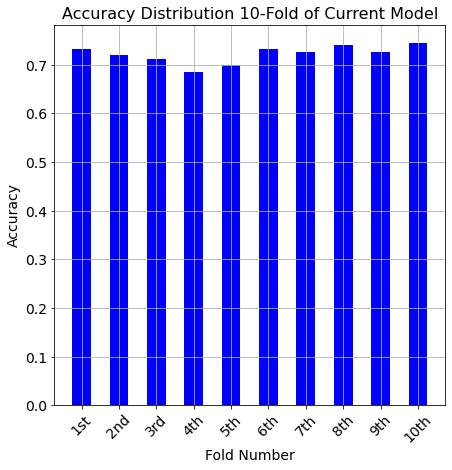

<Figure size 504x504 with 0 Axes>

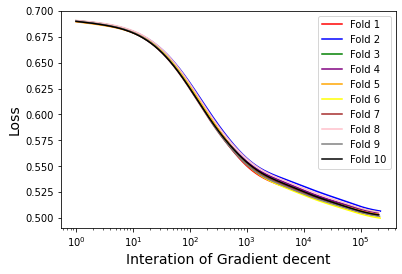

<Figure size 504x504 with 0 Axes>

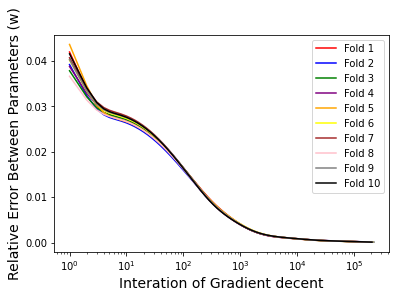

-------- Now testing learing rate is 0.5--------
No.1 fold start
interations  208658
No.2 fold start
interations  224070
No.3 fold start
interations  195438
No.4 fold start
interations  208668
No.5 fold start
interations  208377
No.6 fold start
interations  215601
No.7 fold start
interations  204272
No.8 fold start
interations  215330
No.9 fold start
interations  214133
No.10 fold start
interations  209658
Average Accuracy --> 0.7224280592075021


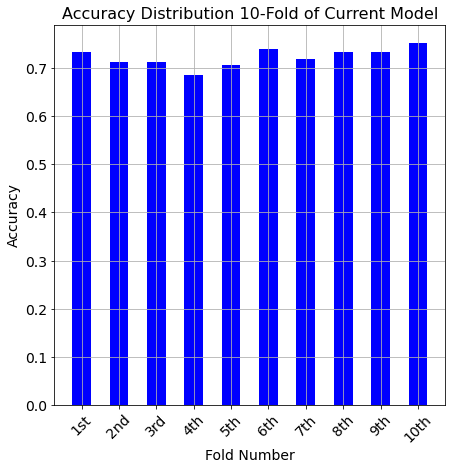

<Figure size 504x504 with 0 Axes>

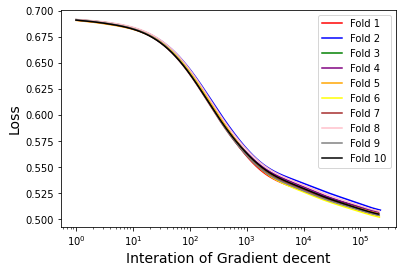

<Figure size 504x504 with 0 Axes>

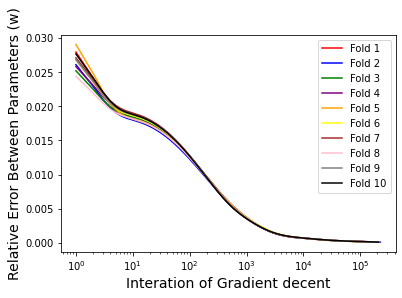

-------- Now testing learing rate is 0.25--------
No.1 fold start
interations  140740
No.2 fold start
interations  171448
No.3 fold start
interations  137038
No.4 fold start
interations  155272
No.5 fold start
interations  148167
No.6 fold start
interations  154639
No.7 fold start
interations  161618
No.8 fold start
interations  162691
No.9 fold start
interations  150899
No.10 fold start
interations  159428
Average Accuracy --> 0.7285510710673899


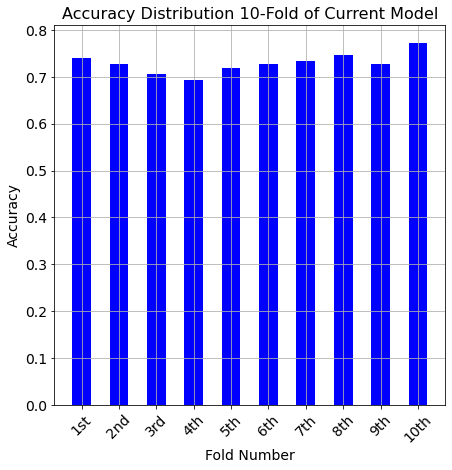

<Figure size 504x504 with 0 Axes>

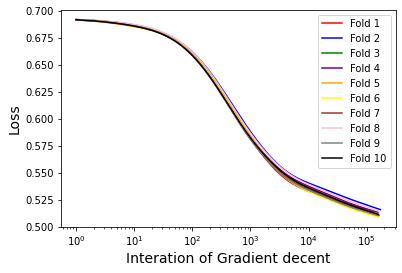

<Figure size 504x504 with 0 Axes>

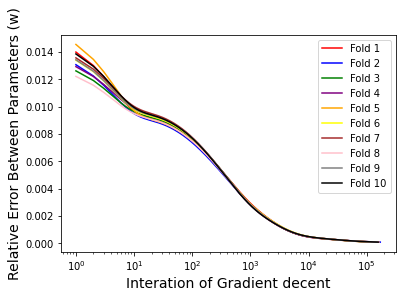

-------- Now testing learing rate is 0.1--------
No.1 fold start
interations  77751
No.2 fold start
interations  82235
No.3 fold start
interations  81674
No.4 fold start
interations  85933
No.5 fold start
interations  82048
No.6 fold start
interations  83103
No.7 fold start
interations  84177
No.8 fold start
interations  85341
No.9 fold start
interations  83465
No.10 fold start
interations  85224
Average Accuracy --> 0.7333455916153351


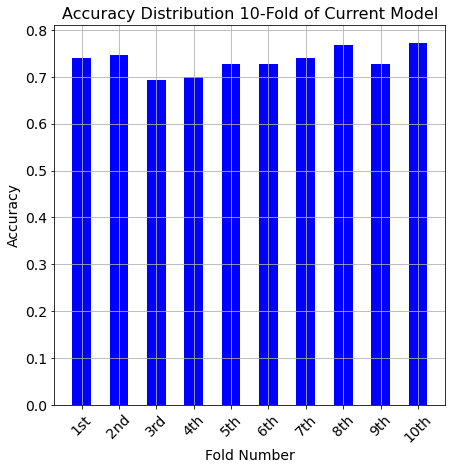

<Figure size 504x504 with 0 Axes>

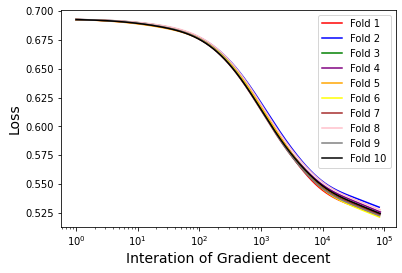

<Figure size 504x504 with 0 Axes>

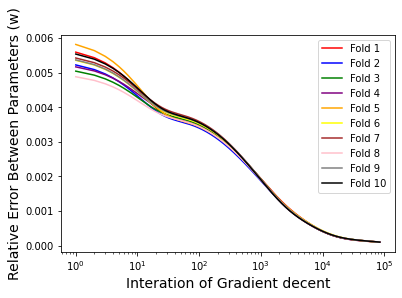

-------- Now testing learing rate is 0.05--------
No.1 fold start
interations  45091
No.2 fold start
interations  45557
No.3 fold start
interations  47977
No.4 fold start
interations  47367
No.5 fold start
interations  47367
No.6 fold start
interations  49569
No.7 fold start
interations  46595
No.8 fold start
interations  48514
No.9 fold start
interations  47916
No.10 fold start
interations  48604
Average Accuracy --> 0.7265100671140938


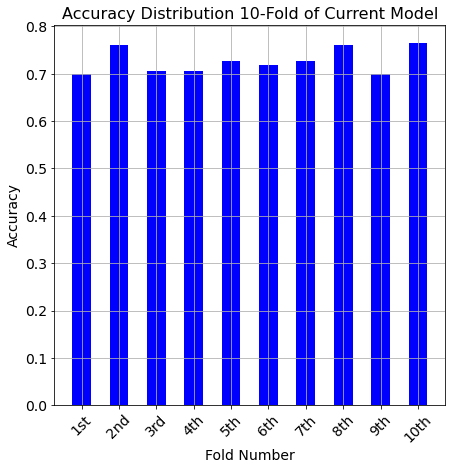

<Figure size 504x504 with 0 Axes>

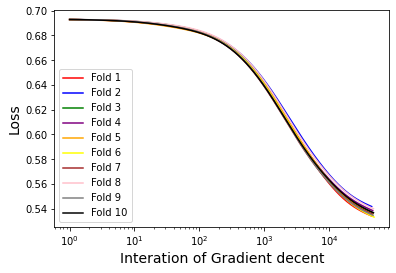

<Figure size 504x504 with 0 Axes>

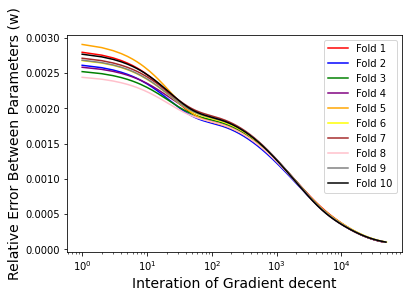

-------- Now testing learing rate is 0.025--------
No.1 fold start
interations  41361
No.2 fold start
interations  40957
No.3 fold start
interations  40775
No.4 fold start
interations  40109
No.5 fold start
interations  41930
No.6 fold start
interations  42671
No.7 fold start
interations  40242
No.8 fold start
interations  41346
No.9 fold start
interations  41122
No.10 fold start
interations  40931
Average Accuracy --> 0.713551530752965


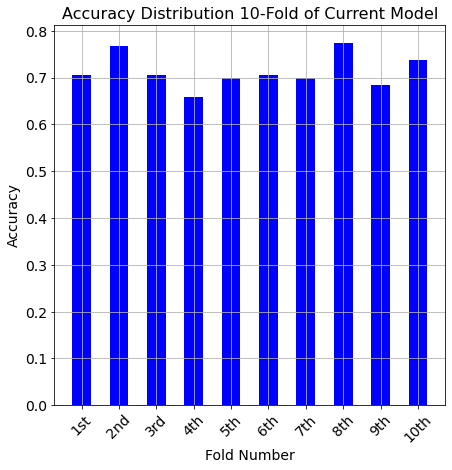

<Figure size 504x504 with 0 Axes>

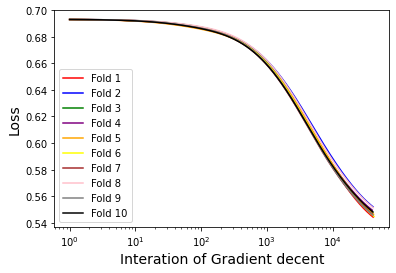

<Figure size 504x504 with 0 Axes>

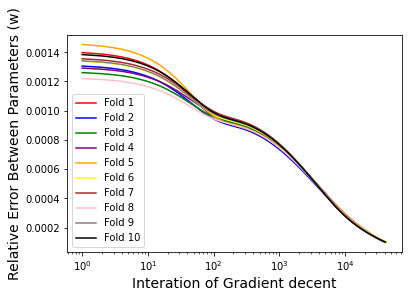

In [37]:
## Running for the remove outlier data
print('-------- Remove Outliers Data Test Start --------')
# create list to save data
remove_order3_accur=[]
remove_order3_iteration=[]
# Load data again
wine_df = pd.read_csv('White_wine Quality.csv')
columns = ['Alcohol', 'Malic acid', 'Ash', 'Alkalinity of ash', 'Magnesium', 'Total phenols', 'Flavanoids', 'Nonflavanoid phenols', 'Proanthocyanins', 'Hue']
# remove outlier in features
outliers = detect_outliers(wine_df, columns)
outliers = list(set(outliers))
wine_df = wine_df.drop(outliers)
X_wine = wine_df[['Alcohol','Malic acid', 'Ash', 'Alkalinity of ash', 'Magnesium', 'Total phenols', 'Flavanoids', 'Nonflavanoid phenols', 'Proanthocyanins', 'Hue']].to_numpy()
y_wine = wine_df['quality label'].to_numpy()
# shuffling data
X_wine, y_wine = shuffle(X_wine,y_wine)
# Test in linear order 3
#X_wine = featureStandardization(X_wine)
X_wine = changeModelOrder(3, X_wine)
## testing 7 different learning rates
learn_test = learn_para  
#--- setting decay rate 0.000001 ---
#--- when iterations up to 10^6, the learning rate will be 1/2*learning rate, and up to 10^7 will be ~1/10*learning rate --- 
for learn in learn_test:
  print('-------- Now testing learing rate is ' + str(learn) + '--------')
  all_acu, all_err, all_losses, all_interation = validation(k = 10,X = X_wine,y = y_wine, stop_threshold = 0.0001, learning_rate=learn, decay_rate = 0.000001)
  plot_results(all_acu, all_err, all_losses, all_interation)
  remove_order3_accur.append(sum(all_acu)/10)
  remove_order3_iteration.append(sum(all_interation)/10)

Test 4. Removing low correlation value between features and label

-------- Remove Data Test2 Start --------
The order of the linear model is now: 3
The shape of X ---> 1599x32
-------- Now testing learing rate is 1--------
No.1 fold start
interations  169397
No.2 fold start
interations  171926
No.3 fold start
interations  172710
No.4 fold start
interations  177394
No.5 fold start
interations  156853
No.6 fold start
interations  169860
No.7 fold start
interations  152512
No.8 fold start
interations  178497
No.9 fold start
interations  168638
No.10 fold start
interations  180031
Average Accuracy --> 0.7273023360287512


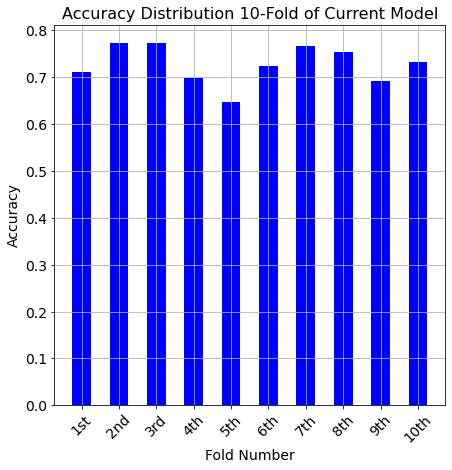

<Figure size 504x504 with 0 Axes>

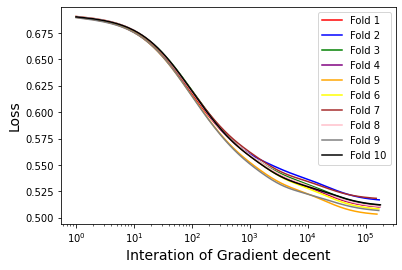

<Figure size 504x504 with 0 Axes>

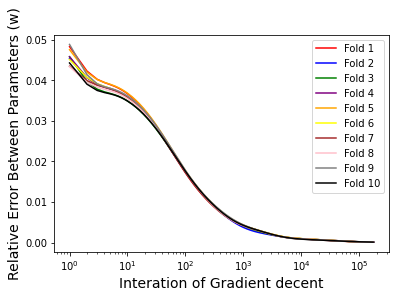

-------- Now testing learing rate is 0.75--------
No.1 fold start
interations  166038
No.2 fold start
interations  174721
No.3 fold start
interations  176517
No.4 fold start
interations  172508
No.5 fold start
interations  159105
No.6 fold start
interations  166176
No.7 fold start
interations  150966
No.8 fold start
interations  174549
No.9 fold start
interations  165019
No.10 fold start
interations  176553
Average Accuracy --> 0.7279312668463611


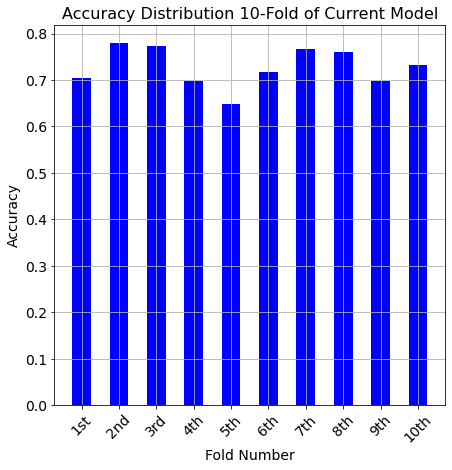

<Figure size 504x504 with 0 Axes>

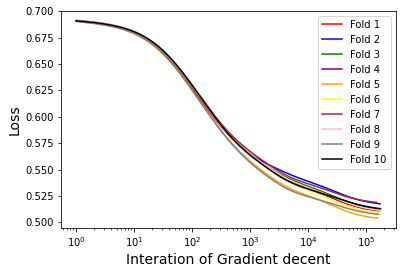

<Figure size 504x504 with 0 Axes>

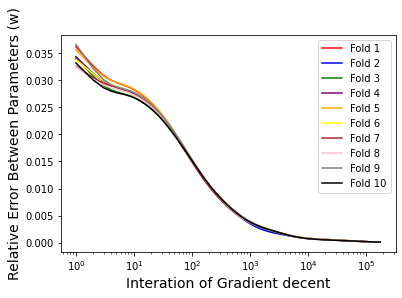

-------- Now testing learing rate is 0.5--------
No.1 fold start
interations  166793
No.2 fold start
interations  177695
No.3 fold start
interations  179537
No.4 fold start
interations  172281
No.5 fold start
interations  165623
No.6 fold start
interations  168393
No.7 fold start
interations  153475
No.8 fold start
interations  174739
No.9 fold start
interations  162792
No.10 fold start
interations  177026
Average Accuracy --> 0.7298180592991914


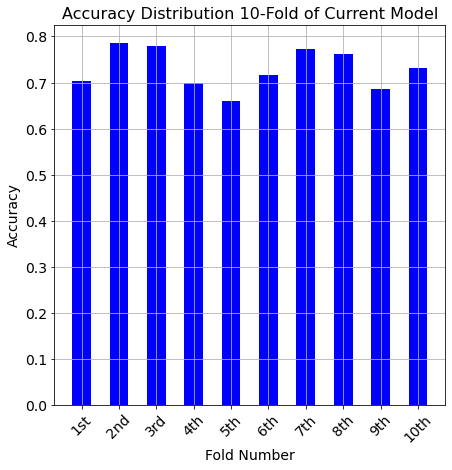

<Figure size 504x504 with 0 Axes>

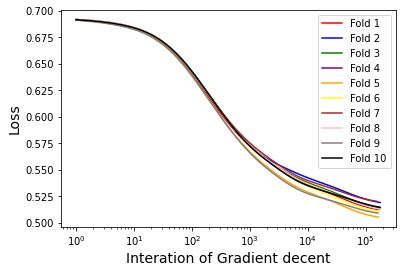

<Figure size 504x504 with 0 Axes>

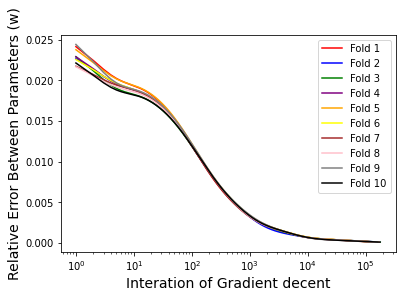

-------- Now testing learing rate is 0.25--------
No.1 fold start
interations  160226
No.2 fold start
interations  164764
No.3 fold start
interations  164281
No.4 fold start
interations  162561
No.5 fold start
interations  163334
No.6 fold start
interations  163002
No.7 fold start
interations  146383
No.8 fold start
interations  164667
No.9 fold start
interations  143002
No.10 fold start
interations  154018
Average Accuracy --> 0.7272686433063791


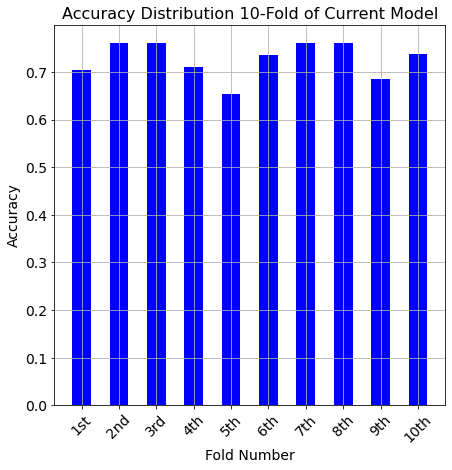

<Figure size 504x504 with 0 Axes>

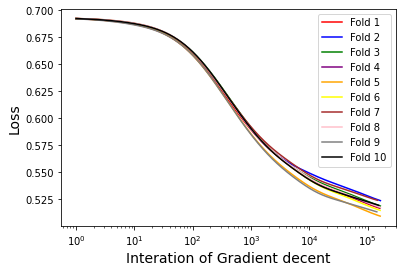

<Figure size 504x504 with 0 Axes>

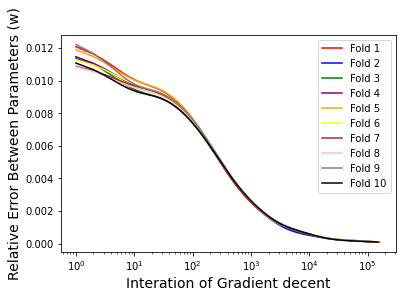

-------- Now testing learing rate is 0.1--------
No.1 fold start
interations  77876
No.2 fold start
interations  75786
No.3 fold start
interations  78533
No.4 fold start
interations  76035
No.5 fold start
interations  78755
No.6 fold start
interations  81052
No.7 fold start
interations  70195
No.8 fold start
interations  77185
No.9 fold start
interations  66492
No.10 fold start
interations  71283
Average Accuracy --> 0.7185646900269542


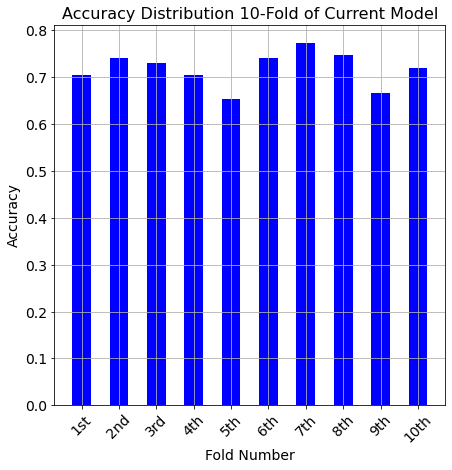

<Figure size 504x504 with 0 Axes>

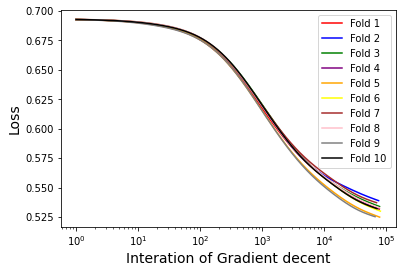

<Figure size 504x504 with 0 Axes>

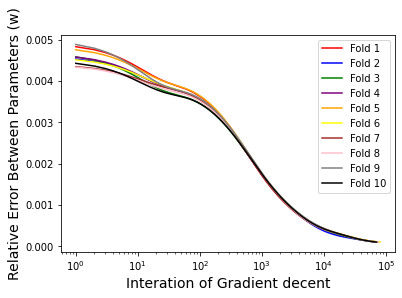

-------- Now testing learing rate is 0.05--------
No.1 fold start
interations  60082
No.2 fold start
interations  50255
No.3 fold start
interations  56539
No.4 fold start
interations  60803
No.5 fold start
interations  60324
No.6 fold start
interations  62834
No.7 fold start
interations  58831
No.8 fold start
interations  60275
No.9 fold start
interations  60082
No.10 fold start
interations  60537
Average Accuracy --> 0.7110512129380054


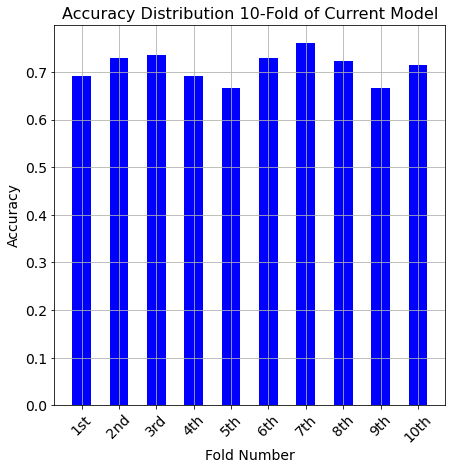

<Figure size 504x504 with 0 Axes>

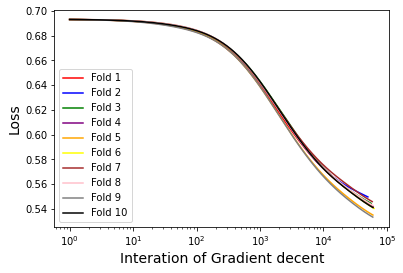

<Figure size 504x504 with 0 Axes>

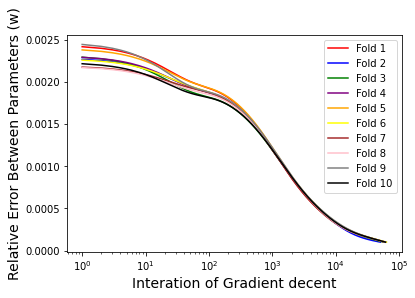

-------- Now testing learing rate is 0.025--------
No.1 fold start
interations  41348
No.2 fold start
interations  35680
No.3 fold start
interations  40296
No.4 fold start
interations  42462
No.5 fold start
interations  43116
No.6 fold start
interations  42228
No.7 fold start
interations  40254
No.8 fold start
interations  40550
No.9 fold start
interations  43876
No.10 fold start
interations  41938
Average Accuracy --> 0.708569182389937


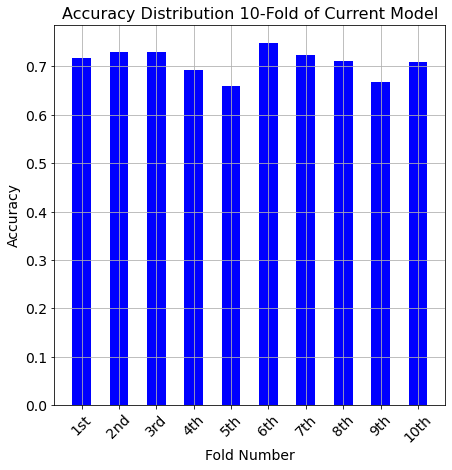

<Figure size 504x504 with 0 Axes>

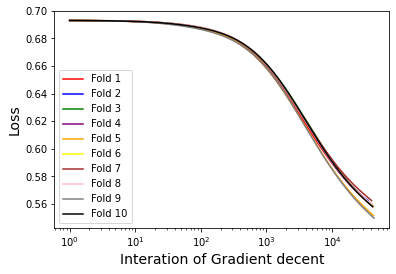

<Figure size 504x504 with 0 Axes>

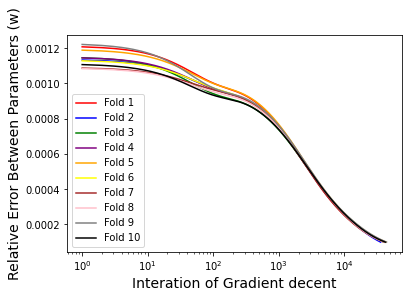

In [38]:
## Running for removing low correlation value between features and label 
print('-------- Remove Data Test2 Start --------')
# create list to save data
remove2_order3_accur=[]
remove2_order3_iteration=[]
# Load data again
wine_df = pd.read_csv('White_wine Quality.csv')
# remove two features that have low correlation to quality label -----> Alkalinity of ash and 'Proanthocyanins'
X_wine = wine_df[['Alcohol','Malic acid', 'Ash', 'Magnesium', 'Total phenols', 'Flavanoids', 'Nonflavanoid phenols', 'Hue']].to_numpy()
y_wine = wine_df['quality label'].to_numpy()
# shuffling data
X_wine, y_wine = shuffle(X_wine,y_wine)
# Test in linear order 3
#X_wine = featureStandardization(X_wine)
X_wine = changeModelOrder(3, X_wine)
## testing 7 different learning rates
learn_test = learn_para 
#--- setting decay rate 0.000001 ---
#--- when iterations up to 10^6, the learning rate will be 1/2*learning rate, and up to 10^7 will be ~1/10*learning rate --- 
for learn in learn_test:
  print('-------- Now testing learing rate is ' + str(learn) + '--------')
  all_acu, all_err, all_losses, all_interation = validation(k = 10,X = X_wine,y = y_wine, stop_threshold = 0.0001, learning_rate=learn, decay_rate = 0.000001)
  plot_results(all_acu, all_err, all_losses, all_interation)
  remove2_order3_accur.append(sum(all_acu)/10)
  remove2_order3_iteration.append(sum(all_interation)/10)

Test 5. Removing Alcohol feature(because have relatively high correlation to 3 other features, ~0.7)

-------- Remove Data Test3 Start --------
The order of the linear model is now: 3
The shape of X ---> 1599x36
-------- Now testing learing rate is 1--------
No.1 fold start
interations  188667
No.2 fold start
interations  171551
No.3 fold start
interations  174176
No.4 fold start
interations  185778
No.5 fold start
interations  174083
No.6 fold start
interations  194275
No.7 fold start
interations  185676
No.8 fold start
interations  202434
No.9 fold start
interations  184163
No.10 fold start
interations  206648
Average Accuracy --> 0.7263140161725066


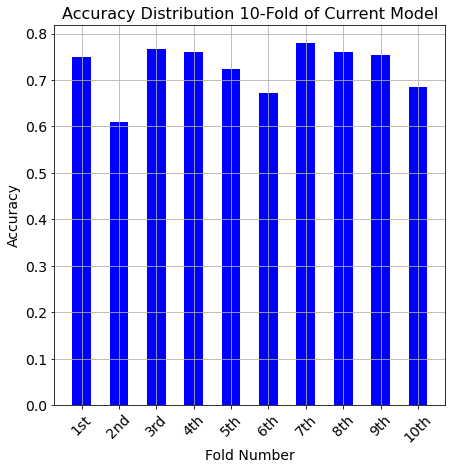

<Figure size 504x504 with 0 Axes>

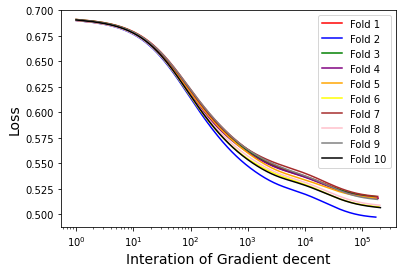

<Figure size 504x504 with 0 Axes>

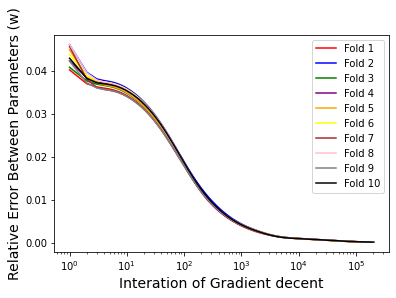

-------- Now testing learing rate is 0.75--------
No.1 fold start
interations  190941
No.2 fold start
interations  177889
No.3 fold start
interations  171422
No.4 fold start
interations  179822
No.5 fold start
interations  171123
No.6 fold start
interations  184341
No.7 fold start
interations  186094
No.8 fold start
interations  195269
No.9 fold start
interations  187421
No.10 fold start
interations  196500
Average Accuracy --> 0.7287960467205751


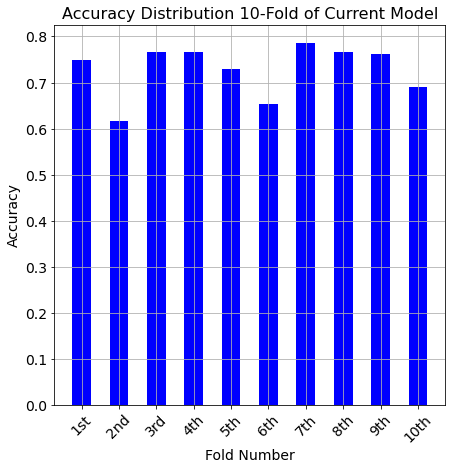

<Figure size 504x504 with 0 Axes>

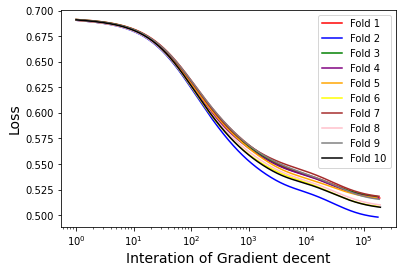

<Figure size 504x504 with 0 Axes>

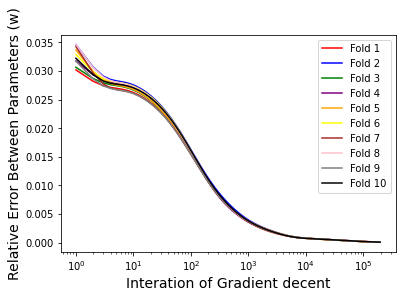

-------- Now testing learing rate is 0.5--------
No.1 fold start
interations  196071
No.2 fold start
interations  187671
No.3 fold start
interations  174673
No.4 fold start
interations  180145
No.5 fold start
interations  171489
No.6 fold start
interations  185115
No.7 fold start
interations  191157
No.8 fold start
interations  195816
No.9 fold start
interations  196277
No.10 fold start
interations  192971
Average Accuracy --> 0.7281671159029651


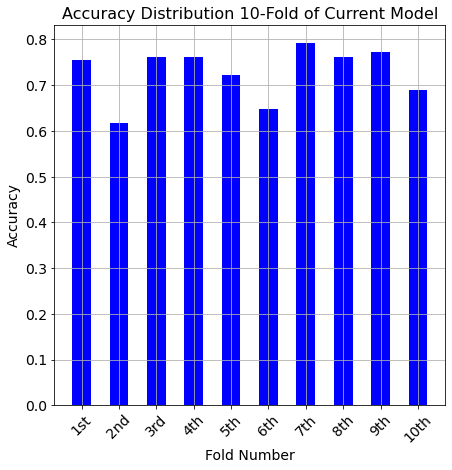

<Figure size 504x504 with 0 Axes>

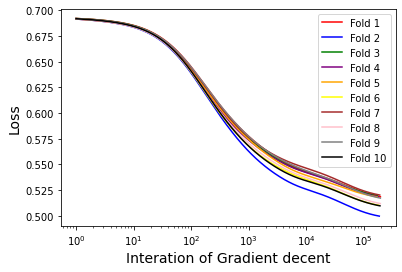

<Figure size 504x504 with 0 Axes>

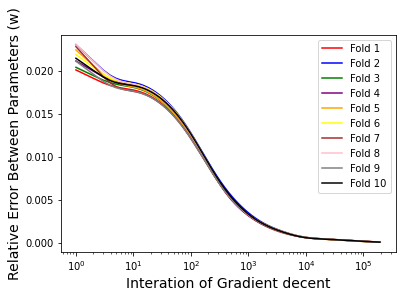

-------- Now testing learing rate is 0.25--------
No.1 fold start
interations  180090
No.2 fold start
interations  183543
No.3 fold start
interations  164076
No.4 fold start
interations  168895
No.5 fold start
interations  155369
No.6 fold start
interations  175893
No.7 fold start
interations  180876
No.8 fold start
interations  179379
No.9 fold start
interations  189303
No.10 fold start
interations  175454
Average Accuracy --> 0.729458670260557


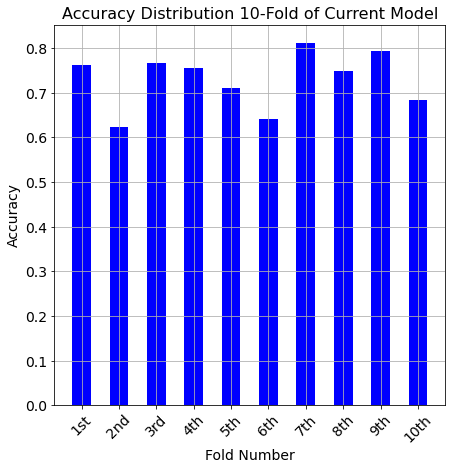

<Figure size 504x504 with 0 Axes>

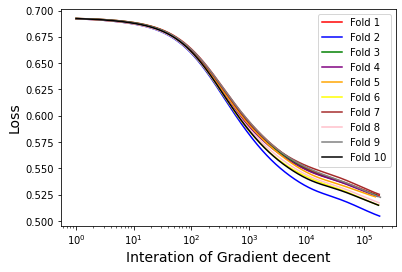

<Figure size 504x504 with 0 Axes>

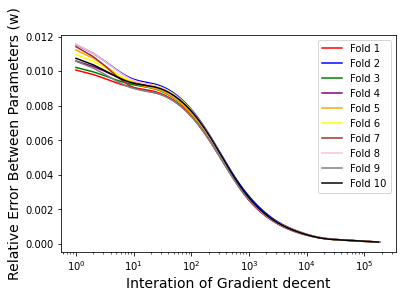

-------- Now testing learing rate is 0.1--------
No.1 fold start
interations  72069
No.2 fold start
interations  74608
No.3 fold start
interations  69129
No.4 fold start
interations  69660
No.5 fold start
interations  68721
No.6 fold start
interations  74700
No.7 fold start
interations  76119
No.8 fold start
interations  70591
No.9 fold start
interations  76963
No.10 fold start
interations  67495
Average Accuracy --> 0.7245283018867925


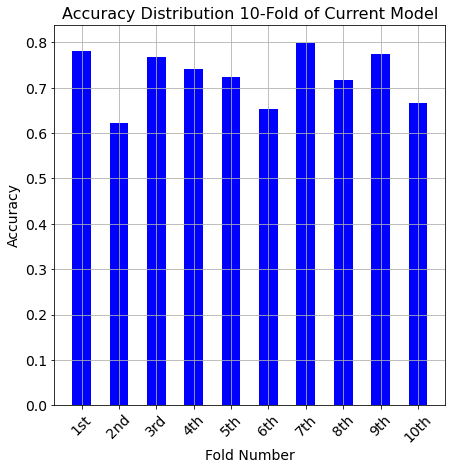

<Figure size 504x504 with 0 Axes>

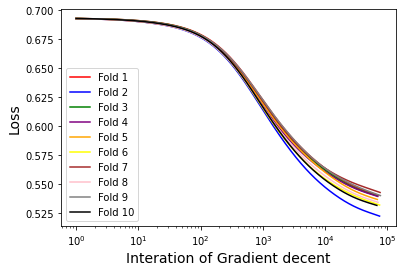

<Figure size 504x504 with 0 Axes>

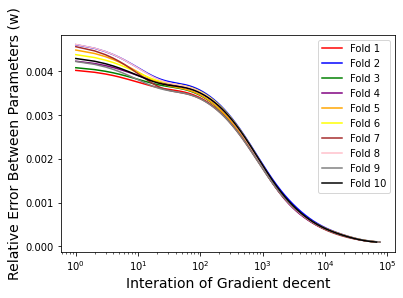

-------- Now testing learing rate is 0.05--------
No.1 fold start
interations  53605
No.2 fold start
interations  55253
No.3 fold start
interations  52922
No.4 fold start
interations  51312
No.5 fold start
interations  54719
No.6 fold start
interations  51736
No.7 fold start
interations  47916
No.8 fold start
interations  53404
No.9 fold start
interations  52513
No.10 fold start
interations  52231
Average Accuracy --> 0.7225741239892184


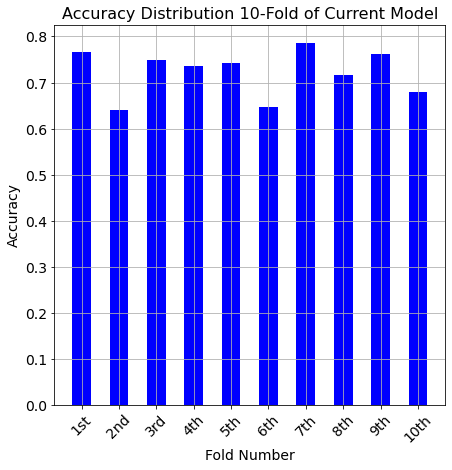

<Figure size 504x504 with 0 Axes>

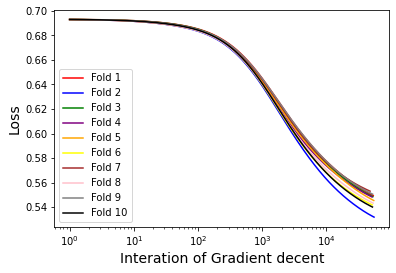

<Figure size 504x504 with 0 Axes>

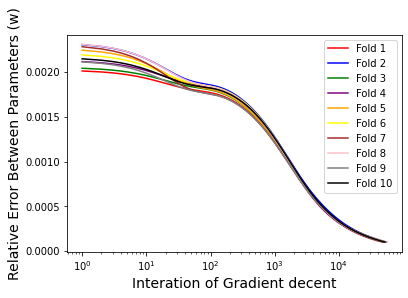

-------- Now testing learing rate is 0.025--------
No.1 fold start
interations  40804
No.2 fold start
interations  43352
No.3 fold start
interations  39815
No.4 fold start
interations  38284
No.5 fold start
interations  41720
No.6 fold start
interations  39182
No.7 fold start
interations  37393
No.8 fold start
interations  40067
No.9 fold start
interations  39908
No.10 fold start
interations  40779
Average Accuracy --> 0.7000336927223719


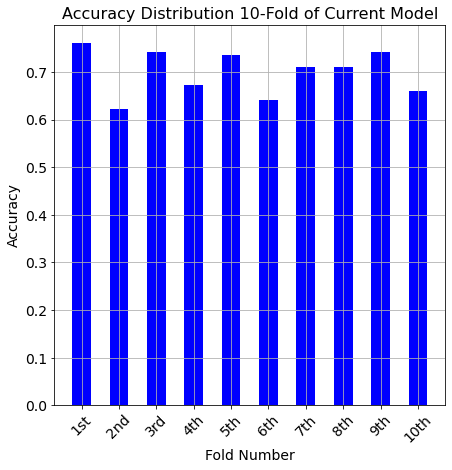

<Figure size 504x504 with 0 Axes>

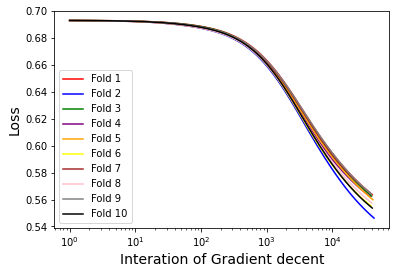

<Figure size 504x504 with 0 Axes>

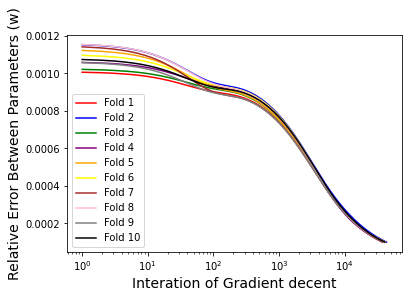

In [39]:
## Running for Removing Alcohol feature
print('-------- Remove Data Test3 Start --------')
# create list to save data
remove3_order3_accur=[]
remove3_order3_iteration=[]
# Load data again
wine_df = pd.read_csv('White_wine Quality.csv')
# remove one feature that have relatively high correlation to 3 other features -----> Alcohol
X_wine = wine_df[['Malic acid', 'Ash', 'Alkalinity of ash', 'Magnesium', 'Total phenols', 'Flavanoids', 'Nonflavanoid phenols', 'Proanthocyanins', 'Hue']].to_numpy()
y_wine = wine_df['quality label'].to_numpy()
# shuffling data
X_wine, y_wine = shuffle(X_wine,y_wine)
# Test in linear order 3
#X_wine = featureStandardization(X_wine)
X_wine = changeModelOrder(3, X_wine)
## testing 7 different learning rates
learn_test = learn_para  
#--- setting decay rate 0.000001 ---
#--- when iterations up to 10^6, the learning rate will be 1/2*learning rate, and up to 10^7 will be ~1/10*learning rate --- 
for learn in learn_test:
  print('-------- Now testing learing rate is ' + str(learn) + '--------')
  all_acu, all_err, all_losses, all_interation = validation(k = 10,X = X_wine,y = y_wine, stop_threshold = 0.0001, learning_rate=learn, decay_rate = 0.000001)
  plot_results(all_acu, all_err, all_losses, all_interation)
  remove3_order3_accur.append(sum(all_acu)/10)
  remove3_order3_iteration.append(sum(all_interation)/10)

Test 6. use log transform to make the distribution has less skewness for some features

-------- log transform Data Test Start --------


<ipython-input-40-31cbfd76c38c>:15: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  temp.hist(bins=100, ax=ax)


The order of the linear model is now: 3
The shape of X ---> 1599x40
-------- Now testing learing rate is 1--------
No.1 fold start
interations  130685
No.2 fold start
interations  96941
No.3 fold start
interations  137999
No.4 fold start
interations  103625
No.5 fold start
interations  106961
No.6 fold start
interations  113596
No.7 fold start
interations  130154
No.8 fold start
interations  109645
No.9 fold start
interations  124191
No.10 fold start
interations  109551
Average Accuracy --> 0.7271338724168912


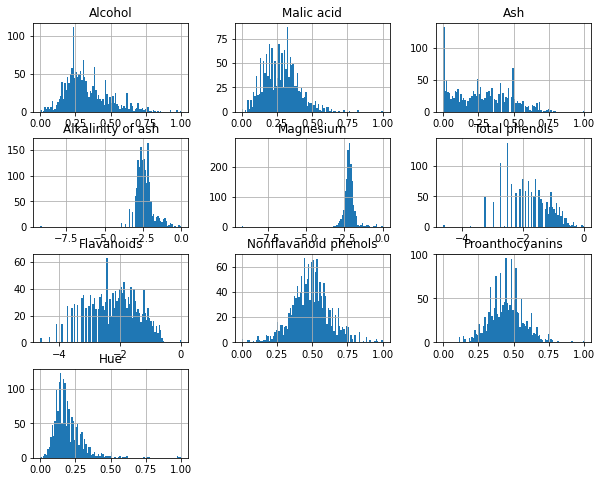

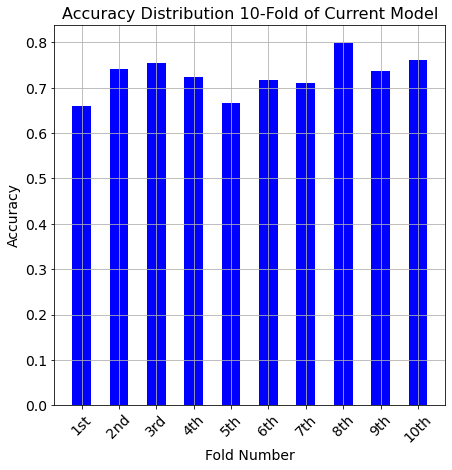

<Figure size 504x504 with 0 Axes>

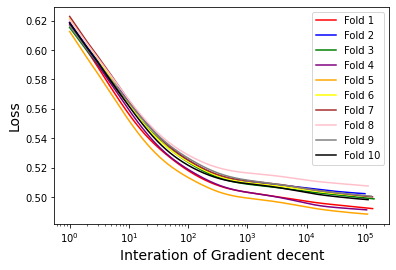

<Figure size 504x504 with 0 Axes>

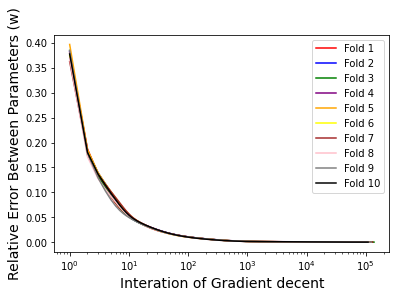

-------- Now testing learing rate is 0.75--------
No.1 fold start
interations  113122
No.2 fold start
interations  86642
No.3 fold start
interations  121429
No.4 fold start
interations  86275
No.5 fold start
interations  98774
No.6 fold start
interations  100482
No.7 fold start
interations  119785
No.8 fold start
interations  95410
No.9 fold start
interations  109080
No.10 fold start
interations  100118
Average Accuracy --> 0.7271338724168912


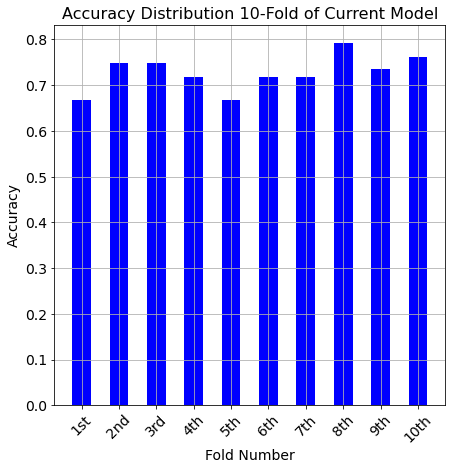

<Figure size 504x504 with 0 Axes>

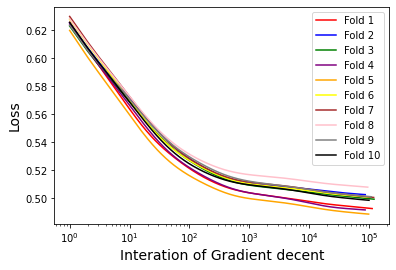

<Figure size 504x504 with 0 Axes>

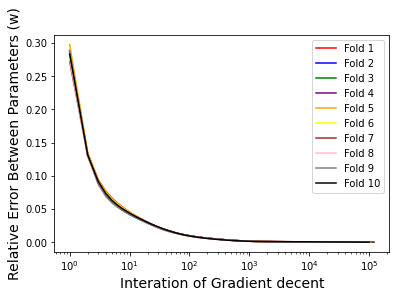

-------- Now testing learing rate is 0.5--------
No.1 fold start
interations  79457
No.2 fold start
interations  70211
No.3 fold start
interations  79864
No.4 fold start
interations  66299
No.5 fold start
interations  79508
No.6 fold start
interations  73562
No.7 fold start
interations  87924
No.8 fold start
interations  67556
No.9 fold start
interations  79409
No.10 fold start
interations  80324
Average Accuracy --> 0.725280772686433


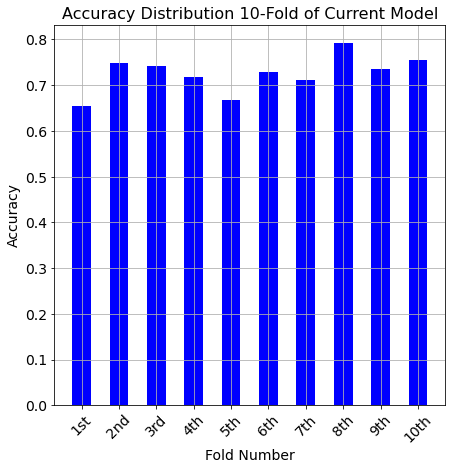

<Figure size 504x504 with 0 Axes>

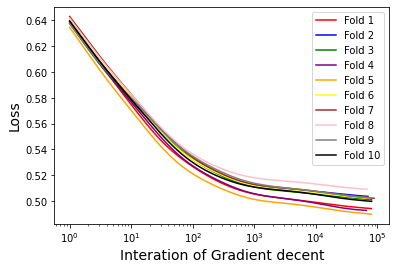

<Figure size 504x504 with 0 Axes>

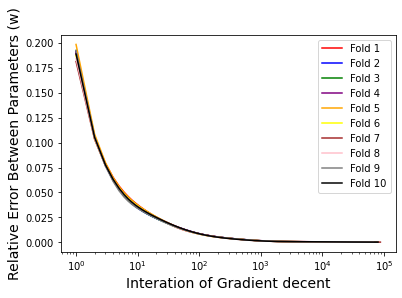

-------- Now testing learing rate is 0.25--------
No.1 fold start
interations  55056
No.2 fold start
interations  50344
No.3 fold start
interations  50550
No.4 fold start
interations  63595
No.5 fold start
interations  60750
No.6 fold start
interations  54500
No.7 fold start
interations  59124
No.8 fold start
interations  51017
No.9 fold start
interations  57393
No.10 fold start
interations  60051
Average Accuracy --> 0.7290543575920936


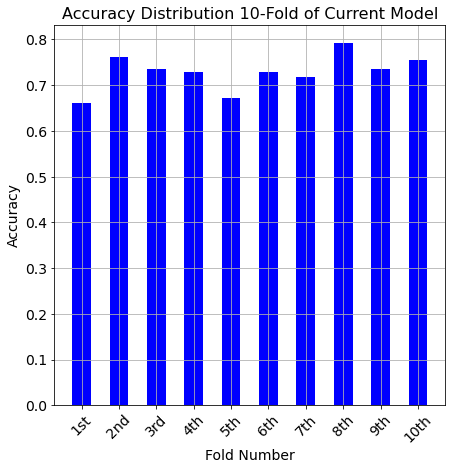

<Figure size 504x504 with 0 Axes>

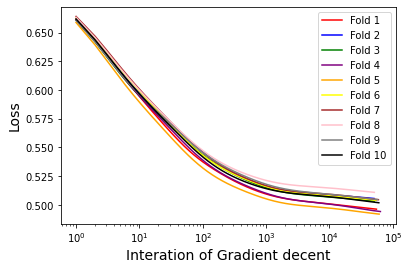

<Figure size 504x504 with 0 Axes>

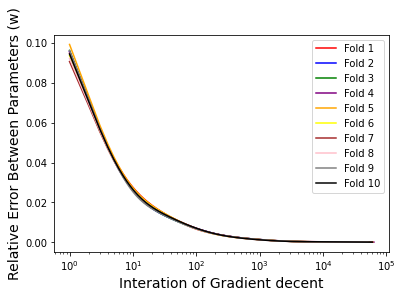

-------- Now testing learing rate is 0.1--------
No.1 fold start
interations  24300
No.2 fold start
interations  15200
No.3 fold start
interations  18638
No.4 fold start
interations  29415
No.5 fold start
interations  22309
No.6 fold start
interations  18037
No.7 fold start
interations  17964
No.8 fold start
interations  16480
No.9 fold start
interations  21435
No.10 fold start
interations  21914
Average Accuracy --> 0.7272349505840072


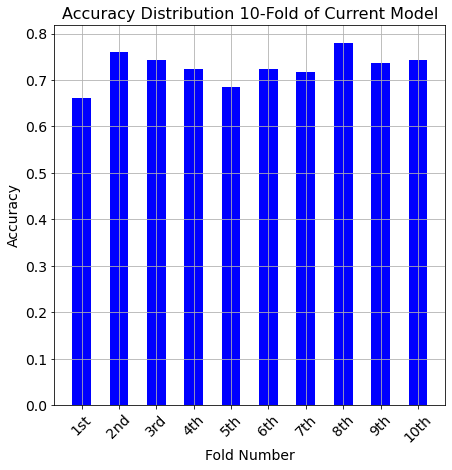

<Figure size 504x504 with 0 Axes>

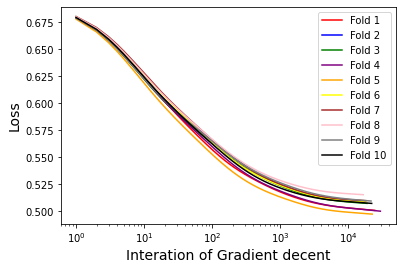

<Figure size 504x504 with 0 Axes>

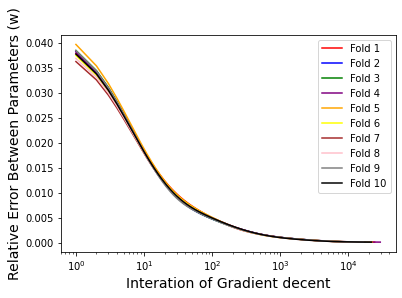

-------- Now testing learing rate is 0.05--------
No.1 fold start
interations  15259
No.2 fold start
interations  14242
No.3 fold start
interations  14688
No.4 fold start
interations  15979
No.5 fold start
interations  14253
No.6 fold start
interations  14491
No.7 fold start
interations  13641
No.8 fold start
interations  12937
No.9 fold start
interations  15617
No.10 fold start
interations  13203
Average Accuracy --> 0.7316374663072776


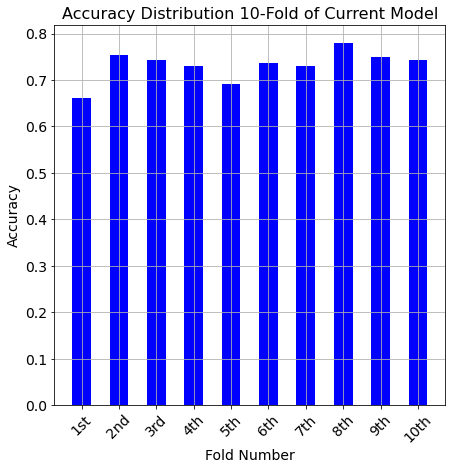

<Figure size 504x504 with 0 Axes>

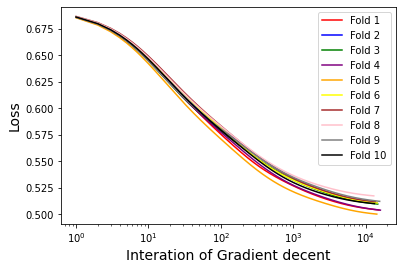

<Figure size 504x504 with 0 Axes>

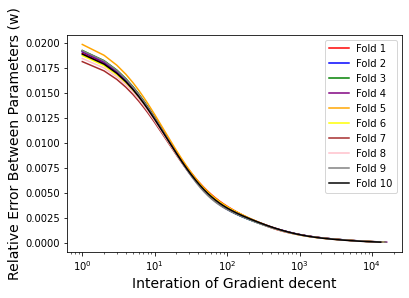

-------- Now testing learing rate is 0.025--------
No.1 fold start
interations  14073
No.2 fold start
interations  14431
No.3 fold start
interations  14254
No.4 fold start
interations  14996
No.5 fold start
interations  14106
No.6 fold start
interations  14123
No.7 fold start
interations  13877
No.8 fold start
interations  12655
No.9 fold start
interations  14450
No.10 fold start
interations  12733
Average Accuracy --> 0.7392520215633422


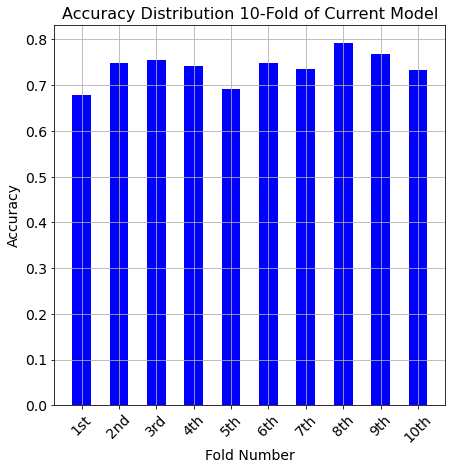

<Figure size 504x504 with 0 Axes>

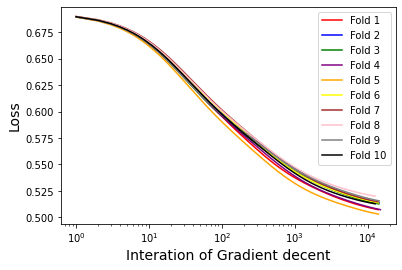

<Figure size 504x504 with 0 Axes>

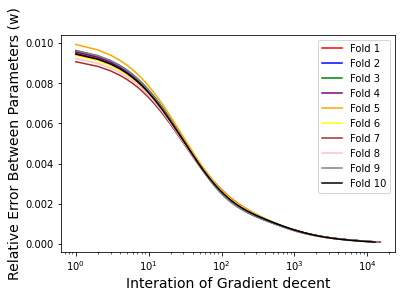

In [40]:
## Running for the log transformr data
print('-------- log transform Data Test Start --------')
# create list to save data
remove4_order3_accur=[]
remove4_order3_iteration=[]
# Load data again
wine_df = pd.read_csv('White_wine Quality.csv')
wine_df[['Alkalinity of ash', 'Magnesium']] = wine_df[['Alkalinity of ash', 'Magnesium']] + 0.0001
wine_df[['Alkalinity of ash', 'Magnesium']] = wine_df[['Alkalinity of ash', 'Magnesium']].apply(np.log)
wine_df[['Total phenols', 'Flavanoids']] = wine_df[['Total phenols', 'Flavanoids']] + 0.01
wine_df[['Total phenols', 'Flavanoids']] = wine_df[['Total phenols', 'Flavanoids']].apply(np.log)
# check again hist plot
fig, ax = plt.subplots(figsize=(10, 8))
temp = wine_df.drop('quality label', axis=1)
temp.hist(bins=100, ax=ax)
fig.show()
#
X_wine = wine_df[['Alcohol', 'Malic acid', 'Ash', 'Alkalinity of ash', 'Magnesium', 'Total phenols', 'Flavanoids', 'Nonflavanoid phenols', 'Proanthocyanins', 'Hue']].to_numpy()
y_wine = wine_df['quality label'].to_numpy()
# shuffling data
X_wine, y_wine = shuffle(X_wine,y_wine)
# Test in linear order 3
X_wine = changeModelOrder(3, X_wine)
X_wine = featureStandardization(X_wine)
## testing 7 different learning rates
learn_test = learn_para  
#--- setting decay rate 0.000001 ---
#--- when iterations up to 10^6, the learning rate will be 1/2*learning rate, and up to 10^7 will be ~1/10*learning rate --- 
for learn in learn_test:
  print('-------- Now testing learing rate is ' + str(learn) + '--------')
  all_acu, all_err, all_losses, all_interation = validation(k = 10,X = X_wine,y = y_wine, stop_threshold = 0.0001, learning_rate=learn, decay_rate = 0.000001)
  plot_results(all_acu, all_err, all_losses, all_interation)
  remove4_order3_accur.append(sum(all_acu)/10)
  remove4_order3_iteration.append(sum(all_interation)/10)

Plot the Third model result

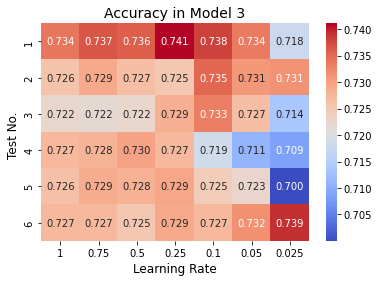

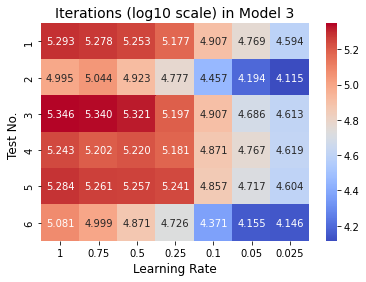

In [6]:
acc = np.array([raw_order3_accur, std_order3_accur, remove_order3_accur,remove2_order3_accur,remove3_order3_accur,remove4_order3_accur])
xticklabels = ['1', '0.75', '0.5', '0.25', '0.1', '0.05', '0.025']
yticklabels = ['1', '2', '3', '4', '5', '6']
ax = sns.heatmap(acc, annot=True, fmt='.3f', xticklabels=xticklabels, yticklabels=yticklabels, cmap='coolwarm')
ax.set_xlabel('Learning Rate', fontsize=12)
ax.set_ylabel('Test No. ', fontsize=12)
ax.set_title("Accuracy in Model 3", fontsize=14)
plt.show()

time = np.log10(np.array([raw_order3_iteration,std_order3_iteration,remove_order3_iteration,remove2_order3_iteration,remove3_order3_iteration,remove4_order3_iteration]))
xticklabels = ['1', '0.75', '0.5', '0.25', '0.1', '0.05', '0.025']
yticklabels = ['1', '2', '3', '4', '5', '6']
ax = sns.heatmap(time, annot=True, fmt='.3f', xticklabels=xticklabels, yticklabels=yticklabels, cmap='coolwarm')
ax.set_xlabel('Learning Rate', fontsize=12)
ax.set_ylabel('Test No. ', fontsize=12)
ax.set_title("Iterations (log10 scale) in Model 3", fontsize=14)
plt.show()

----------Final model select and optimization------------------    decrease stop threshold 

Select polynomial order3 and decrease stop threshold

-------- Raw Data Test Start --------
The order of the linear model is now: 3
The shape of X ---> 1599x40
-------- Now testing learing rate is 0.25--------
No.1 fold start
interations  185781
No.2 fold start
interations  199908
No.3 fold start
interations  196601
No.4 fold start
interations  199901
No.5 fold start
interations  201375
No.6 fold start
interations  227873
No.7 fold start
interations  201346
No.8 fold start
interations  214400
No.9 fold start
interations  189918
No.10 fold start
interations  188571
Average Accuracy --> 0.7386567834681043


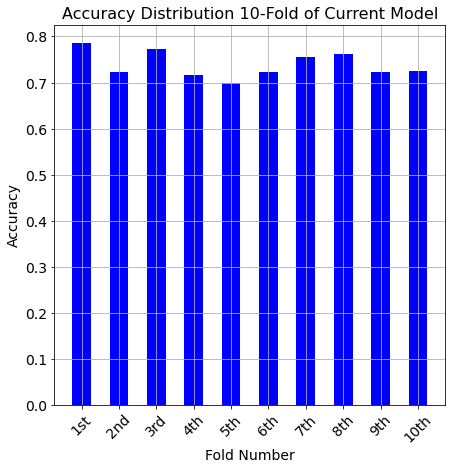

<Figure size 504x504 with 0 Axes>

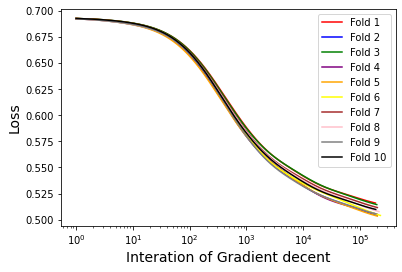

<Figure size 504x504 with 0 Axes>

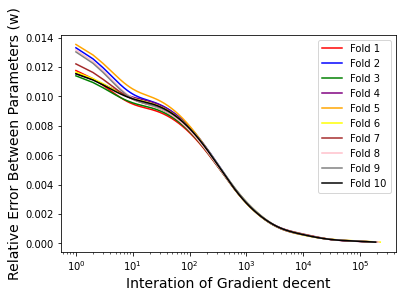

-------- Now testing learing rate is 0.3--------
No.1 fold start
interations  192737
No.2 fold start
interations  206880
No.3 fold start
interations  203339
No.4 fold start
interations  211846
No.5 fold start
interations  207421
No.6 fold start
interations  236500
No.7 fold start
interations  212865
No.8 fold start
interations  222717
No.9 fold start
interations  194992
No.10 fold start
interations  195036
Average Accuracy --> 0.7367699910152741


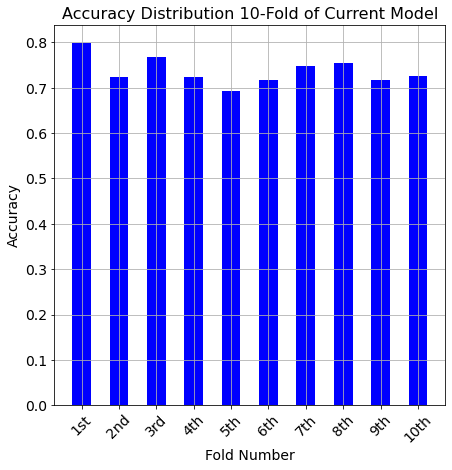

<Figure size 504x504 with 0 Axes>

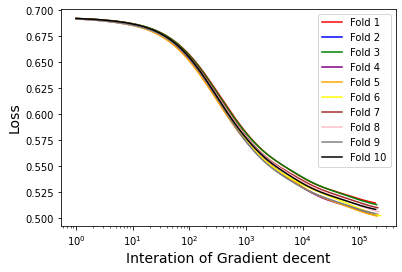

<Figure size 504x504 with 0 Axes>

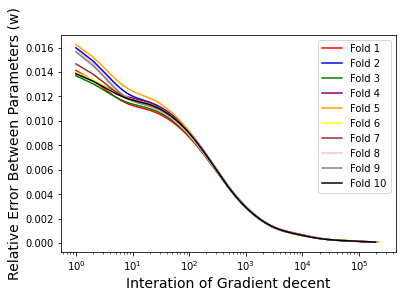

-------- Now testing learing rate is 0.2--------
No.1 fold start
interations  173672
No.2 fold start
interations  187622
No.3 fold start
interations  183871
No.4 fold start
interations  177565
No.5 fold start
interations  189936
No.6 fold start
interations  213403
No.7 fold start
interations  185028
No.8 fold start
interations  200698
No.9 fold start
interations  179629
No.10 fold start
interations  176977
Average Accuracy --> 0.7398809523809524


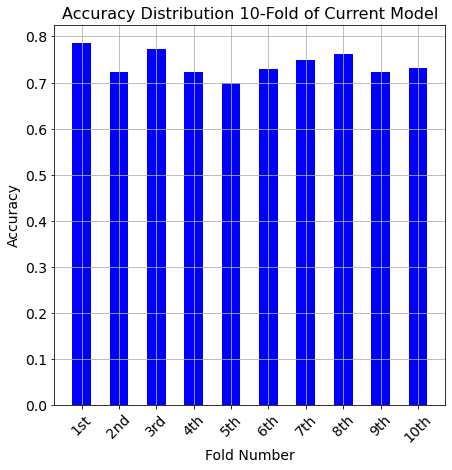

<Figure size 504x504 with 0 Axes>

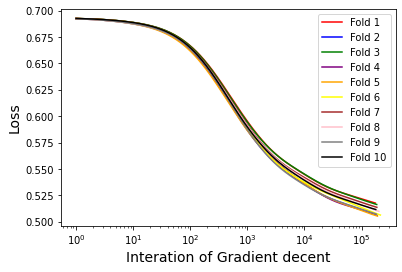

<Figure size 504x504 with 0 Axes>

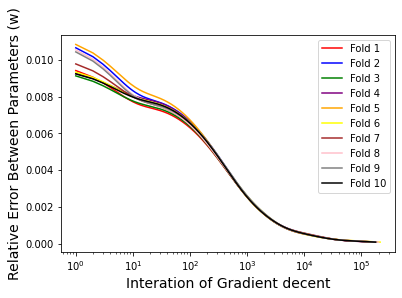

In [17]:
## Running for the raw data
print('-------- Raw Data Test Start --------')
# create list to save data
order3_accur=[]
order3_iteration=[]
# Load data again
wine_df = pd.read_csv('White_wine Quality.csv')
X_wine = wine_df[['Alcohol','Malic acid', 'Ash', 'Alkalinity of ash', 'Magnesium', 'Total phenols', 'Flavanoids', 'Nonflavanoid phenols', 'Proanthocyanins', 'Hue']].to_numpy()
y_wine = wine_df['quality label'].to_numpy()
# shuffling data
X_wine, y_wine = shuffle(X_wine,y_wine)
# Test in linear order 3
X_wine = changeModelOrder(3, X_wine)
## testing 7 different learning rates
learn_test = [0.25, 0.3, 0.2]
#--- setting decay rate 0.000001 ---
#--- when iterations up to 10^6, the learning rate will be 1/2*learning rate, and up to 10^7 for ~1/10*learning rate --- 
for learn in learn_test:
  print('-------- Now testing learing rate is ' + str(learn) + '--------')
  all_acu, all_err, all_losses, all_interation = validation(k = 10,X = X_wine,y = y_wine, stop_threshold = 0.00008, learning_rate=learn, decay_rate = 0.000001)
  plot_results(all_acu, all_err, all_losses, all_interation)
  order3_accur.append(sum(all_acu)/10)
  order3_iteration.append(sum(all_interation)/10)

Select polynomial order2 and decrease stop threshold

-------- Raw Data Test Start --------
The order of the linear model is now: 2
The shape of X ---> 1599x20
-------- Now testing learing rate is 0.1--------
No.1 fold start
interations  193857
No.2 fold start
interations  203654
No.3 fold start
interations  210721
No.4 fold start
interations  188339
No.5 fold start
interations  208753
No.6 fold start
interations  228508
No.7 fold start
interations  201670
No.8 fold start
interations  191121
No.9 fold start
interations  196481
No.10 fold start
interations  213733
Average Accuracy --> 0.7432614555256064


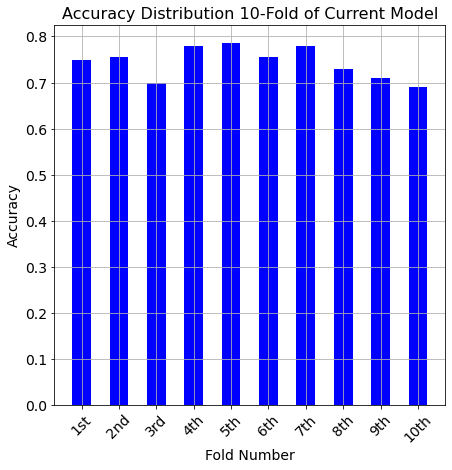

<Figure size 504x504 with 0 Axes>

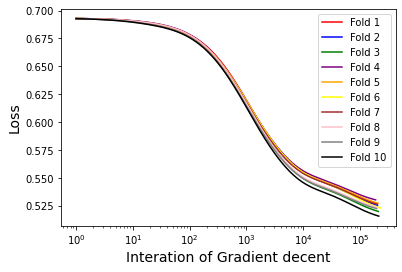

<Figure size 504x504 with 0 Axes>

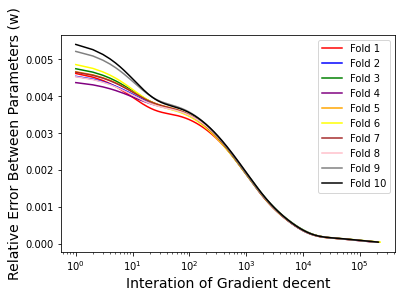

NameError: ignored

In [11]:
## Running for the raw data
print('-------- Raw Data Test Start --------')
# create list to save data
order2_accur=[]
order2_iteration=[]
# Load data again
wine_df = pd.read_csv('White_wine Quality.csv')
X_wine = wine_df[['Alcohol','Malic acid', 'Ash', 'Alkalinity of ash', 'Magnesium', 'Total phenols', 'Flavanoids', 'Nonflavanoid phenols', 'Proanthocyanins', 'Hue']].to_numpy()
y_wine = wine_df['quality label'].to_numpy()
# shuffling data
X_wine, y_wine = shuffle(X_wine,y_wine)
# Test in linear order 2
X_wine = changeModelOrder(2, X_wine)
## testing 7 different learning rates
learn_test = [0.1]
#--- setting decay rate 0.000001 ---
#--- when iterations up to 10^6, the learning rate will be 1/2*learning rate, and up to 10^7 for ~1/10*learning rate --- 
for learn in learn_test:
  print('-------- Now testing learing rate is ' + str(learn) + '--------')
  all_acu, all_err, all_losses, all_interation = validation(k = 10,X = X_wine,y = y_wine, stop_threshold = 0.00005, learning_rate=learn, decay_rate = 0.000001)
  plot_results(all_acu, all_err, all_losses, all_interation)
  order2_accur.append(sum(all_acu)/10)
  order2_iteration.append(sum(all_interation)/10)